In [203]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sklearn

## Reading the data
### There are 2 sheets so we will read it separately

In [204]:
xls = pd.ExcelFile('/home/monu/notebookProj/Pucho/21_World_Development_Indicators.xlsx')
data = pd.read_excel(xls, 'Data')
definition_source = pd.read_excel(xls, 'Definition and Source')

## Lets investigate and clean the data

In [205]:
definition_source

,Code,Indicator Name,Long definition,Source
0,NY.GDP.MKTP.CD,GDP (current US$),GDP at purchaser's prices is the sum of gross ...,"World Bank national accounts data, and OECD Na..."
1,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na..."
2,SP.DYN.CBRT.IN,"Birth rate, crude (per 1,000 people)",Crude birth rate indicates the number of live ...,(1) United Nations Population Division. World ...
3,SP.DYN.CDRT.IN,"Death rate, crude (per 1,000 people)",Crude death rate indicates the number of death...,(1) United Nations Population Division. World ...
4,SP.DYN.LE00.IN,"Life expectancy at birth, total (years)",Life expectancy at birth indicates the number ...,Derived from male and female life expectancy a...
5,SL.TLF.TOTL.IN,"Labor force, total",Labor force comprises people ages 15 and older...,Derived using data from International Labour O...
6,NE.IMP.GNFS.ZS,Imports of goods and services (% of GDP),Imports of goods and services represent the va...,"World Bank national accounts data, and OECD Na..."
7,NE.EXP.GNFS.ZS,Exports of goods and services (% of GDP),Exports of goods and services represent the va...,"World Bank national accounts data, and OECD Na..."
8,SH.STA.BASS.ZS,People using basic sanitation services (% of p...,The percentage of people using at least basic ...,WHO/UNICEF Joint Monitoring Programme (JMP) fo...
9,SP.POP.BRTH.MF,Sex ratio at birth (male births per female bir...,Sex ratio at birth refers to male births per f...,The United Nations Population Division's World...


In [206]:
data

,Country Name,Country Code,Series Name,Series Code,2008 [YR2008],2009 [YR2009],2010 [YR2010],2011 [YR2011],2012 [YR2012],2013 [YR2013],2014 [YR2014],2015 [YR2015],2016 [YR2016]
0,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,1.01905e+10,1.24869e+10,1.59368e+10,1.79302e+10,2.05365e+10,2.00463e+10,2.00502e+10,1.92156e+10,1.9469e+10
1,Afghanistan,AFG,GDP growth (annual %),NY.GDP.MKTP.KD.ZG,3.61137,21.0206,8.43329,6.11369,14.4347,1.95912,1.31253,1.11256,2.23227
2,Afghanistan,AFG,"Birth rate, crude (per 1,000 people)",SP.DYN.CBRT.IN,41.697,40.474,39.232,38.016,36.863,35.797,34.836,33.98,..
3,Afghanistan,AFG,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,8.742,8.403,8.095,7.816,7.563,7.331,7.118,6.924,..
4,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,60.2567,60.7646,61.2355,61.6742,62.093,62.5016,62.9027,63.2982,..
5,Afghanistan,AFG,"Labor force, total",SL.TLF.TOTL.IN,7390835,7549775,7766657,8126630,8560761,9051222,9567795,10087656,10551762
6,Afghanistan,AFG,Imports of goods and services (% of GDP),NE.IMP.GNFS.ZS,55.0725,42.1992,44.9435,44.1939,39.1424,49.7578,45.7739,48.8016,49.025
7,Afghanistan,AFG,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,17.993,14.7076,10.0238,6.10727,5.51685,6.3079,6.5677,7.00212,6.89625
8,Afghanistan,AFG,People using basic sanitation services (% of p...,SH.STA.BASS.ZS,31.3615,32.4559,33.5592,34.6718,35.794,36.926,38.0679,39.2204,..
9,Afghanistan,AFG,Sex ratio at birth (male births per female bir...,SP.POP.BRTH.MF,1.06,1.06,1.06,1.06,1.06,1.06,1.06,1.06,..


In [207]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2945 entries, 0 to 2944
Data columns (total 13 columns):
Country Name     2942 non-null object
Country Code     2940 non-null object
Series Name      2940 non-null object
Series Code      2940 non-null object
2008 [YR2008]    2940 non-null object
2009 [YR2009]    2940 non-null object
2010 [YR2010]    2940 non-null object
2011 [YR2011]    2940 non-null object
2012 [YR2012]    2940 non-null object
2013 [YR2013]    2940 non-null object
2014 [YR2014]    2940 non-null object
2015 [YR2015]    2940 non-null object
2016 [YR2016]    2940 non-null object
dtypes: object(13)
memory usage: 299.2+ KB


### From above info we see that we have to change the data types
### Also from looking at data we see that there are '..' which we have to replace with nan
### Lets start

In [208]:
data = data.replace('..', np.nan)

In [209]:
data.loc[:, '2008 [YR2008]' : '2016 [YR2016]'] = data.loc[:, '2008 [YR2008]' : '2016 [YR2016]'].astype('float')

### Just rechecking

In [210]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2945 entries, 0 to 2944
Data columns (total 13 columns):
Country Name     2942 non-null object
Country Code     2940 non-null object
Series Name      2940 non-null object
Series Code      2940 non-null object
2008 [YR2008]    2756 non-null float64
2009 [YR2009]    2755 non-null float64
2010 [YR2010]    2756 non-null float64
2011 [YR2011]    2759 non-null float64
2012 [YR2012]    2755 non-null float64
2013 [YR2013]    2757 non-null float64
2014 [YR2014]    2752 non-null float64
2015 [YR2015]    2474 non-null float64
2016 [YR2016]    1606 non-null float64
dtypes: float64(9), object(4)
memory usage: 299.2+ KB


In [211]:
data

,Country Name,Country Code,Series Name,Series Code,2008 [YR2008],2009 [YR2009],2010 [YR2010],2011 [YR2011],2012 [YR2012],2013 [YR2013],2014 [YR2014],2015 [YR2015],2016 [YR2016]
0,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,1.019053e+10,1.248694e+10,1.593680e+10,1.793024e+10,2.053654e+10,2.004633e+10,2.005019e+10,1.921556e+10,1.946902e+10
1,Afghanistan,AFG,GDP growth (annual %),NY.GDP.MKTP.KD.ZG,3.611368e+00,2.102065e+01,8.433290e+00,6.113685e+00,1.443474e+01,1.959123e+00,1.312531e+00,1.112558e+00,2.232272e+00
2,Afghanistan,AFG,"Birth rate, crude (per 1,000 people)",SP.DYN.CBRT.IN,4.169700e+01,4.047400e+01,3.923200e+01,3.801600e+01,3.686300e+01,3.579700e+01,3.483600e+01,3.398000e+01,NaN
3,Afghanistan,AFG,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,8.742000e+00,8.403000e+00,8.095000e+00,7.816000e+00,7.563000e+00,7.331000e+00,7.118000e+00,6.924000e+00,NaN
4,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,6.025673e+01,6.076461e+01,6.123546e+01,6.167424e+01,6.209298e+01,6.250161e+01,6.290268e+01,6.329820e+01,NaN
5,Afghanistan,AFG,"Labor force, total",SL.TLF.TOTL.IN,7.390835e+06,7.549775e+06,7.766657e+06,8.126630e+06,8.560761e+06,9.051222e+06,9.567795e+06,1.008766e+07,1.055176e+07
6,Afghanistan,AFG,Imports of goods and services (% of GDP),NE.IMP.GNFS.ZS,5.507255e+01,4.219923e+01,4.494348e+01,4.419395e+01,3.914240e+01,4.975777e+01,4.577388e+01,4.880162e+01,4.902498e+01
7,Afghanistan,AFG,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,1.799297e+01,1.470759e+01,1.002385e+01,6.107274e+00,5.516850e+00,6.307895e+00,6.567700e+00,7.002117e+00,6.896250e+00
8,Afghanistan,AFG,People using basic sanitation services (% of p...,SH.STA.BASS.ZS,3.136154e+01,3.245585e+01,3.355919e+01,3.467182e+01,3.579401e+01,3.692604e+01,3.806794e+01,3.922043e+01,NaN
9,Afghanistan,AFG,Sex ratio at birth (male births per female bir...,SP.POP.BRTH.MF,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,NaN


### No. of rows and columns

In [212]:
print("data Shape : {}".format(data.shape))

data Shape : (2945, 13)


### Name of the columns

In [213]:
data.columns

Index(['Country Name', 'Country Code', 'Series Name', 'Series Code',
       '2008 [YR2008]', '2009 [YR2009]', '2010 [YR2010]', '2011 [YR2011]',
       '2012 [YR2012]', '2013 [YR2013]', '2014 [YR2014]', '2015 [YR2015]',
       '2016 [YR2016]'],
      dtype='object')

### Missing values

In [214]:
print(pd.isnull(data).sum())

Country Name        3
Country Code        5
Series Name         5
Series Code         5
2008 [YR2008]     189
2009 [YR2009]     190
2010 [YR2010]     189
2011 [YR2011]     186
2012 [YR2012]     190
2013 [YR2013]     188
2014 [YR2014]     193
2015 [YR2015]     471
2016 [YR2016]    1339
dtype: int64


### Percentage of missing values

In [215]:
total_cells = np.product(data.shape)
total_missing_values = (data.isnull().sum()).sum()

print('percentage of missing vales : {0:.2f}' .format((total_missing_values/total_cells)*100))

percentage of missing vales : 8.24


### As we can see below the last  three rows (i.e nan, Data from database: World Development Indicators', Last Updated: 12/22/2017) are not country name

In [216]:
print(data['Country Name'].unique())

['Afghanistan' 'Albania' 'Algeria' 'Argentina' 'Armenia' 'Australia'
 'Austria' 'Azerbaijan' 'Bahrain' 'Bangladesh' 'Belgium' 'Bhutan'
 'Bolivia' 'Botswana' 'Brazil' 'Bulgaria' 'Cambodia' 'Cameroon' 'Canada'
 'Chile' 'China' 'Colombia' 'Congo, Dem. Rep.' 'Costa Rica'
 "Cote d'Ivoire" 'Croatia' 'Cyprus' 'Czech Republic' 'Denmark'
 'Dominican Republic' 'Ecuador' 'Egypt, Arab Rep.' 'El Salvador' 'Estonia'
 'Ethiopia' 'Finland' 'France' 'Germany' 'Ghana' 'Greece' 'Greenland'
 'Guinea' 'Guinea-Bissau' 'Haiti' 'Honduras' 'Hong Kong SAR, China'
 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran, Islamic Rep.' 'Iraq'
 'Ireland' 'Israel' 'Italy' 'Jamaica' 'Japan' 'Jordan' 'Kazakhstan'
 'Kenya' 'Korea, Dem. People’s Rep.' 'Korea, Rep.' 'Kuwait'
 'Kyrgyz Republic' 'Lebanon' 'Lesotho' 'Liberia' 'Libya' 'Lithuania'
 'Luxembourg' 'Macao SAR, China' 'Malaysia' 'Maldives' 'Mali' 'Malta'
 'Mauritius' 'Mexico' 'Moldova' 'Monaco' 'Mongolia' 'Montenegro' 'Morocco'
 'Mozambique' 'Myanmar' 'Namibia' 'Nepal' 'Ne

### Frequency of each country
### Note the last two rows are not country name

In [217]:
print(data['Country Name'].value_counts())

Cameroon                                            21
Jamaica                                             21
Indonesia                                           21
Singapore                                           21
Hungary                                             21
Luxembourg                                          21
Canada                                              21
Kuwait                                              21
Niger                                               21
Moldova                                             21
Panama                                              21
Finland                                             21
Germany                                             21
Bolivia                                             21
Haiti                                               21
Namibia                                             21
Croatia                                             21
Korea, Rep.                                         21
Somalia   

### The last 5 rows are Nan and useless

In [218]:
data.tail(10)

,Country Name,Country Code,Series Name,Series Code,2008 [YR2008],2009 [YR2009],2010 [YR2010],2011 [YR2011],2012 [YR2012],2013 [YR2013],2014 [YR2014],2015 [YR2015],2016 [YR2016]
2935,Togo,TGO,GNI growth (annual %),NY.GNP.MKTP.KD.ZG,-6.702584,3.184537,2.851453,3.089404,7.175750,NaN,NaN,6.149880,6.862517
2936,Togo,TGO,People using basic drinking water services (% ...,SH.H2O.BASW.ZS,54.700251,55.860770,57.021119,58.180360,59.340298,60.499538,61.65851,62.817638,NaN
2937,Togo,TGO,"Mortality rate, infant (per 1,000 live births)",SP.DYN.IMRT.IN,62.000000,60.500000,59.000000,57.500000,56.200000,54.800000,53.40000,52.100000,50.700000
2938,Togo,TGO,"Unemployment, total (% of total labor force) (...",SL.UEM.TOTL.ZS,6.300000,6.300000,6.300000,6.300000,6.300000,6.200000,6.20000,6.200000,6.200000
2939,Togo,TGO,CPIA building human resources rating (1=low to...,IQ.CPA.HRES.XQ,3.000000,3.000000,3.000000,3.500000,3.500000,3.500000,3.50000,3.500000,3.500000
2940,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2943,Data from database: World Development Indicators,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2944,Last Updated: 12/22/2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Lets drop these last 5 missing rows first

In [219]:
partially_cleaned_data = data.dropna(thresh = 2)

In [220]:
pd.isnull(partially_cleaned_data).sum()

Country Name        0
Country Code        0
Series Name         0
Series Code         0
2008 [YR2008]     184
2009 [YR2009]     185
2010 [YR2010]     184
2011 [YR2011]     181
2012 [YR2012]     185
2013 [YR2013]     183
2014 [YR2014]     188
2015 [YR2015]     466
2016 [YR2016]    1334
dtype: int64

In [221]:
partially_cleaned_data.shape

(2940, 13)

### The 2016 column have almost half of the values missing
### So we will drop it

In [222]:
partially_cleaned_data = partially_cleaned_data.drop('2016 [YR2016]', axis = 1)

### Lets check the missing values again

In [223]:
pd.isnull(partially_cleaned_data).sum()

Country Name       0
Country Code       0
Series Name        0
Series Code        0
2008 [YR2008]    184
2009 [YR2009]    185
2010 [YR2010]    184
2011 [YR2011]    181
2012 [YR2012]    185
2013 [YR2013]    183
2014 [YR2014]    188
2015 [YR2015]    466
dtype: int64

In [224]:
partially_cleaned_data

,Country Name,Country Code,Series Name,Series Code,2008 [YR2008],2009 [YR2009],2010 [YR2010],2011 [YR2011],2012 [YR2012],2013 [YR2013],2014 [YR2014],2015 [YR2015]
0,Afghanistan,AFG,GDP (current US$),NY.GDP.MKTP.CD,1.019053e+10,1.248694e+10,1.593680e+10,1.793024e+10,2.053654e+10,2.004633e+10,2.005019e+10,1.921556e+10
1,Afghanistan,AFG,GDP growth (annual %),NY.GDP.MKTP.KD.ZG,3.611368e+00,2.102065e+01,8.433290e+00,6.113685e+00,1.443474e+01,1.959123e+00,1.312531e+00,1.112558e+00
2,Afghanistan,AFG,"Birth rate, crude (per 1,000 people)",SP.DYN.CBRT.IN,4.169700e+01,4.047400e+01,3.923200e+01,3.801600e+01,3.686300e+01,3.579700e+01,3.483600e+01,3.398000e+01
3,Afghanistan,AFG,"Death rate, crude (per 1,000 people)",SP.DYN.CDRT.IN,8.742000e+00,8.403000e+00,8.095000e+00,7.816000e+00,7.563000e+00,7.331000e+00,7.118000e+00,6.924000e+00
4,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,6.025673e+01,6.076461e+01,6.123546e+01,6.167424e+01,6.209298e+01,6.250161e+01,6.290268e+01,6.329820e+01
5,Afghanistan,AFG,"Labor force, total",SL.TLF.TOTL.IN,7.390835e+06,7.549775e+06,7.766657e+06,8.126630e+06,8.560761e+06,9.051222e+06,9.567795e+06,1.008766e+07
6,Afghanistan,AFG,Imports of goods and services (% of GDP),NE.IMP.GNFS.ZS,5.507255e+01,4.219923e+01,4.494348e+01,4.419395e+01,3.914240e+01,4.975777e+01,4.577388e+01,4.880162e+01
7,Afghanistan,AFG,Exports of goods and services (% of GDP),NE.EXP.GNFS.ZS,1.799297e+01,1.470759e+01,1.002385e+01,6.107274e+00,5.516850e+00,6.307895e+00,6.567700e+00,7.002117e+00
8,Afghanistan,AFG,People using basic sanitation services (% of p...,SH.STA.BASS.ZS,3.136154e+01,3.245585e+01,3.355919e+01,3.467182e+01,3.579401e+01,3.692604e+01,3.806794e+01,3.922043e+01
9,Afghanistan,AFG,Sex ratio at birth (male births per female bir...,SP.POP.BRTH.MF,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00,1.060000e+00


### Drop the 'country code' and 'series code' columns

In [225]:
partially_cleaned_data = partially_cleaned_data.drop(['Country Code', 'Series Code'], axis = 1)

In [226]:
partially_cleaned_data.shape

(2940, 10)

In [227]:
print(partially_cleaned_data['Country Name'].unique())

['Afghanistan' 'Albania' 'Algeria' 'Argentina' 'Armenia' 'Australia'
 'Austria' 'Azerbaijan' 'Bahrain' 'Bangladesh' 'Belgium' 'Bhutan'
 'Bolivia' 'Botswana' 'Brazil' 'Bulgaria' 'Cambodia' 'Cameroon' 'Canada'
 'Chile' 'China' 'Colombia' 'Congo, Dem. Rep.' 'Costa Rica'
 "Cote d'Ivoire" 'Croatia' 'Cyprus' 'Czech Republic' 'Denmark'
 'Dominican Republic' 'Ecuador' 'Egypt, Arab Rep.' 'El Salvador' 'Estonia'
 'Ethiopia' 'Finland' 'France' 'Germany' 'Ghana' 'Greece' 'Greenland'
 'Guinea' 'Guinea-Bissau' 'Haiti' 'Honduras' 'Hong Kong SAR, China'
 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran, Islamic Rep.' 'Iraq'
 'Ireland' 'Israel' 'Italy' 'Jamaica' 'Japan' 'Jordan' 'Kazakhstan'
 'Kenya' 'Korea, Dem. People’s Rep.' 'Korea, Rep.' 'Kuwait'
 'Kyrgyz Republic' 'Lebanon' 'Lesotho' 'Liberia' 'Libya' 'Lithuania'
 'Luxembourg' 'Macao SAR, China' 'Malaysia' 'Maldives' 'Mali' 'Malta'
 'Mauritius' 'Mexico' 'Moldova' 'Monaco' 'Mongolia' 'Montenegro' 'Morocco'
 'Mozambique' 'Myanmar' 'Namibia' 'Nepal' 'Ne

In [228]:
print(partially_cleaned_data['Country Name'].nunique())

140


In [229]:
print(partially_cleaned_data['Country Name'].value_counts())

Cameroon                21
Jamaica                 21
Indonesia               21
Singapore               21
Hungary                 21
Luxembourg              21
Canada                  21
Kuwait                  21
Niger                   21
Moldova                 21
Panama                  21
Finland                 21
Germany                 21
Bolivia                 21
Haiti                   21
Namibia                 21
Croatia                 21
Korea, Rep.             21
Somalia                 21
El Salvador             21
Paraguay                21
Bangladesh              21
Samoa                   21
France                  21
United States           21
Lebanon                 21
Macao SAR, China        21
Hong Kong SAR, China    21
Italy                   21
Liberia                 21
                        ..
Dominican Republic      21
Sri Lanka               21
Estonia                 21
Philippines             21
Honduras                21
Zimbabwe                21
M

### Now we will wrangle the data a bit

In [230]:
wrangle_data = partially_cleaned_data.set_index(['Country Name', 'Series Name'])

In [231]:
wrangle_data = wrangle_data.sort_index()
wrangle_data

2008 [YR2008]  \
Country Name Series Name                                                         
Afghanistan  Access to electricity (% of population)              4.240000e+01   
             Birth rate, crude (per 1,000 people)                 4.169700e+01   
             CPIA building human resources rating (1=low to ...   3.000000e+00   
             Compulsory education, duration (years)               9.000000e+00   
             Death rate, crude (per 1,000 people)                 8.742000e+00   
             Exports of goods and services (% of GDP)             1.799297e+01   
             GDP (current US$)                                    1.019053e+10   
             GDP growth (annual %)                                3.611368e+00   
             GNI (current US$)                                    1.023353e+10   
             GNI growth (annual %)                                         NaN   
             Health expenditure, total (% of GDP)                 8.328093e+00   
             Imports of goods and services (% of GDP)             5.507255e+01   
             Labor force, total                                   7.390835e+06   
             Life expectancy at birth, total (years)              6.025673e+01   
             Mortality rate, infant (per 1,000 live births)       7.080000e+01   
             People using basic drinking water services (% o...   4.491963e+01   
             People using basic sanitation services (% of po...   3.136154e+01   
             Population growth (annual %)                         2.512574e+00   
             Population, total                                    2.729403e+07   
             Sex ratio at birth (male births per female births)   1.060000e+00   
             Unemployment, total (% of total labor force) (m...   8.200000e+00   
Albania      Access to electricity (% of population)              1.000000e+02   
             Birth rate, crude (per 1,000 people)                 1.193300e+01   
             CPIA building human resources rating (1=low to ...            NaN   
             Compulsory education, duration (years)               8.000000e+00   
             Death rate, crude (per 1,000 people)                 6.640000e+00   
             Exports of goods and services (% of GDP)             2.530240e+01   
             GDP (current US$)                                    1.288135e+10   
             GDP growth (annual %)                                3.760854e+00   
             GNI (current US$)                                    1.294638e+10   
...                                                                        ...   
Zambia       Labor force, total                                   5.397056e+06   
             Life expectancy at birth, total (years)              5.368846e+01   
             Mortality rate, infant (per 1,000 live births)       5.840000e+01   
             People using basic drinking water services (% o...   5.542327e+01   
             People using basic sanitation services (% of po...   2.877576e+01   
             Population growth (annual %)                         2.763166e+00   
             Population, total                                    1.308252e+07   
             Sex ratio at birth (male births per female births)   1.030000e+00   
             Unemployment, total (% of total labor force) (m...   7.900000e+00   
Zimbabwe     Access to electricity (% of population)              3.503492e+01   
             Birth rate, crude (per 1,000 people)                 3.572700e+01   
             CPIA building human resources rating (1=low to ...   1.000000e+00   
             Compulsory education, duration (years)               7.000000e+00   
             Death rate, crude (per 1,000 people)                 1.371300e+01   
             Exports of goods and services (% of GDP)             4.146685e+01   
             GDP (current US$)                                    4.415703e+09   
             GDP growth (annual %)             

### Imputing the missing values a/c to the mean of the indicator

In [232]:
wrangle_clean = wrangle_data.T.fillna(wrangle_data.mean(axis=1)).T

In [233]:
wrangle_clean

2008 [YR2008]  \
Country Name Series Name                                                         
Afghanistan  Access to electricity (% of population)              4.240000e+01   
             Birth rate, crude (per 1,000 people)                 4.169700e+01   
             CPIA building human resources rating (1=low to ...   3.000000e+00   
             Compulsory education, duration (years)               9.000000e+00   
             Death rate, crude (per 1,000 people)                 8.742000e+00   
             Exports of goods and services (% of GDP)             1.799297e+01   
             GDP (current US$)                                    1.019053e+10   
             GDP growth (annual %)                                3.611368e+00   
             GNI (current US$)                                    1.023353e+10   
             GNI growth (annual %)                                         NaN   
             Health expenditure, total (% of GDP)                 8.328093e+00   
             Imports of goods and services (% of GDP)             5.507255e+01   
             Labor force, total                                   7.390835e+06   
             Life expectancy at birth, total (years)              6.025673e+01   
             Mortality rate, infant (per 1,000 live births)       7.080000e+01   
             People using basic drinking water services (% o...   4.491963e+01   
             People using basic sanitation services (% of po...   3.136154e+01   
             Population growth (annual %)                         2.512574e+00   
             Population, total                                    2.729403e+07   
             Sex ratio at birth (male births per female births)   1.060000e+00   
             Unemployment, total (% of total labor force) (m...   8.200000e+00   
Albania      Access to electricity (% of population)              1.000000e+02   
             Birth rate, crude (per 1,000 people)                 1.193300e+01   
             CPIA building human resources rating (1=low to ...            NaN   
             Compulsory education, duration (years)               8.000000e+00   
             Death rate, crude (per 1,000 people)                 6.640000e+00   
             Exports of goods and services (% of GDP)             2.530240e+01   
             GDP (current US$)                                    1.288135e+10   
             GDP growth (annual %)                                3.760854e+00   
             GNI (current US$)                                    1.294638e+10   
...                                                                        ...   
Zambia       Labor force, total                                   5.397056e+06   
             Life expectancy at birth, total (years)              5.368846e+01   
             Mortality rate, infant (per 1,000 live births)       5.840000e+01   
             People using basic drinking water services (% o...   5.542327e+01   
             People using basic sanitation services (% of po...   2.877576e+01   
             Population growth (annual %)                         2.763166e+00   
             Population, total                                    1.308252e+07   
             Sex ratio at birth (male births per female births)   1.030000e+00   
             Unemployment, total (% of total labor force) (m...   7.900000e+00   
Zimbabwe     Access to electricity (% of population)              3.503492e+01   
             Birth rate, crude (per 1,000 people)                 3.572700e+01   
             CPIA building human resources rating (1=low to ...   1.000000e+00   
             Compulsory education, duration (years)               7.000000e+00   
             Death rate, crude (per 1,000 people)                 1.371300e+01   
             Exports of goods and services (% of GDP)             4.146685e+01   
             GDP (current US$)                                    4.415703e+09   
             GDP growth (annual %)             

In [234]:
pd.isnull(wrangle_clean).sum()

2008 [YR2008]    164
2009 [YR2009]    164
2010 [YR2010]    164
2011 [YR2011]    164
2012 [YR2012]    164
2013 [YR2013]    164
2014 [YR2014]    164
2015 [YR2015]    164
dtype: int64

In [235]:
wrangle_clean.shape

(2940, 8)

### Checking the rows of null values

In [236]:
null_rows = wrangle_clean[pd.isnull(wrangle_clean).any(axis=1)]
null_rows

,,2008 [YR2008],2009 [YR2009],2010 [YR2010],2011 [YR2011],2012 [YR2012],2013 [YR2013],2014 [YR2014],2015 [YR2015]
Country Name,Series Name,,,,,,,,
Afghanistan,GNI growth (annual %),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Albania,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Algeria,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Argentina,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Australia,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Austria,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bahrain,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Belgium,CPIA building human resources rating (1=low to 6=high),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bhutan,"Compulsory education, duration (years)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### As we can see from above all these rows are Nan so we will delete these rows

In [237]:
cleaned_data = wrangle_clean.dropna()


In [238]:
cleaned_data.shape

(2776, 8)

## Cleaned Data description
### Now we have 140 countries
### with indicators not having missing values and
### 8 columns
### distributed from 2008- 2015

## Cleaned and Transformed Data

In [239]:
cleaned_data

2008 [YR2008]  \
Country Name Series Name                                                         
Afghanistan  Access to electricity (% of population)              4.240000e+01   
             Birth rate, crude (per 1,000 people)                 4.169700e+01   
             CPIA building human resources rating (1=low to ...   3.000000e+00   
             Compulsory education, duration (years)               9.000000e+00   
             Death rate, crude (per 1,000 people)                 8.742000e+00   
             Exports of goods and services (% of GDP)             1.799297e+01   
             GDP (current US$)                                    1.019053e+10   
             GDP growth (annual %)                                3.611368e+00   
             GNI (current US$)                                    1.023353e+10   
             Health expenditure, total (% of GDP)                 8.328093e+00   
             Imports of goods and services (% of GDP)             5.507255e+01   
             Labor force, total                                   7.390835e+06   
             Life expectancy at birth, total (years)              6.025673e+01   
             Mortality rate, infant (per 1,000 live births)       7.080000e+01   
             People using basic drinking water services (% o...   4.491963e+01   
             People using basic sanitation services (% of po...   3.136154e+01   
             Population growth (annual %)                         2.512574e+00   
             Population, total                                    2.729403e+07   
             Sex ratio at birth (male births per female births)   1.060000e+00   
             Unemployment, total (% of total labor force) (m...   8.200000e+00   
Albania      Access to electricity (% of population)              1.000000e+02   
             Birth rate, crude (per 1,000 people)                 1.193300e+01   
             Compulsory education, duration (years)               8.000000e+00   
             Death rate, crude (per 1,000 people)                 6.640000e+00   
             Exports of goods and services (% of GDP)             2.530240e+01   
             GDP (current US$)                                    1.288135e+10   
             GDP growth (annual %)                                3.760854e+00   
             GNI (current US$)                                    1.294638e+10   
             GNI growth (annual %)                                1.479525e+00   
             Health expenditure, total (% of GDP)                 5.869416e+00   
...                                                                        ...   
Zambia       Labor force, total                                   5.397056e+06   
             Life expectancy at birth, total (years)              5.368846e+01   
             Mortality rate, infant (per 1,000 live births)       5.840000e+01   
             People using basic drinking water services (% o...   5.542327e+01   
             People using basic sanitation services (% of po...   2.877576e+01   
             Population growth (annual %)                         2.763166e+00   
             Population, total                                    1.308252e+07   
             Sex ratio at birth (male births per female births)   1.030000e+00   
             Unemployment, total (% of total labor force) (m...   7.900000e+00   
Zimbabwe     Access to electricity (% of population)              3.503492e+01   
             Birth rate, crude (per 1,000 people)                 3.572700e+01   
             CPIA building human resources rating (1=low to ...   1.000000e+00   
             Compulsory education, duration (years)               7.000000e+00   
             Death rate, crude (per 1,000 people)                 1.371300e+01   
             Exports of goods and services (% of GDP)             4.146685e+01   
             GDP (current US$)                                    4.415703e+09   
             GDP growth (annual %)             

### Now its time to transform the data a bit for data analysis

In [240]:
cleaned_data = cleaned_data.unstack('Series Name')
cleaned_data

2008 [YR2008]  \
Series Name          Access to electricity (% of population)   
Country Name                                                   
Afghanistan                                        42.400000   
Albania                                           100.000000   
Algeria                                            99.300000   
Argentina                                          98.024818   
Armenia                                            99.739517   
Australia                                         100.000000   
Austria                                           100.000000   
Azerbaijan                                         99.996063   
Bahrain                                           100.000000   
Bangladesh                                         50.032177   
Belgium                                           100.000000   
Bhutan                                             72.300804   
Bolivia                                            84.674991   
Botswana                                           43.100000   
Brazil                                             98.526625   
Bulgaria                                          100.000000   
Cambodia                                           26.400000   
Cameroon                                           50.701225   
Canada                                            100.000000   
Chile                                              99.216896   
China                                              98.576591   
Colombia                                           96.806763   
Congo, Dem. Rep.                                   11.557671   
Costa Rica                                         99.263937   
Cote d'Ivoire                                      55.837303   
Croatia                                           100.000000   
Cyprus                                            100.000000   
Czech Republic                                    100.000000   
Denmark                                           100.000000   
Dominican Republic                                 97.576197   
...                                                      ...   
Singapore                                         100.000000   
Slovak Republic                                   100.000000   
Slovenia                                          100.000000   
Somalia                                            13.155954   
South Africa                                       81.900000   
Spain                                             100.000000   
Sri Lanka                                          82.265182   
Sudan                                              36.854034   
Sweden                                            100.000000   
Switzerland                                       100.000000   
Syrian Arab Republic                               91.122147   
Tajikistan                                         99.162865   
Tanzania                                           11.500000   
Thailand                                           95.757256   
Togo                                               33.260059   
Tunisia                                            99.400000   
Turkey                                             98.809692   
Turkmenistan                                       99.928955   
Uganda                                             12.159232   
Ukraine                                            99.857590   
United Arab Emirates                              100.000000   
United Kingdom                                    100.000000   
United States                                     100.000000   
Uruguay                                            98.784355   
Uzbekistan                                        100.000000   
Venezuela, RB                                      98.674805   
Vietnam                                            95.335617   
Yemen, Rep.                                        62.796196   
Zambia                                             21.552662   
Zimbabwe       

In [241]:
cleaned_data_2008 = cleaned_data['2008 [YR2008]']
cleaned_data_2009 = cleaned_data['2009 [YR2009]']
cleaned_data_2010 = cleaned_data['2010 [YR2010]']
cleaned_data_2011 = cleaned_data['2011 [YR2011]']
cleaned_data_2012 = cleaned_data['2012 [YR2012]']
cleaned_data_2013 = cleaned_data['2013 [YR2013]']
cleaned_data_2014 = cleaned_data['2014 [YR2014]']
cleaned_data_2015 = cleaned_data['2015 [YR2015]']

### Country with max value w.r.t the Indicators for 2008

In [242]:
max_2008 = list(zip(cleaned_data_2008.columns ,cleaned_data_2008.idxmax(), cleaned_data_2008.max()))
max_2008

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 50.73),
 ('CPIA building human resources rating (1=low to 6=high)', 'Ghana', 4.5),
 ('Compulsory education, duration (years)', 'Uruguay', 14.0),
 ('Death rate, crude (per 1,000 people)', 'Ukraine', 16.31),
 ('Exports of goods and services (% of GDP)', 'Singapore', 231.1944904853437),
 ('GDP (current US$)', 'North America', 16273823136997.188),
 ('GDP growth (annual %)', 'Qatar', 17.663556379762156),
 ('GNI (current US$)', 'North America', 16325348306386.129),
 ('GNI growth (annual %)', 'Azerbaijan', 19.78679555006015),
 ('Health expenditure, total (% of GDP)', 'United States', 16.02261006),
 ('Imports of goods and services (% of GDP)', 'Singapore', 210.409316259554),
 ('Labor force, total', 'China', 777396382.0),
 ('Life expectancy at birth, total (years)', 'Japan', 82.58756097560978),
 ('Mortality rate, infant (per 1,000 live births)', 'Somalia', 102.2),
 ('People using b

### Some interesting takeaways: 
#### Albania's 100% population has Access to electricity
#### Uruguay has the max duration of compulsory education
#### Singapore has the highest exports and imports both
#### Qatar's GDP growt is highest
#### Japan has the highest life expectancy i.e 82 years
#### Austria's 100% population use basic drinking water services
#### Australia's 100% population use basic sanitation services
#### North America has the highest GDP and GNI
#### Qatar has highest GDP growth
#### Azerbaijan has highest GNI growth

### Country with min value w.r.t the Indicators for 2008

In [243]:
min_2008 = list(zip(cleaned_data_2008.columns, cleaned_data_2008.idxmin(), cleaned_data_2008.min()))
min_2008

[('Access to electricity (% of population)', 'Liberia', 2.58275651931763),
 ('Birth rate, crude (per 1,000 people)', 'Monaco', 8.1),
 ('CPIA building human resources rating (1=low to 6=high)', 'Zimbabwe', 1.0),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'United Arab Emirates', 1.508),
 ('Exports of goods and services (% of GDP)', 'Myanmar', 0.11655616706543581),
 ('GDP (current US$)', 'Samoa', 644132488.8871405),
 ('GDP growth (annual %)', 'Zimbabwe', -17.668946597618657),
 ('GNI (current US$)', 'Samoa', 600715510.798159),
 ('GNI growth (annual %)', 'Zimbabwe', -19.79923599567232),
 ('Health expenditure, total (% of GDP)', 'Myanmar', 1.87462274),
 ('Imports of goods and services (% of GDP)', 'Myanmar', 0.06654742360831939),
 ('Labor force, total', 'Samoa', 36358.0),
 ('Life expectancy at birth, total (years)', 'Lesotho', 48.957439024390254),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland', 2.1),
 ('People usin

### Some interesting takeaways: 
#### Liberia's only 2% population has Access to electricity
#### Myanmar has minimum export, import and health expenditure
#### Samoa has least GDP, GNI and lobor force
#### Zimbabwe has least GDP and GNI growth
#### Lesotho's life expectancy is only 48 years
#### Ethiopia 28% people get basic drinking water services and only 5% get basic sanitation services 
#### Qatar has the minimum unemployment

### Country with max value w.r.t the Indicators for 2009

In [244]:
max_2009 = list(zip(cleaned_data_2009.columns ,cleaned_data_2009.idxmax(), cleaned_data_2009.max()))
max_2008

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 50.73),
 ('CPIA building human resources rating (1=low to 6=high)', 'Ghana', 4.5),
 ('Compulsory education, duration (years)', 'Uruguay', 14.0),
 ('Death rate, crude (per 1,000 people)', 'Ukraine', 16.31),
 ('Exports of goods and services (% of GDP)', 'Singapore', 231.1944904853437),
 ('GDP (current US$)', 'North America', 16273823136997.188),
 ('GDP growth (annual %)', 'Qatar', 17.663556379762156),
 ('GNI (current US$)', 'North America', 16325348306386.129),
 ('GNI growth (annual %)', 'Azerbaijan', 19.78679555006015),
 ('Health expenditure, total (% of GDP)', 'United States', 16.02261006),
 ('Imports of goods and services (% of GDP)', 'Singapore', 210.409316259554),
 ('Labor force, total', 'China', 777396382.0),
 ('Life expectancy at birth, total (years)', 'Japan', 82.58756097560978),
 ('Mortality rate, infant (per 1,000 live births)', 'Somalia', 102.2),
 ('People using b

### Country with min value w.r.t the Indicators for 2009

In [245]:
min_2009 = list(zip(cleaned_data_2009.columns ,cleaned_data_2009.idxmin(), cleaned_data_2009.min()))
min_2009

[('Access to electricity (% of population)', 'Liberia', 1.9),
 ('Birth rate, crude (per 1,000 people)', 'Germany', 8.1),
 ('CPIA building human resources rating (1=low to 6=high)', 'Zimbabwe', 1.0),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'United Arab Emirates', 1.485),
 ('Exports of goods and services (% of GDP)', 'Myanmar', 0.10271275104536007),
 ('GDP (current US$)', 'Samoa', 560959527.8246206),
 ('GDP growth (annual %)', 'Lithuania', -14.81416331634621),
 ('GNI (current US$)', 'Samoa', 531663610.17425513),
 ('GNI growth (annual %)', 'Luxembourg', -23.914400977987242),
 ('Health expenditure, total (% of GDP)', 'Turkmenistan', 1.88168599),
 ('Imports of goods and services (% of GDP)', 'Myanmar', 0.06470488788690869),
 ('Labor force, total', 'Samoa', 37065.0),
 ('Life expectancy at birth, total (years)', 'Lesotho', 49.853804878048784),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland', 2.1),
 ('People using 

### Some interesting takeaways: 
#### Lithuania has min GDP growth
#### Luxembourg has least GNI growth
#### Cambodia has the minimum unemployment

### Country with max value w.r.t the Indicators for 2010

In [246]:
max_2010 = list(zip(cleaned_data_2010.columns ,cleaned_data_2010.idxmax(), cleaned_data_2010.max()))
max_2010

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 50.034),
 ('CPIA building human resources rating (1=low to 6=high)', 'Bhutan', 4.5),
 ('Compulsory education, duration (years)', 'Dominican Republic', 15.0),
 ('Death rate, crude (per 1,000 people)', 'Ukraine', 15.2),
 ('Exports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  205.32259735229675),
 ('GDP (current US$)', 'North America', 16583580836811.135),
 ('GDP growth (annual %)', 'Macao SAR, China', 25.263774448111832),
 ('GNI (current US$)', 'North America', 16709796470678.012),
 ('GNI growth (annual %)', 'Tajikistan', 28.131722548879424),
 ('Health expenditure, total (% of GDP)', 'United States', 17.0167582),
 ('Imports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  199.44796355636223),
 ('Labor force, total', 'China', 779951535.0),
 ('Life expectancy at birth, total (years)',
  'Hong Kong SAR, China',
  82.97804878048782),
 ('Mortality 

### Some interesting takeaways: 
#### Macao SAR, China has the highest GDP growth
#### Hong Kong SAR, China has highest Export and Import
#### Tajikistan has highest GNI growth
#### China has the highest life expectancy

### Country with min value w.r.t the Indicators for 2010


In [247]:
min_2010 = list(zip(cleaned_data_2010.columns ,cleaned_data_2010.idxmin(), cleaned_data_2010.min()))
min_2010

[('Access to electricity (% of population)', 'Liberia', 4.75228643417358),
 ('Birth rate, crude (per 1,000 people)', 'Monaco', 8.1),
 ('CPIA building human resources rating (1=low to 6=high)', 'Zimbabwe', 1.5),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'United Arab Emirates', 1.474),
 ('Exports of goods and services (% of GDP)', 'Myanmar', 0.10912350491329172),
 ('GDP (current US$)', 'Samoa', 643046733.3911262),
 ('GDP growth (annual %)', 'Haiti', -5.497792337273893),
 ('GNI (current US$)', 'Samoa', 624740011.0331783),
 ('GNI growth (annual %)', 'Greece', -5.306285308636731),
 ('Health expenditure, total (% of GDP)', 'Myanmar', 1.92028227),
 ('Imports of goods and services (% of GDP)', 'Myanmar', 0.06587966634762697),
 ('Labor force, total', 'Samoa', 37441.0),
 ('Life expectancy at birth, total (years)',
  "Cote d'Ivoire",
  50.450707317073174),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland', 2.0),
 ('People

### Some interesting takeaways: 
#### Haiti has the least GDP growth
#### Greece has the least GNI growth

### Country with max value w.r.t the Indicators for 2011


In [248]:
max_2011 = list(zip(cleaned_data_2011.columns ,cleaned_data_2011.idxmax(), cleaned_data_2011.max()))
max_2011

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 49.701),
 ('CPIA building human resources rating (1=low to 6=high)', 'Bhutan', 4.5),
 ('Compulsory education, duration (years)', 'Dominican Republic', 15.0),
 ('Death rate, crude (per 1,000 people)', 'Bulgaria', 14.7),
 ('Exports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  212.85241647410348),
 ('GDP (current US$)', 'North America', 17312124677047.76),
 ('GDP growth (annual %)', 'Macao SAR, China', 21.672659029300448),
 ('GNI (current US$)', 'North America', 17564557511762.08),
 ('GNI growth (annual %)', 'Macao SAR, China', 17.858372112805682),
 ('Health expenditure, total (% of GDP)', 'United States', 17.05713122),
 ('Imports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  209.00229008028205),
 ('Labor force, total', 'China', 782572261.0),
 ('Life expectancy at birth, total (years)',
  'Hong Kong SAR, China',
  83.4219512195122),
 ('Morta

### Country with min value w.r.t the Indicators for 2011


In [249]:
min_2011 = list(zip(cleaned_data_2011.columns ,cleaned_data_2011.idxmin(), cleaned_data_2011.min()))
min_2011

[('Access to electricity (% of population)', 'Liberia', 4.1),
 ('Birth rate, crude (per 1,000 people)', 'Monaco', 8.1),
 ('CPIA building human resources rating (1=low to 6=high)', 'Zimbabwe', 2.0),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'United Arab Emirates', 1.473),
 ('Exports of goods and services (% of GDP)', 'Myanmar', 0.09946491254015886),
 ('GDP (current US$)', 'Samoa', 739785121.8899221),
 ('GDP growth (annual %)', 'Libya', -62.07591958490011),
 ('GNI (current US$)', 'Samoa', 712901566.5577615),
 ('GNI growth (annual %)', 'Greece', -9.753427463323035),
 ('Health expenditure, total (% of GDP)', 'Myanmar', 1.86845552),
 ('Imports of goods and services (% of GDP)', 'Myanmar', 0.10090160083030518),
 ('Labor force, total', 'Samoa', 37349.0),
 ('Life expectancy at birth, total (years)',
  "Cote d'Ivoire",
  50.972341463414644),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland', 1.9),
 ('People using basic 

### Some interesting takeaways: 
#### Libya has the minimum GDP growth

### Country with max value w.r.t the Indicators for 2012


In [250]:
max_2012 = list(zip(cleaned_data_2012.columns ,cleaned_data_2012.idxmax(), cleaned_data_2012.max()))
max_2012

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 49.377),
 ('CPIA building human resources rating (1=low to 6=high)', 'Bhutan', 4.5),
 ('Compulsory education, duration (years)', 'Dominican Republic', 15.0),
 ('Death rate, crude (per 1,000 people)', 'Bulgaria', 15.0),
 ('Exports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  215.8495654765031),
 ('GDP (current US$)', 'North America', 17985081294447.57),
 ('GDP growth (annual %)', 'Zimbabwe', 14.779595193904527),
 ('GNI (current US$)', 'North America', 18394926483447.094),
 ('GNI growth (annual %)', 'Zimbabwe', 16.191657711235678),
 ('Health expenditure, total (% of GDP)', 'United States', 17.01736133),
 ('Imports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  214.71896493915983),
 ('Labor force, total', 'China', 784497000.0),
 ('Life expectancy at birth, total (years)',
  'Hong Kong SAR, China',
  83.48048780487807),
 ('Mortality rate, infa

### Some interesting takeaways: 
#### Zimbabwe has the highest GDP and GNI growth

### Country with min value w.r.t the Indicators for 2012


In [251]:
min_2012 = list(zip(cleaned_data_2012.columns ,cleaned_data_2012.idxmin(), cleaned_data_2012.min()))
min_2012

[('Access to electricity (% of population)', 'Liberia', 6.94281482696533),
 ('Birth rate, crude (per 1,000 people)', 'Monaco', 8.1),
 ('CPIA building human resources rating (1=low to 6=high)', 'Zimbabwe', 2.0),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'United Arab Emirates', 1.482),
 ('Exports of goods and services (% of GDP)', 'Afghanistan', 5.51685032452764),
 ('GDP (current US$)', 'Samoa', 801168622.3381138),
 ('GDP growth (annual %)', 'Libya', -13.794353971922016),
 ('GNI (current US$)', 'Samoa', 764408126.9013472),
 ('GNI growth (annual %)', 'Iran, Islamic Rep.', -6.832519536003716),
 ('Health expenditure, total (% of GDP)', 'Turkmenistan', 1.96187546),
 ('Imports of goods and services (% of GDP)', 'Myanmar', 10.886254503088807),
 ('Labor force, total', 'Samoa', 37720.0),
 ('Life expectancy at birth, total (years)',
  "Cote d'Ivoire",
  51.49017073170732),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland'

### Some interesting takeaways: 
#### Afghanistan has the min exports

### Country with max value w.r.t the Indicators for 2013


In [252]:
max_2013 = list(zip(cleaned_data_2013.columns ,cleaned_data_2013.idxmax(), cleaned_data_2013.max()))
max_2013

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 49.058),
 ('CPIA building human resources rating (1=low to 6=high)', 'Bhutan', 4.5),
 ('Compulsory education, duration (years)', 'Dominican Republic', 15.0),
 ('Death rate, crude (per 1,000 people)', 'Ukraine', 14.6),
 ('Exports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  221.6100603047741),
 ('GDP (current US$)', 'North America', 18539718715830.188),
 ('GDP growth (annual %)', 'Paraguay', 14.036277673601688),
 ('GNI (current US$)', 'North America', 18895295983877.32),
 ('GNI growth (annual %)', 'Paraguay', 15.347451155690521),
 ('Health expenditure, total (% of GDP)', 'United States', 16.89772211),
 ('Imports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  221.0099588225253),
 ('Labor force, total', 'China', 785762067.0),
 ('Life expectancy at birth, total (years)',
  'Hong Kong SAR, China',
  83.83170731707318),
 ('Mortality rate, infant

### Some interesting takeaways: 
#### Paraguay has the highest GDP and GNI growth
#### Greece has the max unemployment

### Country with min value w.r.t the Indicators for 2013


In [253]:
min_2013 = list(zip(cleaned_data_2013.columns ,cleaned_data_2013.idxmin(), cleaned_data_2013.min()))
min_2013

[('Access to electricity (% of population)', 'Liberia', 9.8),
 ('Birth rate, crude (per 1,000 people)', 'Hong Kong SAR, China', 7.9),
 ('CPIA building human resources rating (1=low to 6=high)',
  'Guinea-Bissau',
  2.5),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'Qatar', 1.491),
 ('Exports of goods and services (% of GDP)',
  'Afghanistan',
  6.307895041199865),
 ('GDP (current US$)', 'Samoa', 804808525.5372225),
 ('GDP growth (annual %)', 'Libya', -13.794353971922016),
 ('GNI (current US$)', 'Samoa', 771635301.3260974),
 ('GNI growth (annual %)', 'Luxembourg', -28.956906175717734),
 ('Health expenditure, total (% of GDP)', 'Turkmenistan', 2.12069027),
 ('Imports of goods and services (% of GDP)', 'Nigeria', 12.998953365793719),
 ('Labor force, total', 'Samoa', 38302.0),
 ('Life expectancy at birth, total (years)',
  "Cote d'Ivoire",
  52.016048780487814),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland', 1.7)

### Country with max value w.r.t the Indicators for 2014


In [254]:
max_2014 = list(zip(cleaned_data_2014.columns ,cleaned_data_2014.idxmax(), cleaned_data_2014.max()))
max_2014

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 48.745),
 ('CPIA building human resources rating (1=low to 6=high)', 'Bhutan', 4.5),
 ('Compulsory education, duration (years)', 'Dominican Republic', 15.0),
 ('Death rate, crude (per 1,000 people)', 'Bulgaria', 15.1),
 ('Exports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  213.09041351678422),
 ('GDP (current US$)', 'North America', 19191755961783.734),
 ('GDP growth (annual %)', 'Papua New Guinea', 12.52488422287881),
 ('GNI (current US$)', 'North America', 19662951219432.168),
 ('GNI growth (annual %)', 'Sudan', 39.805937226187524),
 ('Health expenditure, total (% of GDP)', 'United States', 17.14075435),
 ('Imports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  212.88545821801281),
 ('Labor force, total', 'China', 786598346.0),
 ('Life expectancy at birth, total (years)',
  'Hong Kong SAR, China',
  83.98048780487807),
 ('Mortality rate

### Some interesting takeaways: 
#### Papua New Guinea has has the highest GDP growth
#### Sudan has the highest GNI growth

### Country with min value w.r.t the Indicators for 2014


In [255]:
min_2014 = list(zip(cleaned_data_2014.columns ,cleaned_data_2014.idxmin(), cleaned_data_2014.min()))
min_2014

[('Access to electricity (% of population)', 'Liberia', 9.14063453674316),
 ('Birth rate, crude (per 1,000 people)', 'Portugal', 7.9),
 ('CPIA building human resources rating (1=low to 6=high)',
  'Guinea-Bissau',
  2.5),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'Qatar', 1.495),
 ('Exports of goods and services (% of GDP)', 'Afghanistan', 6.5677000485714),
 ('GDP (current US$)', 'Samoa', 803589511.7540686),
 ('GDP growth (annual %)', 'Libya', -13.794353971922016),
 ('GNI (current US$)', 'Samoa', 773788986.4806681),
 ('GNI growth (annual %)', 'Ukraine', -6.024002570238736),
 ('Health expenditure, total (% of GDP)', 'Turkmenistan', 2.06738625),
 ('Imports of goods and services (% of GDP)', 'Sudan', 11.309699737485857),
 ('Labor force, total', 'Samoa', 38639.0),
 ('Life expectancy at birth, total (years)', 'Nigeria', 52.54134146341464),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland', 1.7),
 ('People using basi

### Country with max value w.r.t the Indicators for 2015


In [256]:
max_2015 = list(zip(cleaned_data_2015.columns ,cleaned_data_2015.idxmax(), cleaned_data_2015.max()))
max_2015

[('Access to electricity (% of population)', 'Albania', 100.0),
 ('Birth rate, crude (per 1,000 people)', 'Niger', 48.438),
 ('CPIA building human resources rating (1=low to 6=high)', 'Bhutan', 4.5),
 ('Compulsory education, duration (years)', 'Dominican Republic', 15.0),
 ('Death rate, crude (per 1,000 people)', 'Bulgaria', 15.3),
 ('Exports of goods and services (% of GDP)', 'Luxembourg', 222.7032069535726),
 ('GDP (current US$)', 'North America', 19679438002855.004),
 ('GDP growth (annual %)', 'Ireland', 25.557285036981753),
 ('GNI (current US$)', 'North America', 20117638530523.824),
 ('GNI growth (annual %)', 'Bahrain', 18.274838947139727),
 ('Health expenditure, total (% of GDP)', 'United States', 16.878782834285715),
 ('Imports of goods and services (% of GDP)',
  'Hong Kong SAR, China',
  193.49568072874126),
 ('Labor force, total', 'China', 787109802.0),
 ('Life expectancy at birth, total (years)',
  'Hong Kong SAR, China',
  84.27804878048782),
 ('Mortality rate, infant (per 

### Some interesting takeaways: 
#### Luxembourg has the maximum exports
#### Ireland has the max GDP growth
#### Bahrain hast max GNI growth

### Country with min value w.r.t the Indicators for 2015


In [257]:
min_2015 = list(zip(cleaned_data_2015.columns ,cleaned_data_2015.idxmin(), cleaned_data_2015.min()))
min_2015

[('Access to electricity (% of population)', 'Liberia', 5.602641759599957),
 ('Birth rate, crude (per 1,000 people)', 'Japan', 7.9),
 ('CPIA building human resources rating (1=low to 6=high)',
  'Guinea-Bissau',
  2.5),
 ('Compulsory education, duration (years)', 'Bangladesh', 5.0),
 ('Death rate, crude (per 1,000 people)', 'Qatar', 1.509),
 ('Exports of goods and services (% of GDP)',
  'Afghanistan',
  7.002116917580664),
 ('GDP (current US$)', 'Samoa', 803985809.1662885),
 ('GDP growth (annual %)', 'Yemen, Rep.', -28.096834889593325),
 ('GNI (current US$)', 'Samoa', 787985644.1565942),
 ('GNI growth (annual %)', 'Macao SAR, China', -15.725228443914077),
 ('Health expenditure, total (% of GDP)', 'Turkmenistan', 1.9893054014285714),
 ('Imports of goods and services (% of GDP)', 'Nigeria', 10.492416034339037),
 ('Labor force, total', 'Samoa', 38887.0),
 ('Life expectancy at birth, total (years)', 'Nigeria', 52.9779268292683),
 ('Mortality rate, infant (per 1,000 live births)', 'Iceland

### Some interesting takeaways: 
#### Macao SAR, China has the least GNI growth

In [258]:
cd = pd.concat([cleaned_data_2008, cleaned_data_2009, cleaned_data_2010, cleaned_data_2011, cleaned_data_2012, cleaned_data_2013, cleaned_data_2014, cleaned_data_2015], axis = 0)
cd

Series Name,Access to electricity (% of population),"Birth rate, crude (per 1,000 people)",CPIA building human resources rating (1=low to 6=high),"Compulsory education, duration (years)","Death rate, crude (per 1,000 people)",Exports of goods and services (% of GDP),GDP (current US$),GDP growth (annual %),GNI (current US$),GNI growth (annual %),...,Imports of goods and services (% of GDP),"Labor force, total","Life expectancy at birth, total (years)","Mortality rate, infant (per 1,000 live births)",People using basic drinking water services (% of population),People using basic sanitation services (% of population),Population growth (annual %),"Population, total",Sex ratio at birth (male births per female births),"Unemployment, total (% of total labor force) (modeled ILO estimate)"
Country Name,,,,,,,,,,,,,,,,,,,,,
Afghanistan,42.400000,41.697,3.0,9.0,8.742,17.992975,1.019053e+10,3.611368,1.023353e+10,NaN,...,55.072546,7390835.0,60.256732,70.8,44.919632,31.361538,2.512574,2.729403e+07,1.060,8.200000
Albania,100.000000,11.933,NaN,8.0,6.640,25.302405,1.288135e+10,3.760854,1.294638e+10,1.479525,...,52.149306,1234727.0,76.072659,16.0,88.032673,94.281149,-0.767343,2.947314e+06,1.078,13.000000
Algeria,99.300000,23.425,NaN,10.0,4.737,47.973345,1.710007e+11,2.360135,1.697701e+11,3.431415,...,28.711177,10661074.0,74.025317,25.3,91.919573,86.099018,1.621298,3.486072e+07,1.050,11.300000
Argentina,98.024818,18.417,NaN,13.0,7.676,22.060900,3.615580e+11,4.057233,3.526073e+11,4.144799,...,18.341773,18118659.0,75.171293,13.7,99.366491,94.890250,1.025900,4.038239e+07,1.040,7.800000
Armenia,99.739517,15.026,4.0,11.0,9.634,15.047103,1.166204e+10,6.900000,1.235332e+10,7.387480,...,40.655759,1311685.0,72.725902,17.9,97.286298,91.062041,-0.850367,2.908220e+06,1.148,16.400000
Australia,100.000000,14.000,NaN,10.0,6.700,19.744250,1.055335e+12,3.698141,1.012250e+12,4.063096,...,22.342975,11259228.0,81.395122,4.3,99.854750,100.000000,2.004022,2.124920e+07,1.056,4.200000
Austria,100.000000,9.300,NaN,9.0,9.000,52.823523,4.302943e+11,1.547264,4.338834e+11,2.497671,...,48.664808,4209469.0,80.431707,3.8,100.000000,99.987879,0.313041,8.321496e+06,1.055,4.100000
Azerbaijan,99.996063,17.400,4.0,9.0,6.000,65.776138,4.885248e+10,10.772421,4.383216e+10,19.786796,...,23.466759,4260026.0,70.171000,37.5,80.730651,78.433786,2.099854,8.763400e+06,1.164,5.900000
Bahrain,100.000000,17.236,NaN,9.0,2.357,82.577434,2.571088e+10,6.245128,2.478721e+10,3.712076,...,63.305228,614063.0,75.863268,8.0,99.978692,99.968234,7.322470,1.114590e+06,1.037,1.400000


### Now we will explore the demography

In [259]:
year = ['2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015']
demography = cd[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)', 'Life expectancy at birth, total (years)', 'Sex ratio at birth (male births per female births)', 'Population growth (annual %)', 'Population, total', 'Mortality rate, infant (per 1,000 live births)']]
years = ['2008 [YR2008]', '2009 [YR2009]', '2010 [YR2010]', '2011 [YR2011]', '2012 [YR2012]', '2013 [YR2013]', '2014 [YR2014]', '2015 [YR2015]']

### Histogram of Birth rate over the years

In [260]:
def histogram_demography(years, feature, label, title):
    f, ((ax1, ax2, ax3), (ax4,ax5,ax6), (ax7, ax8, ax9)) = plt.subplots(3,3,figsize=(12,10))
    ax1.hist(cleaned_data[years[0], feature].dropna(), label = year[0])
    ax1.set_title(title)
    ax1.legend()
    ax2.hist(cleaned_data[years[1], feature].dropna(), label = year[1])
    ax2.set_title(title)
    ax2.legend()
    ax3.hist(cleaned_data[years[2], feature].dropna(), label = year[2])
    ax3.set_title(title)
    ax3.legend()
    ax4.hist(cleaned_data[years[3], feature].dropna(), label = year[3])
    ax4.set_title(title)
    ax4.legend()
    ax5.hist(cleaned_data[years[4], feature].dropna(), label = year[4])
    ax5.set_title(title)
    ax5.legend()
    ax6.hist(cleaned_data[years[5], feature].dropna(), label = year[5])
    ax6.set_title(title)
    ax6.legend()
    ax7.hist(cleaned_data[years[6], feature].dropna(), label = year[6])
    ax7.set_title(title)
    ax7.legend()
    ax8.hist(cleaned_data[years[7], feature].dropna(), label = year[7])
    ax8.set_title(title)
    ax8.legend()

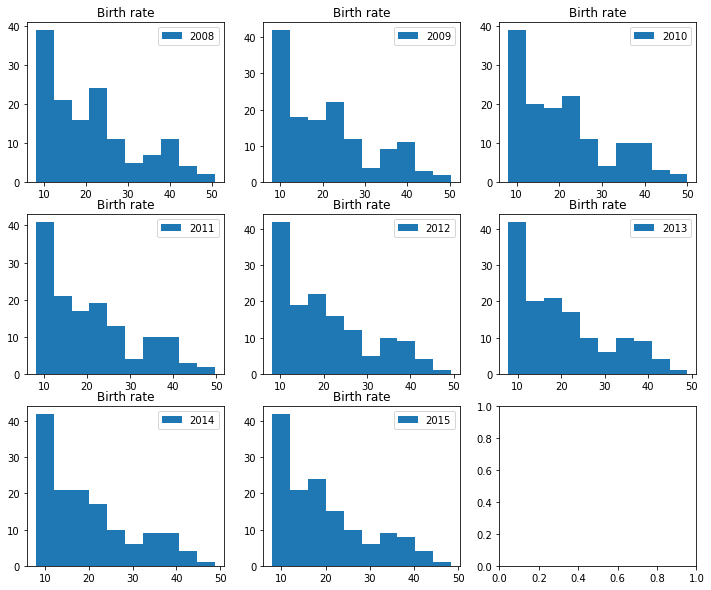

In [261]:
feature = 'Birth rate, crude (per 1,000 people)'
title = 'Birth rate'

BR = histogram_demography(years, feature, year, title)

### Histogram of Death rate over the years

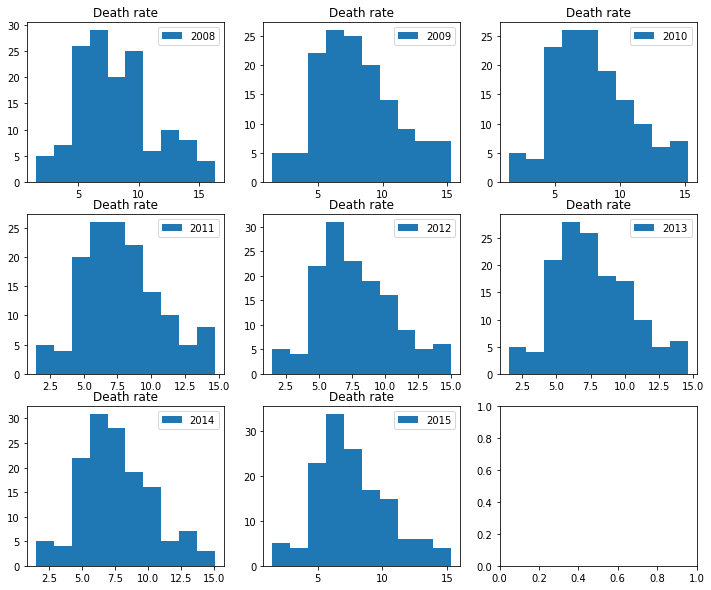

In [262]:
feature = 'Death rate, crude (per 1,000 people)'
title = 'Death rate'

BR = histogram_demography(years, feature, year, title)

### Hiostogram of Life expectancy at birth over the years

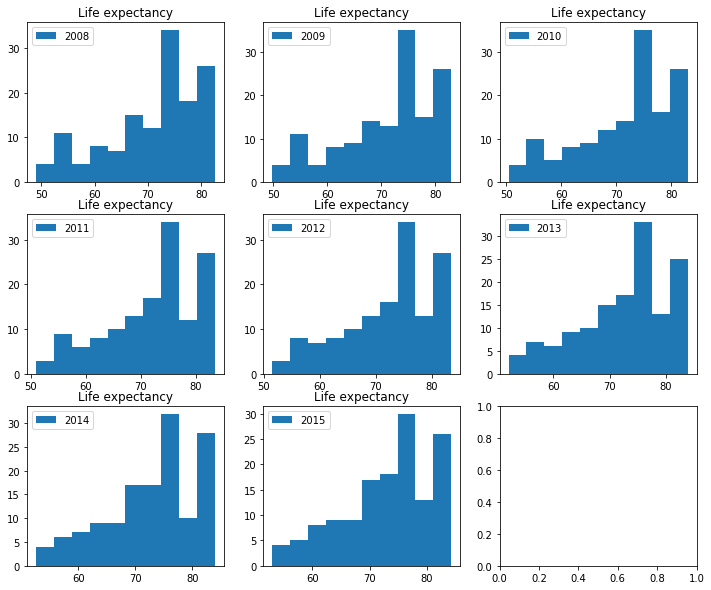

In [263]:
feature = 'Life expectancy at birth, total (years)'
title = 'Life expectancy'

BR = histogram_demography(years, feature, year, title)

### Histogram of Sex ratio at birth over the years

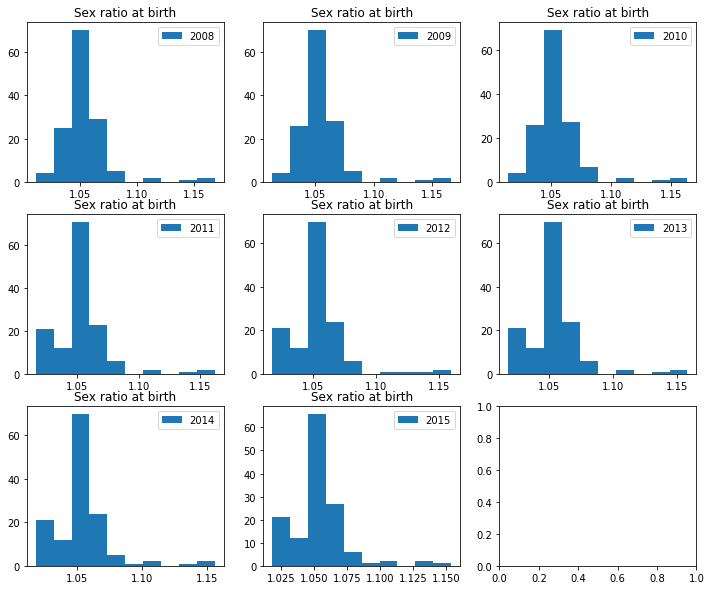

In [264]:
feature = 'Sex ratio at birth (male births per female births)'
title = 'Sex ratio at birth'

BR = histogram_demography(years, feature, year, title)

### Histogram of population growth over the years

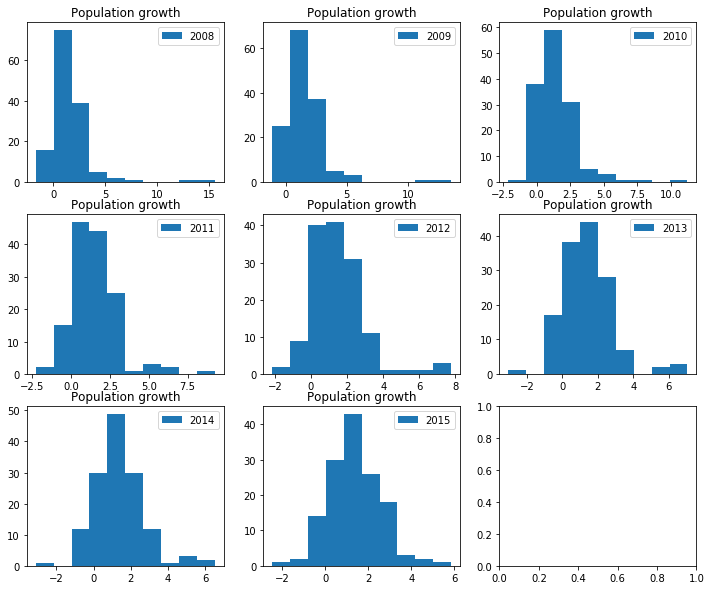

In [265]:
feature = 'Population growth (annual %)'
title = 'Population growth'

BR = histogram_demography(years, feature, year, title)

### Histogram of total population over the years

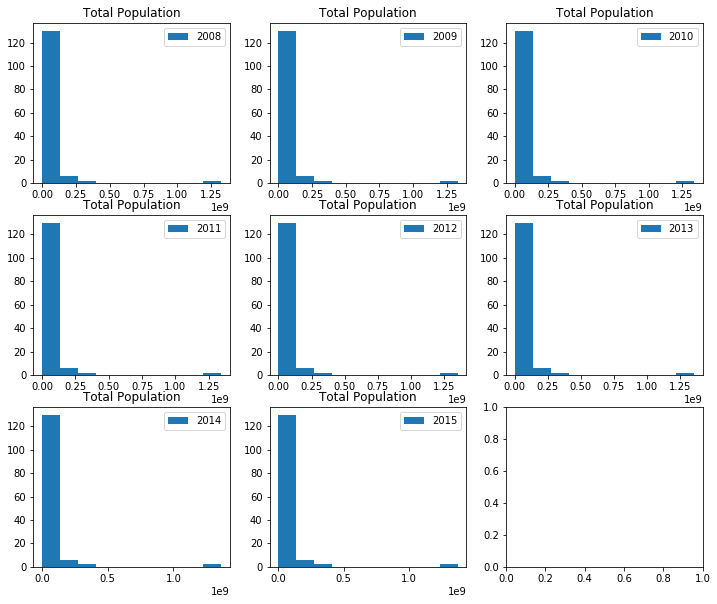

In [266]:
feature = 'Population, total'
title = 'Total Population'

BR = histogram_demography(years, feature, year, title)

###  Histogram of Mortality rate, infant over the years

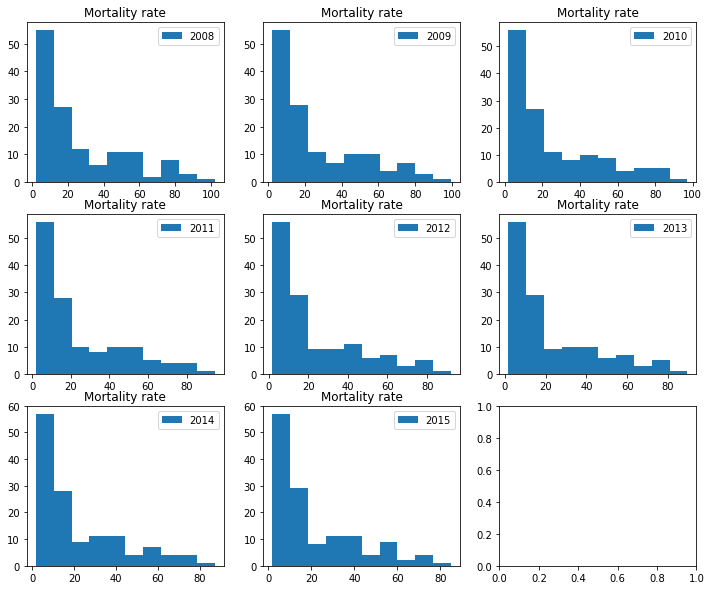

In [267]:
feature = 'Mortality rate, infant (per 1,000 live births)'
title = 'Mortality rate'

BR = histogram_demography(years, feature, year, title)

### Bar plot of Countries w.r.t birth rate and Death rate

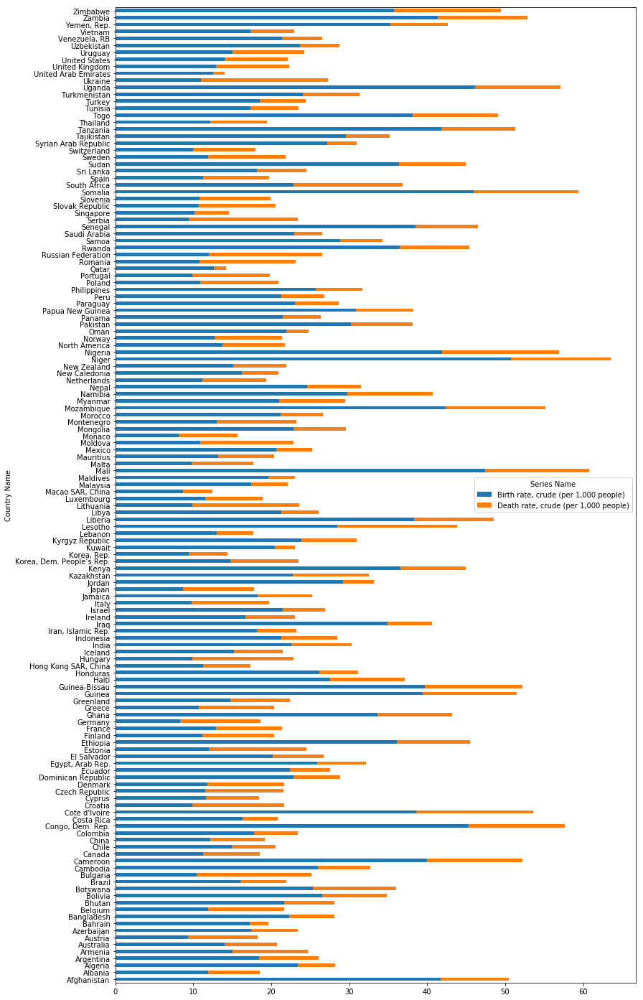

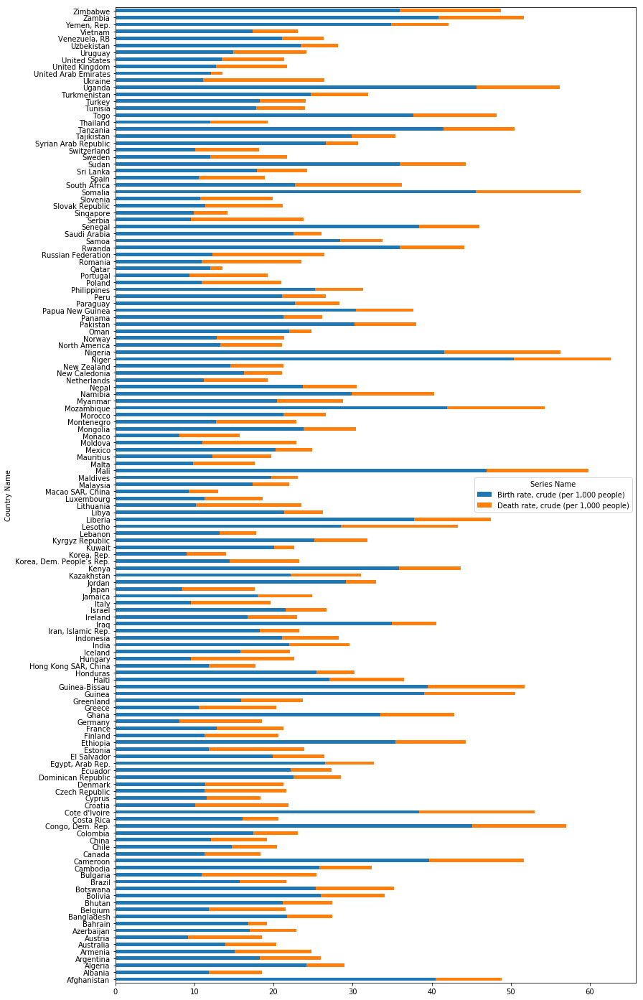

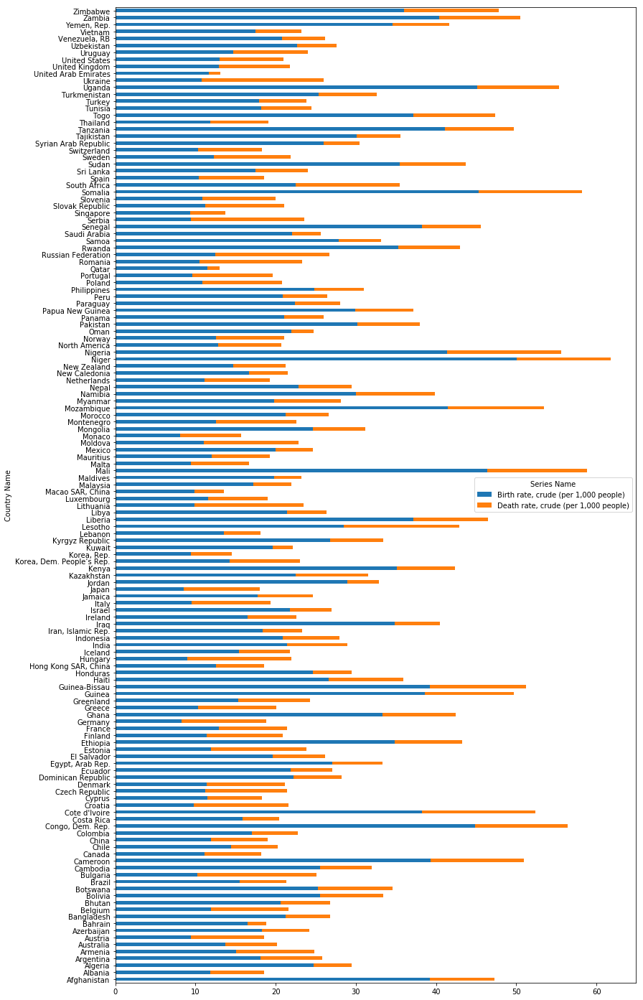

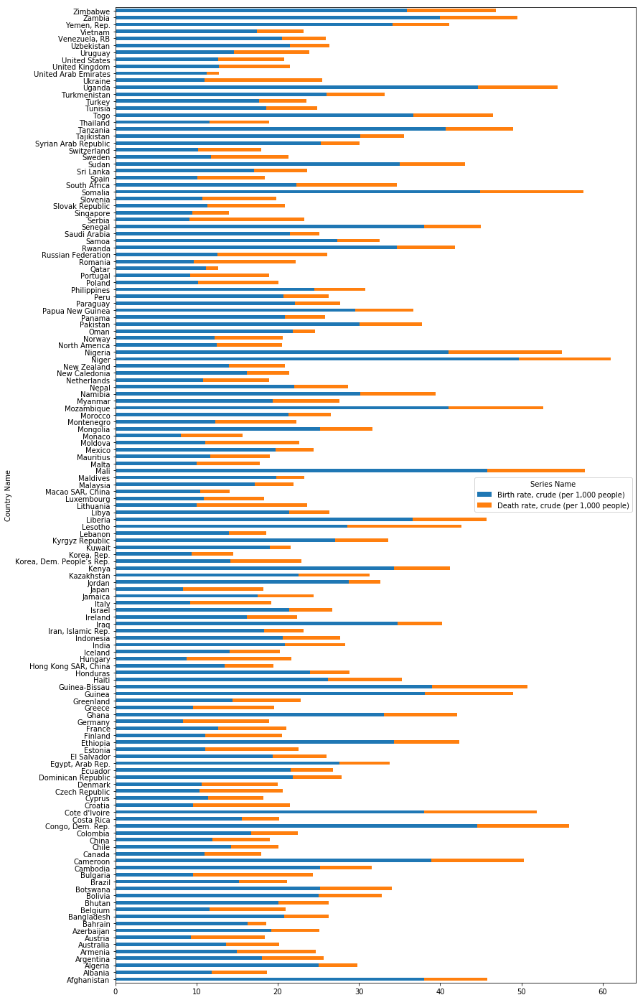

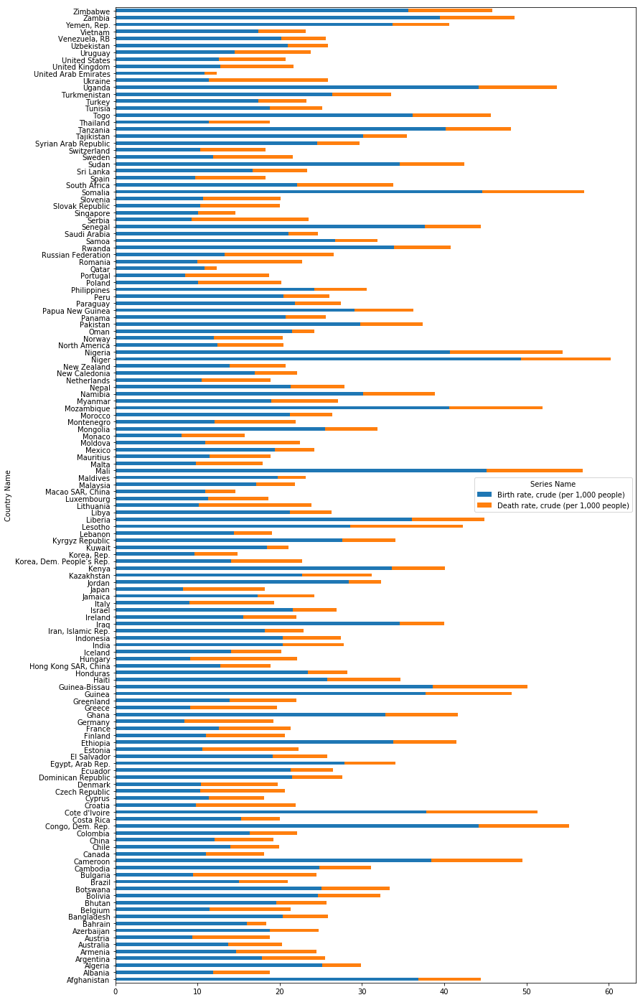

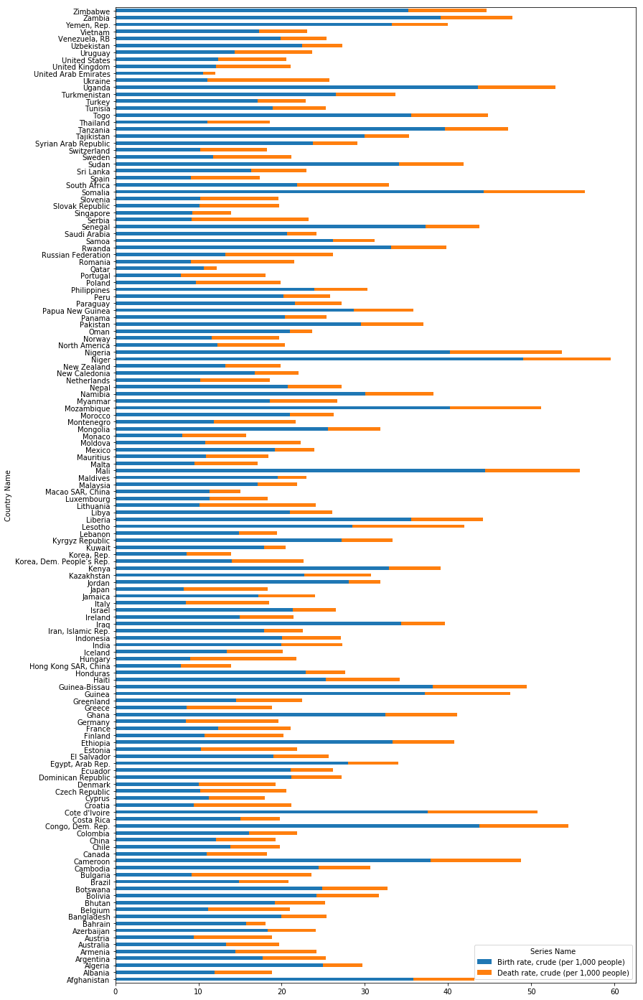

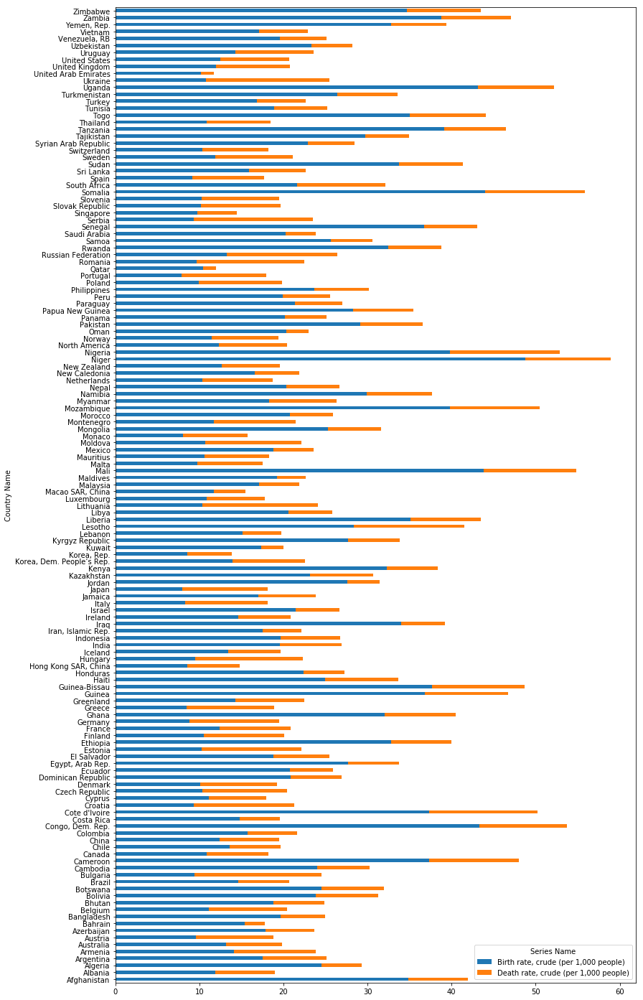

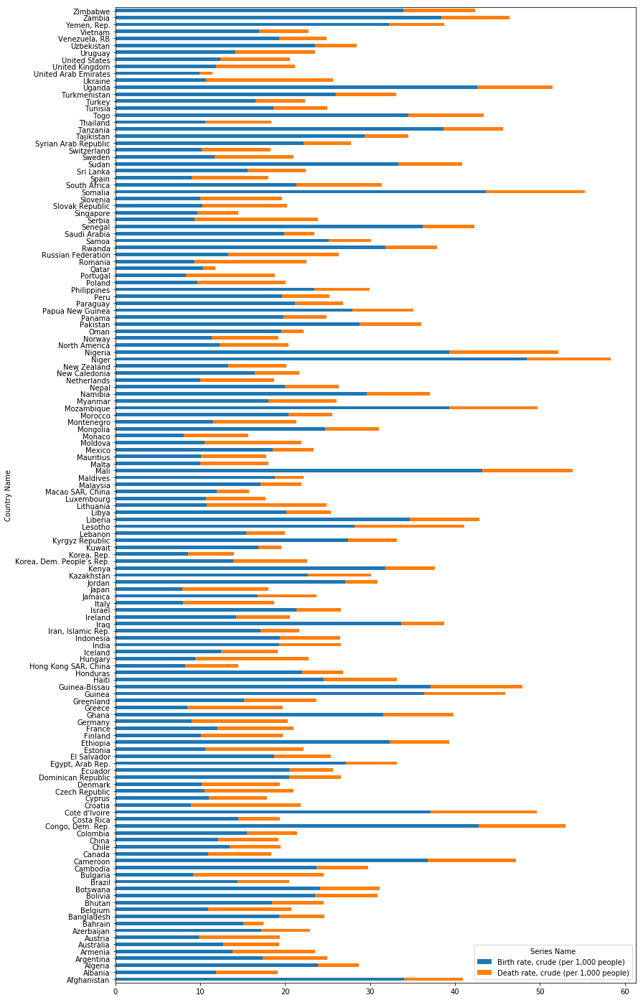

In [268]:
cleaned_data_2008[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['Birth rate, crude (per 1,000 people)', 'Death rate, crude (per 1,000 people)']].plot.barh(stacked = True, figsize = (13, 25))

### Bar plot of Countries w.r.t Life expectancy at birth

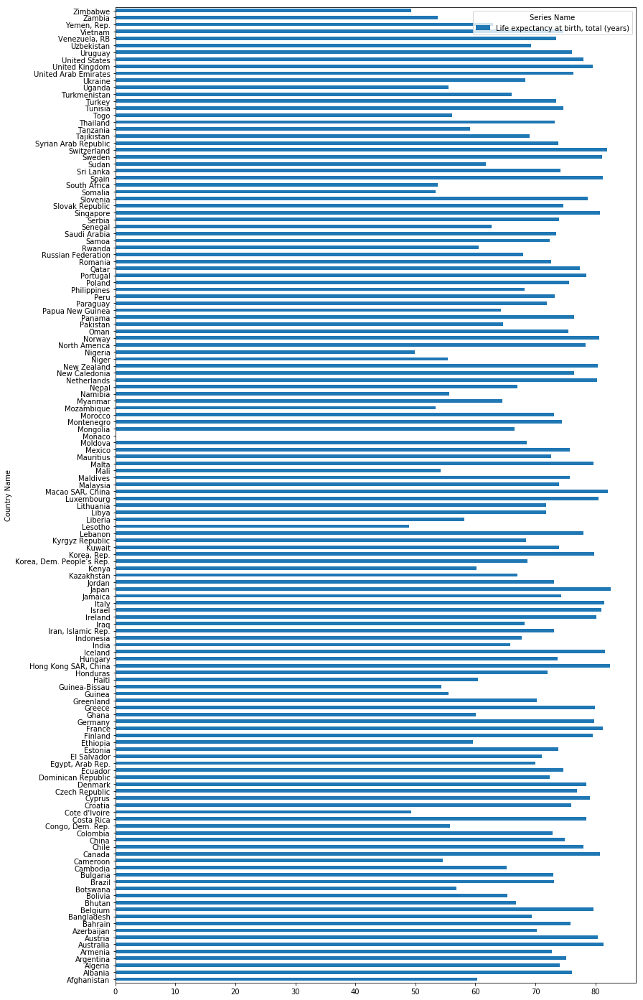

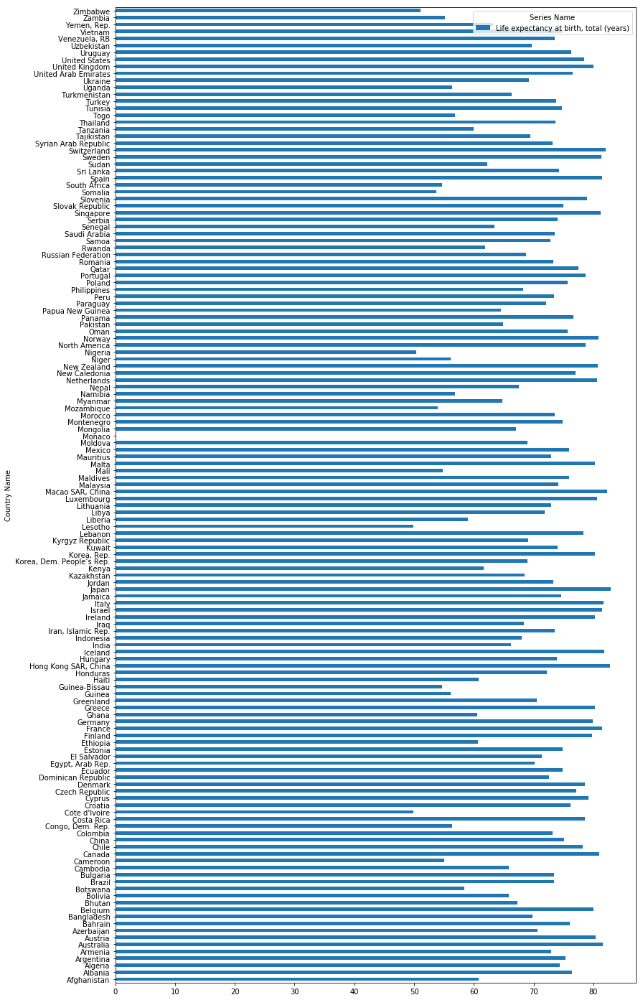

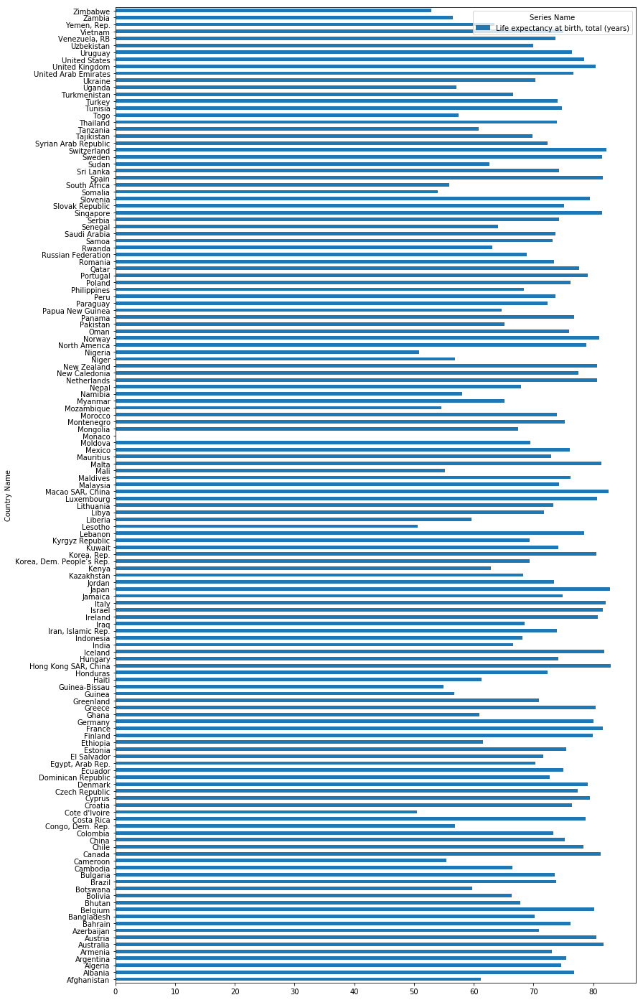

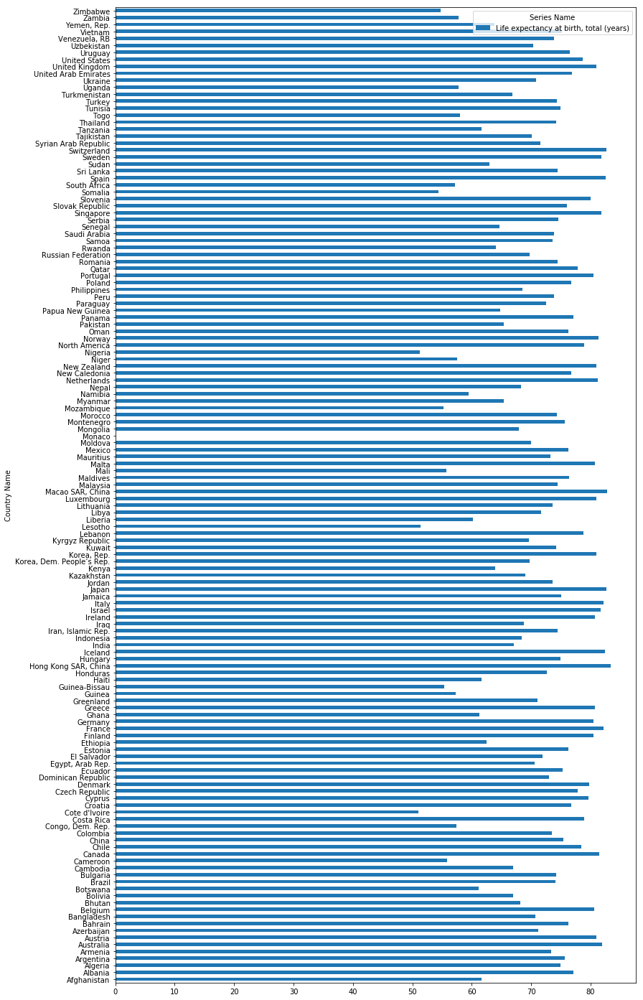

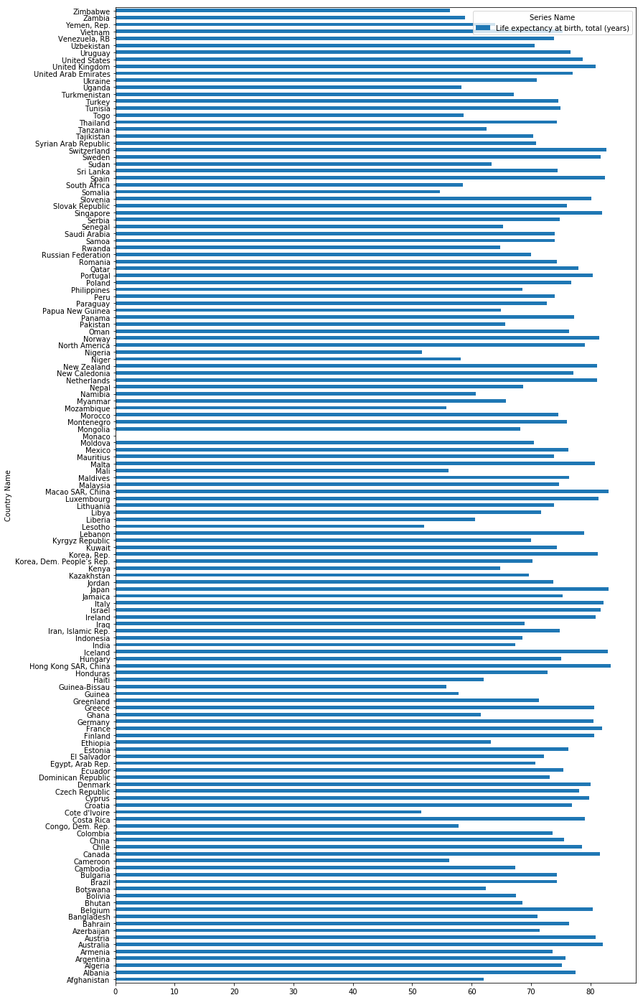

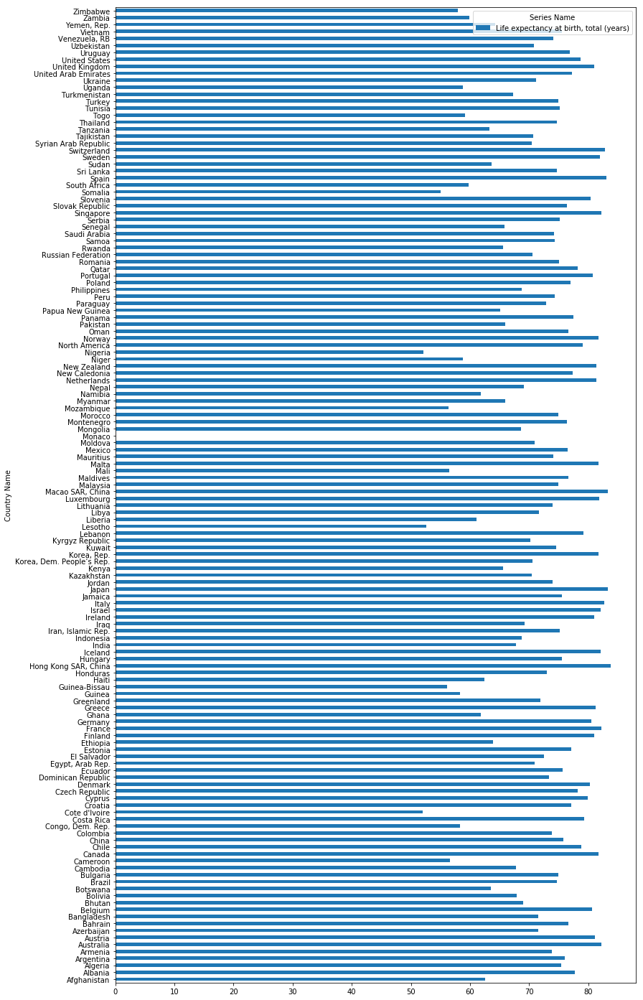

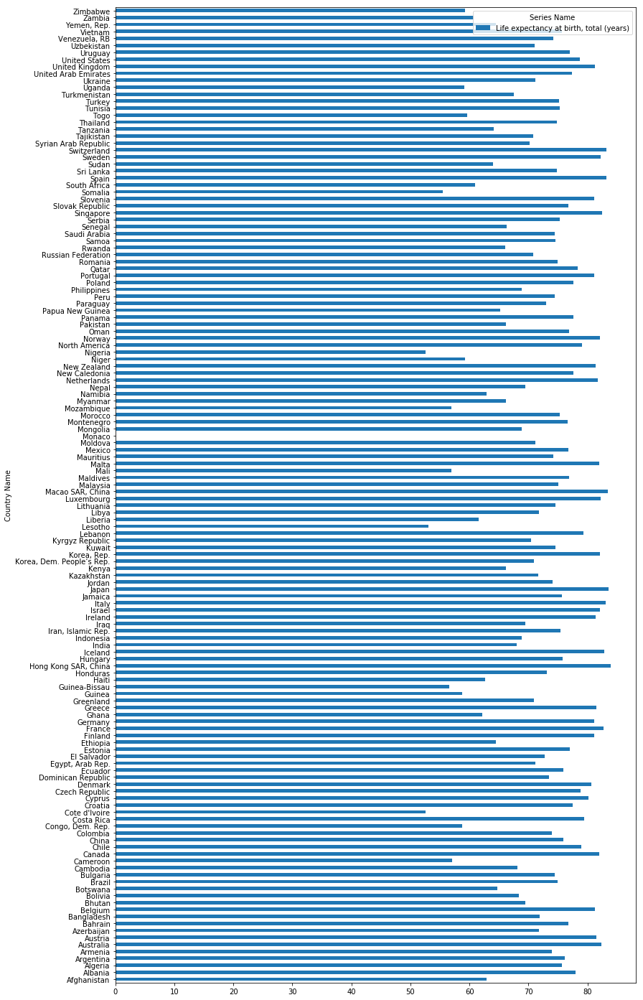

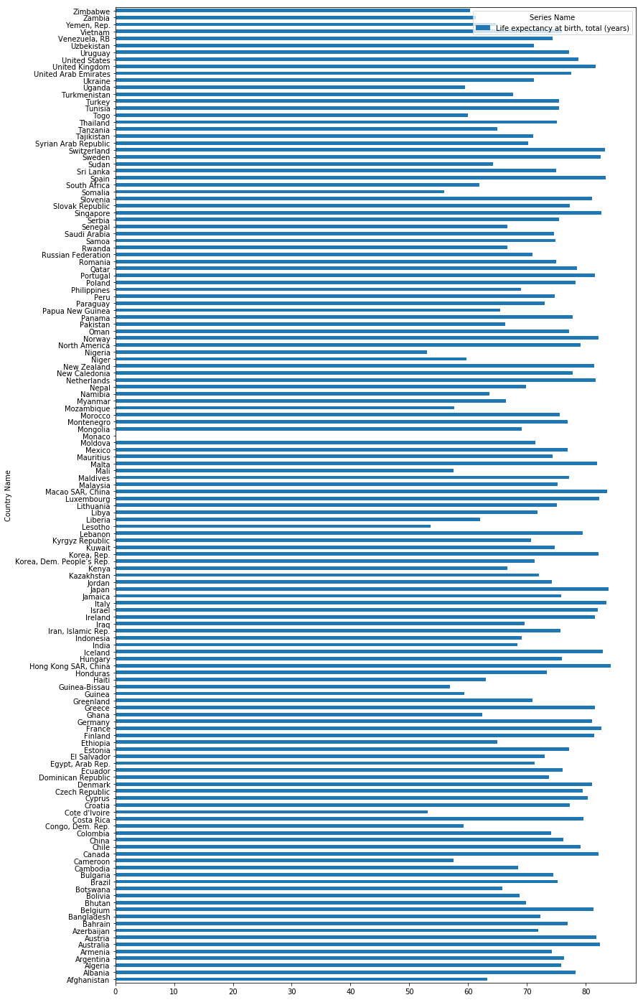

In [269]:
cleaned_data_2008[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2009[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2010[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2011[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2012[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2013[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2014[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))
cleaned_data_2015[['Life expectancy at birth, total (years)']].plot.barh(figsize = (13, 25))

### Bar plot of Countries w.r.t Mortality rate, infant

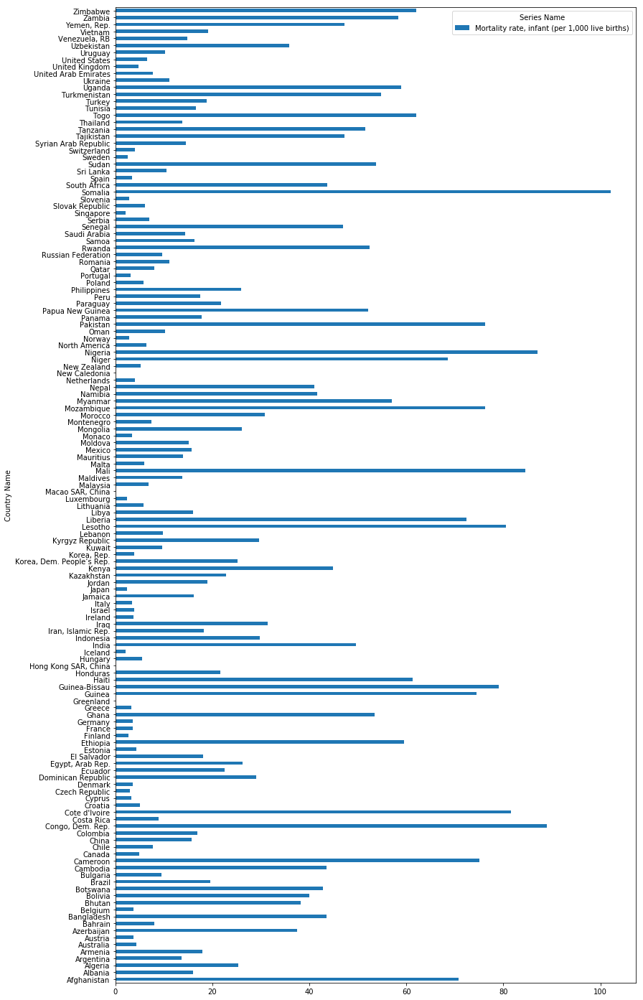

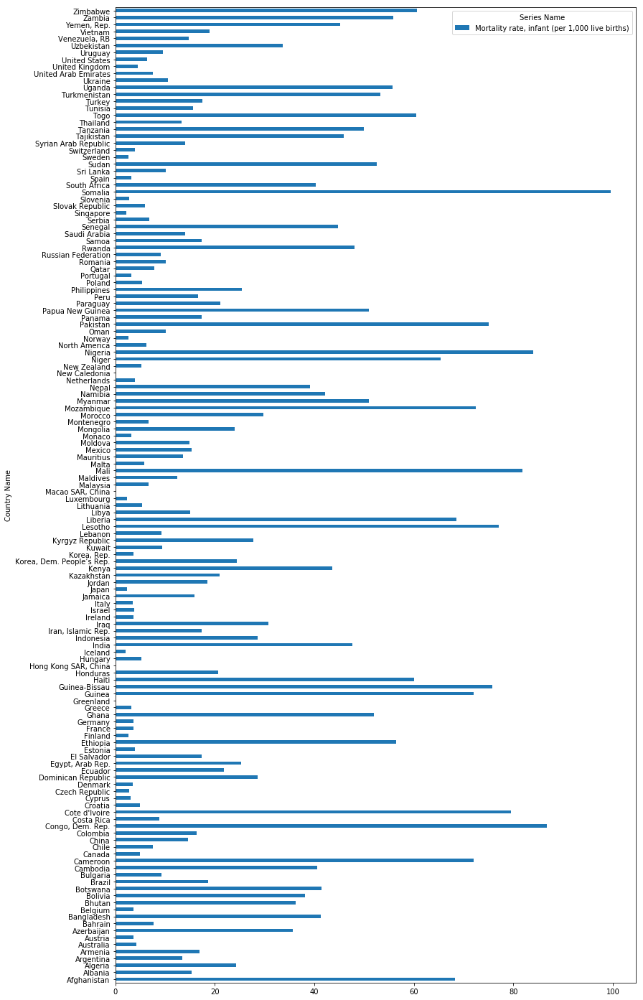

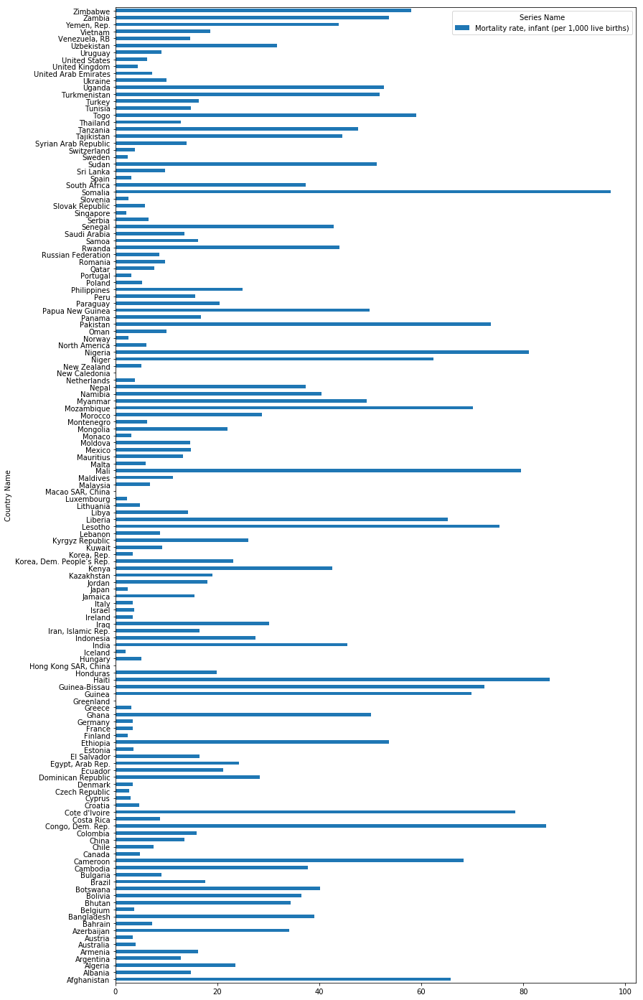

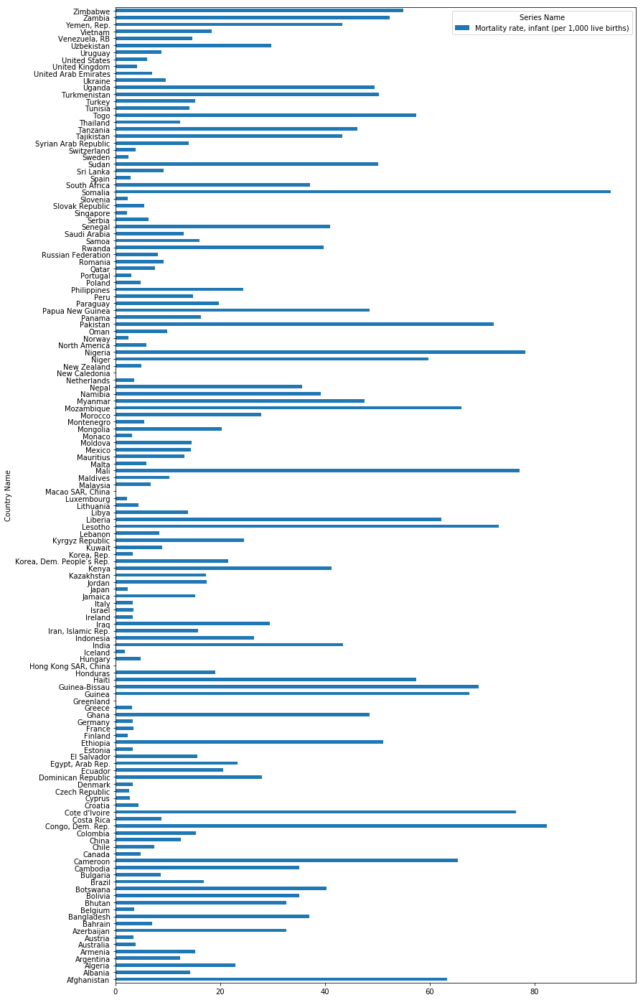

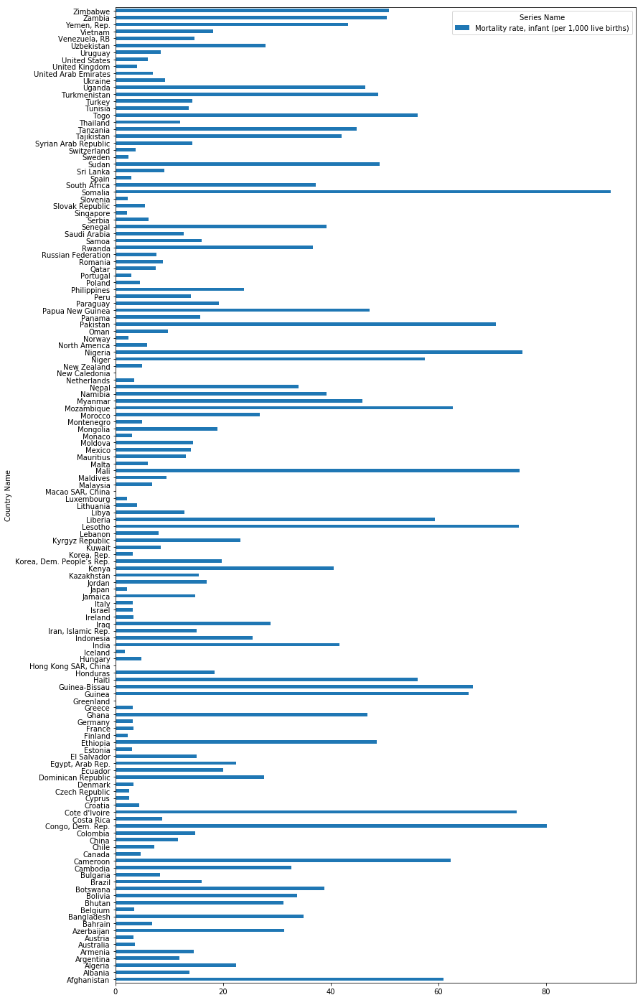

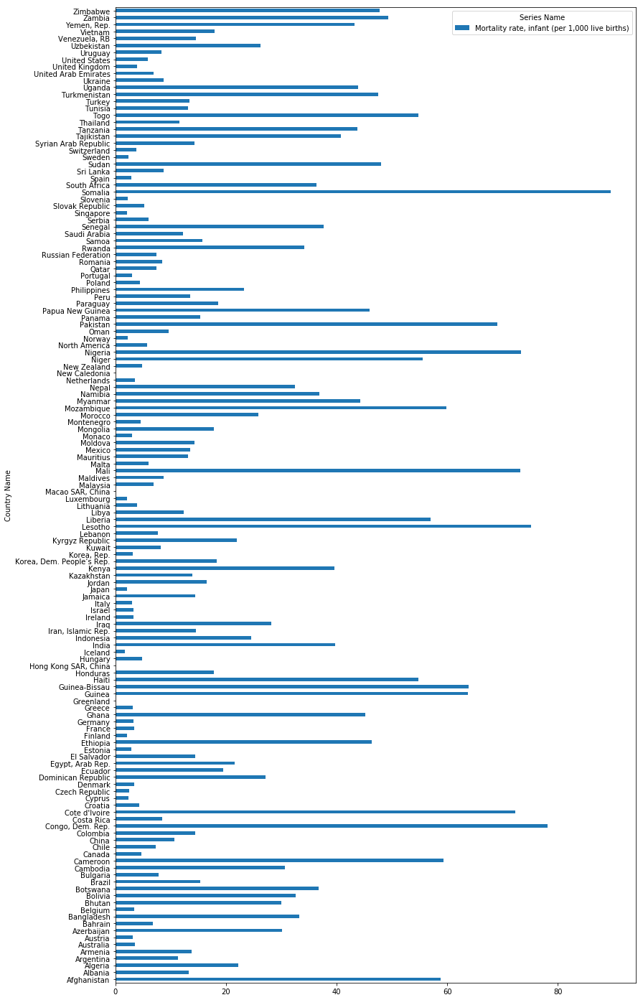

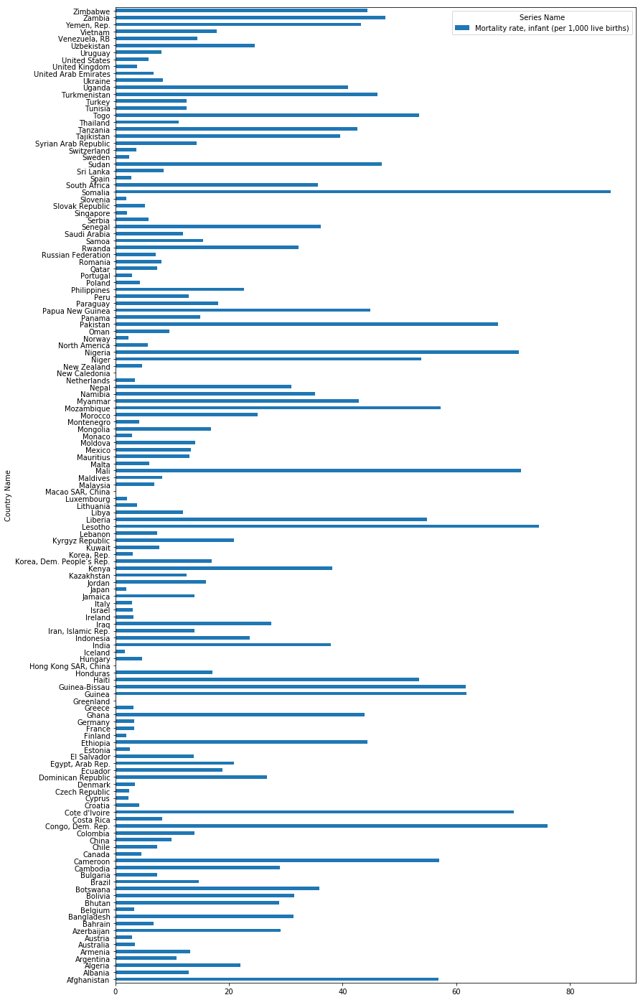

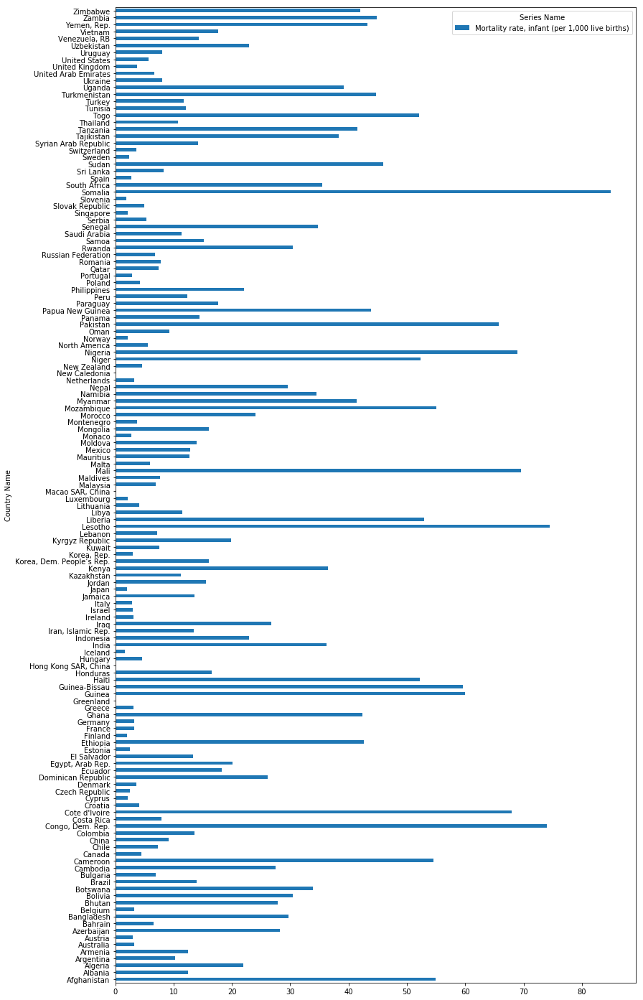

In [270]:
cleaned_data_2008[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2009[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2010[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2011[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2012[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2013[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2014[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))
cleaned_data_2015[['Mortality rate, infant (per 1,000 live births)']].plot.barh(figsize = (13, 25))


### Bar plot of Countries w.r.t Sex ratio at birth

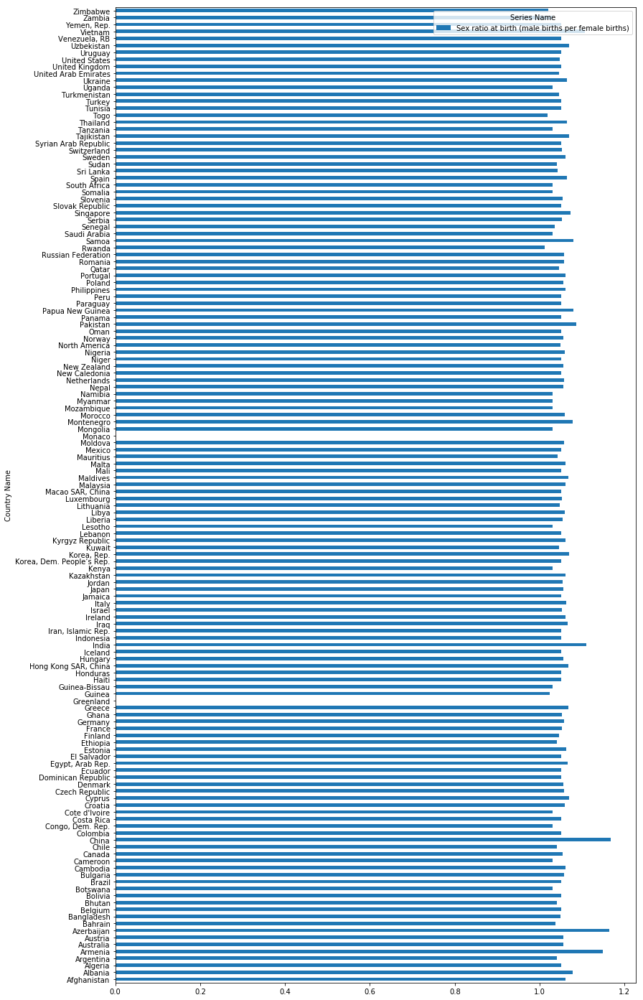

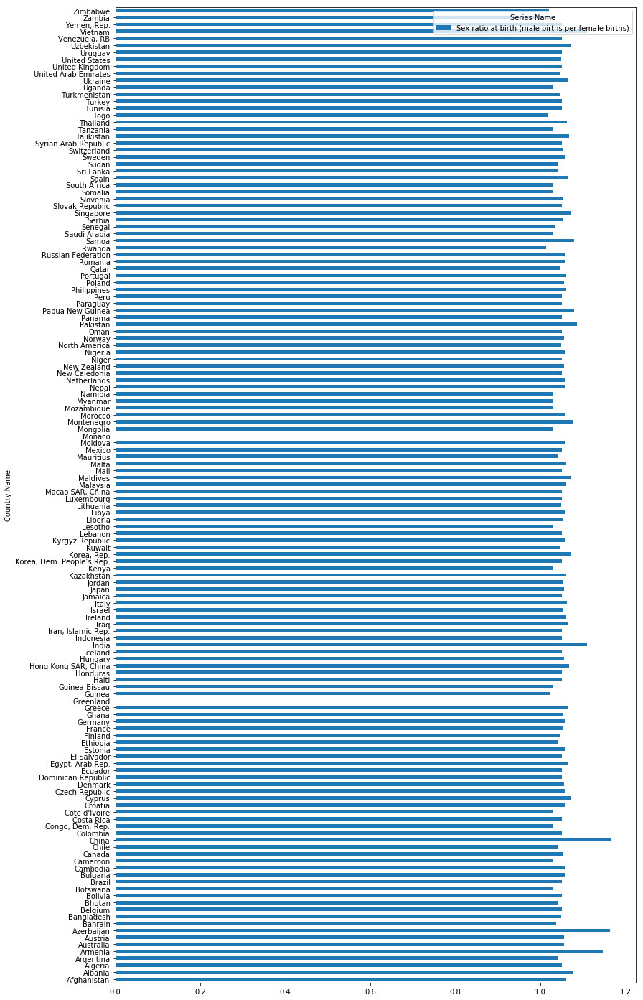

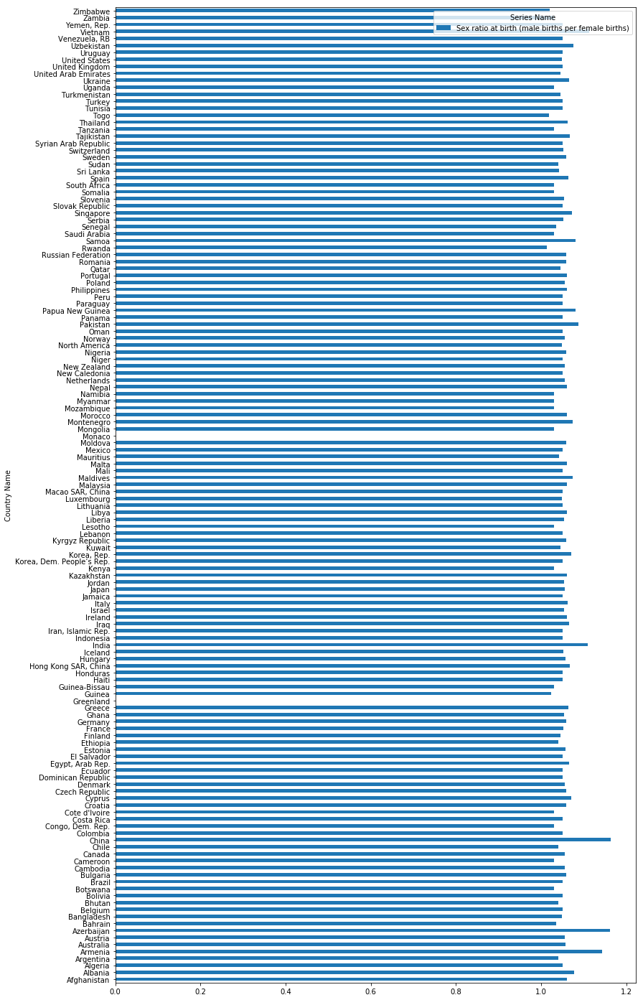

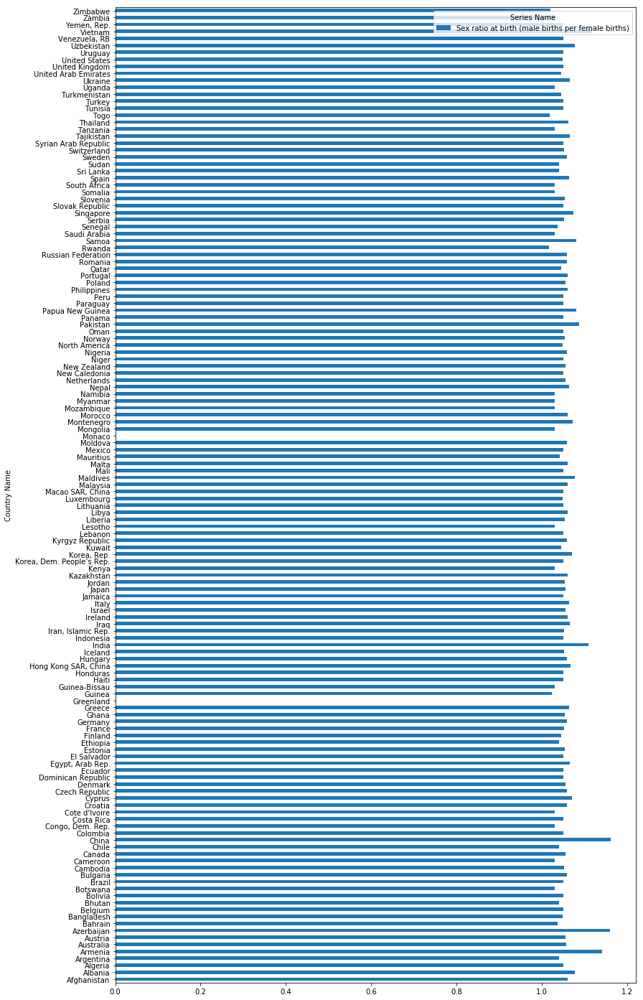

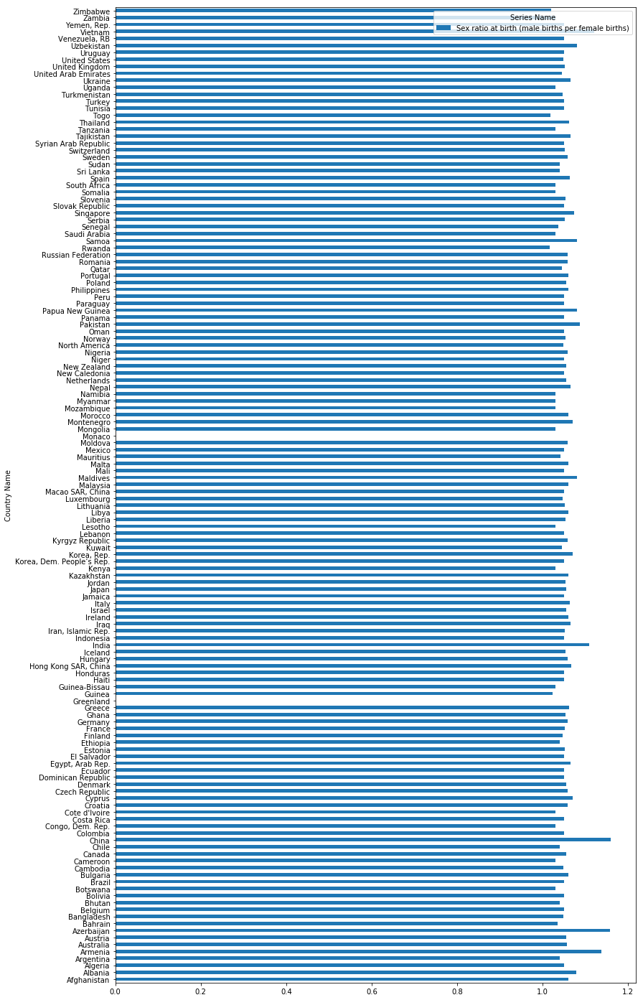

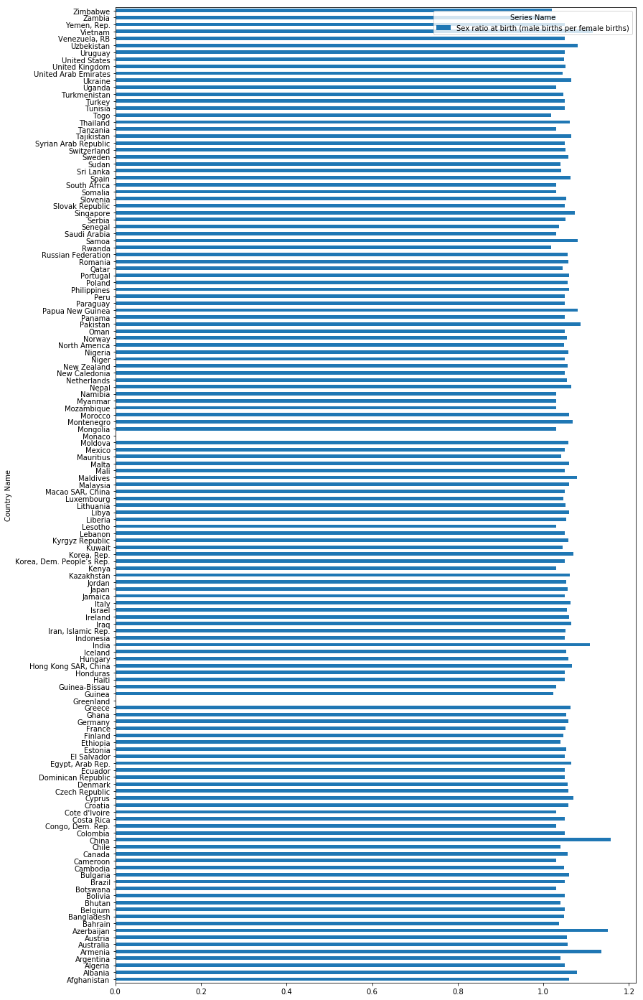

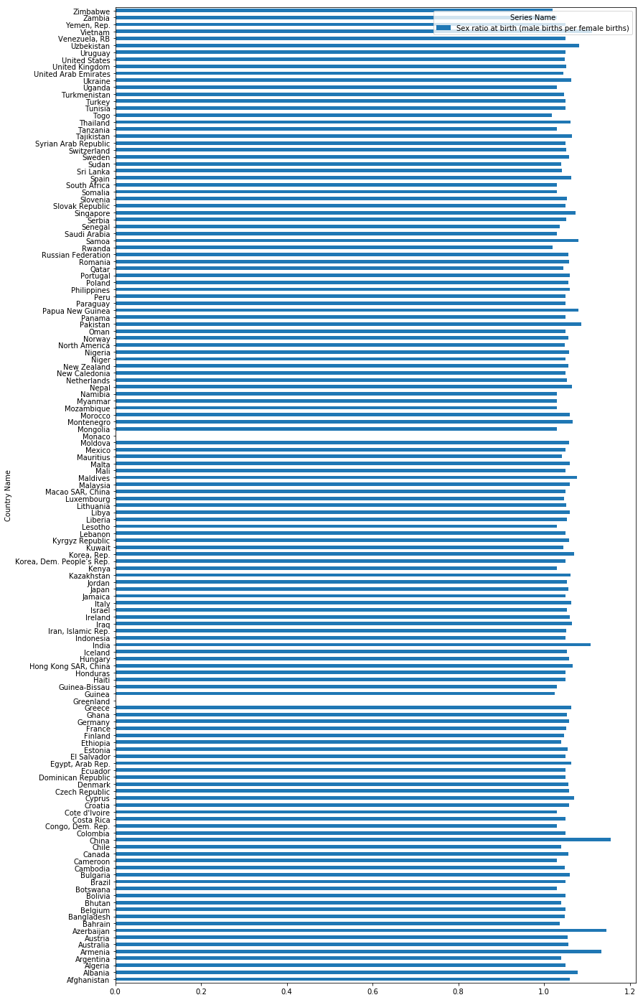

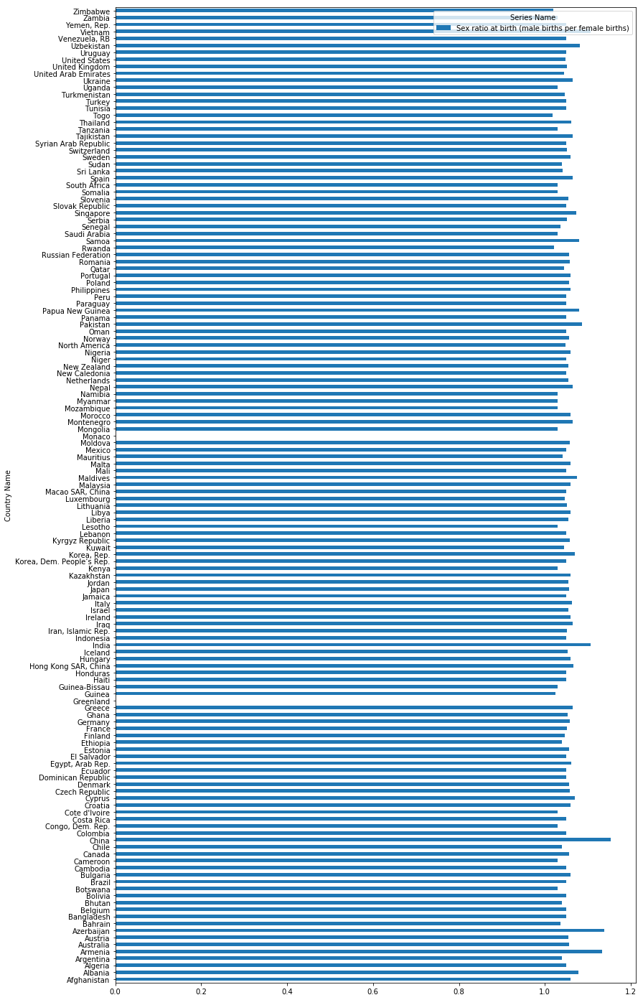

In [271]:
cleaned_data_2008[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2009[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2010[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2011[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2012[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2013[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2014[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))
cleaned_data_2015[['Sex ratio at birth (male births per female births)']].plot.barh(figsize = (13, 25))

### bar plot of Countries w.r.t population growth

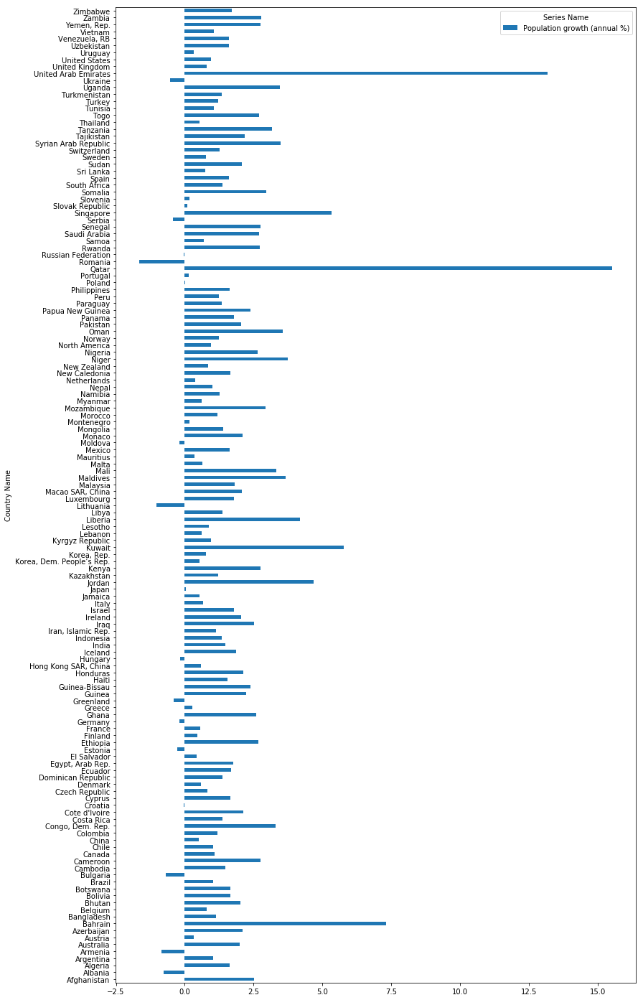

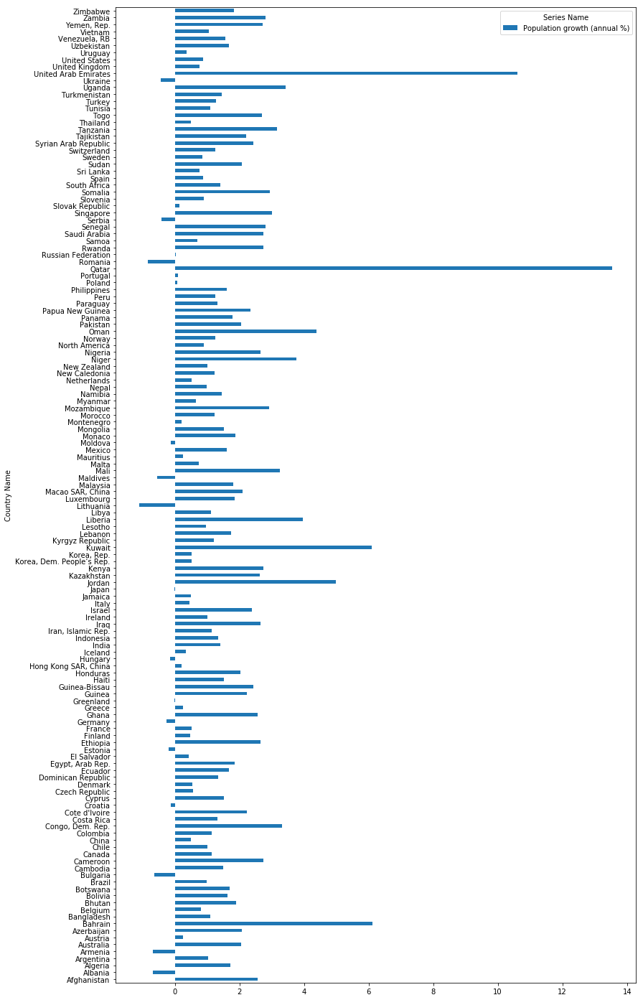

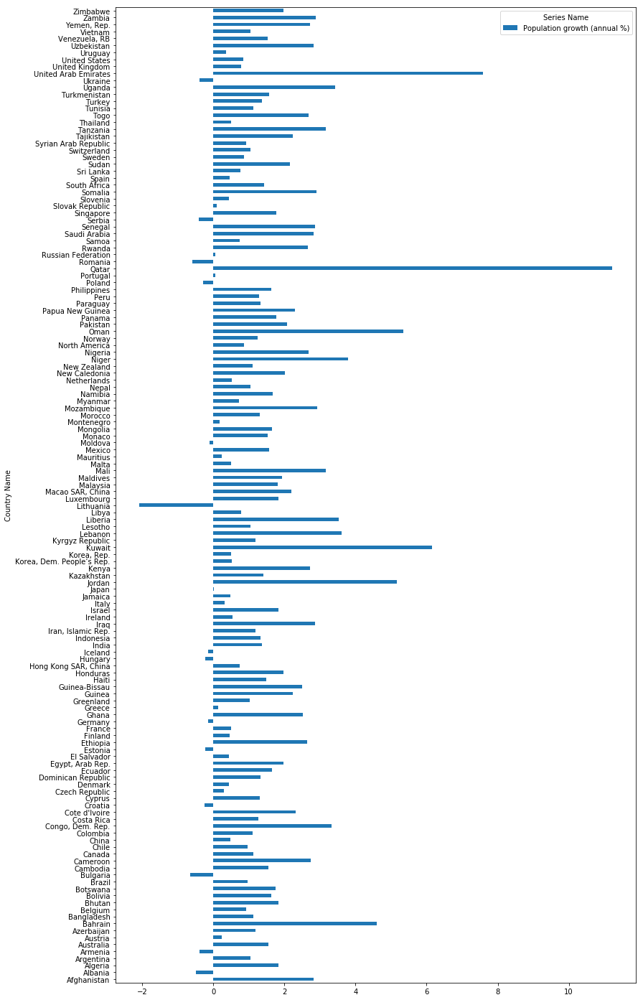

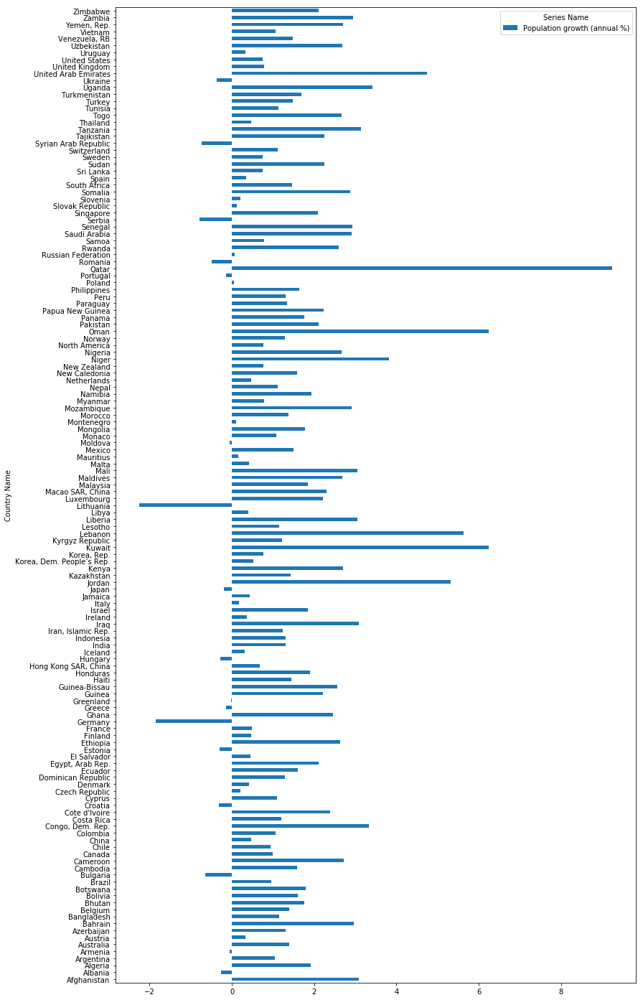

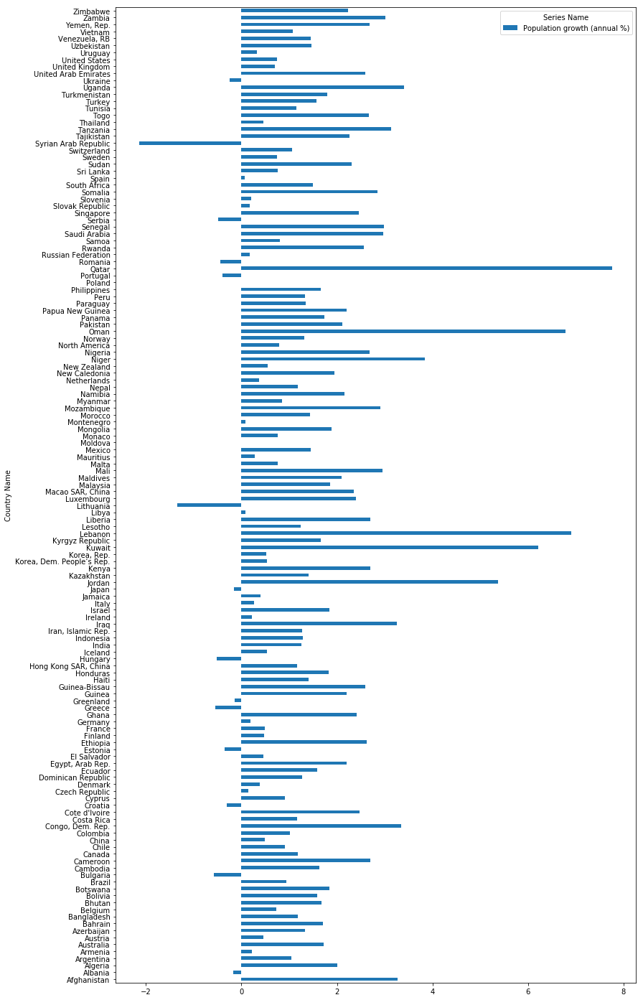

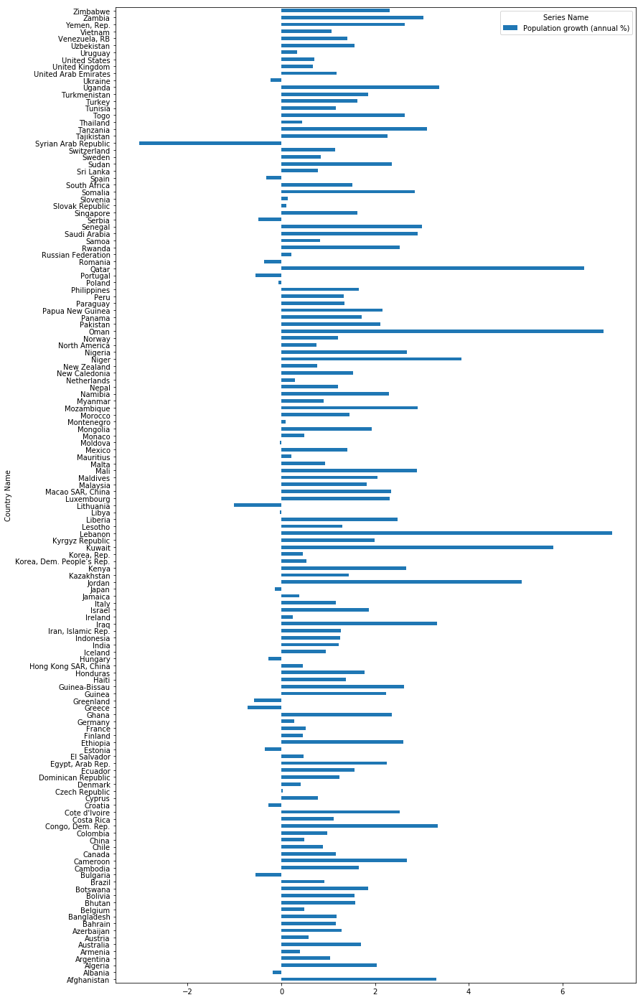

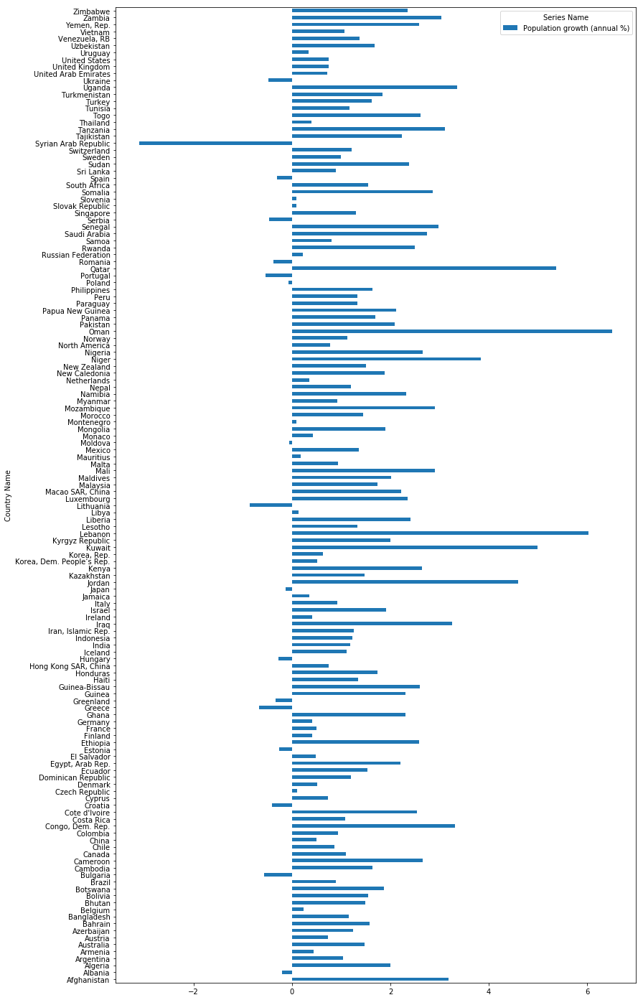

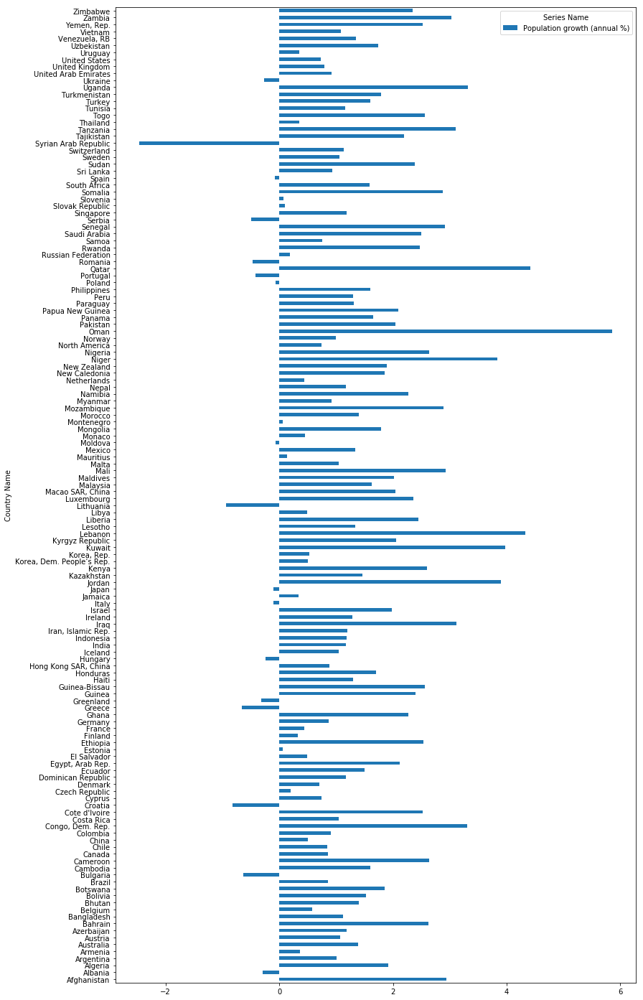

In [272]:
cleaned_data_2008[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2009[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2010[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2011[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2012[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2013[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2014[['Population growth (annual %)']].plot.barh(figsize = (13, 25))
cleaned_data_2015[['Population growth (annual %)']].plot.barh(figsize = (13, 25))

### Bar plot of Countries w.r.t Total population

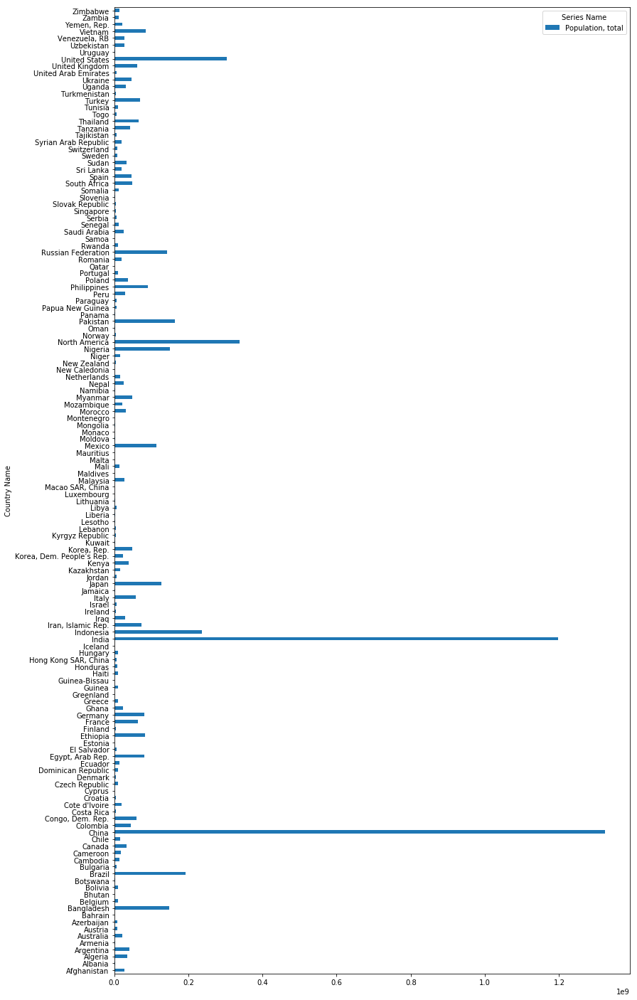

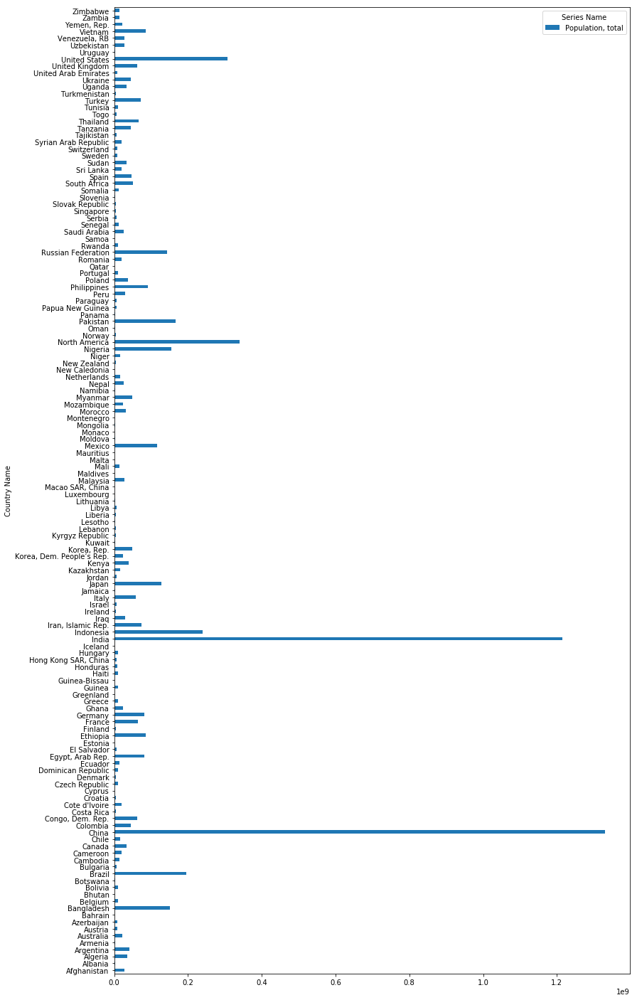

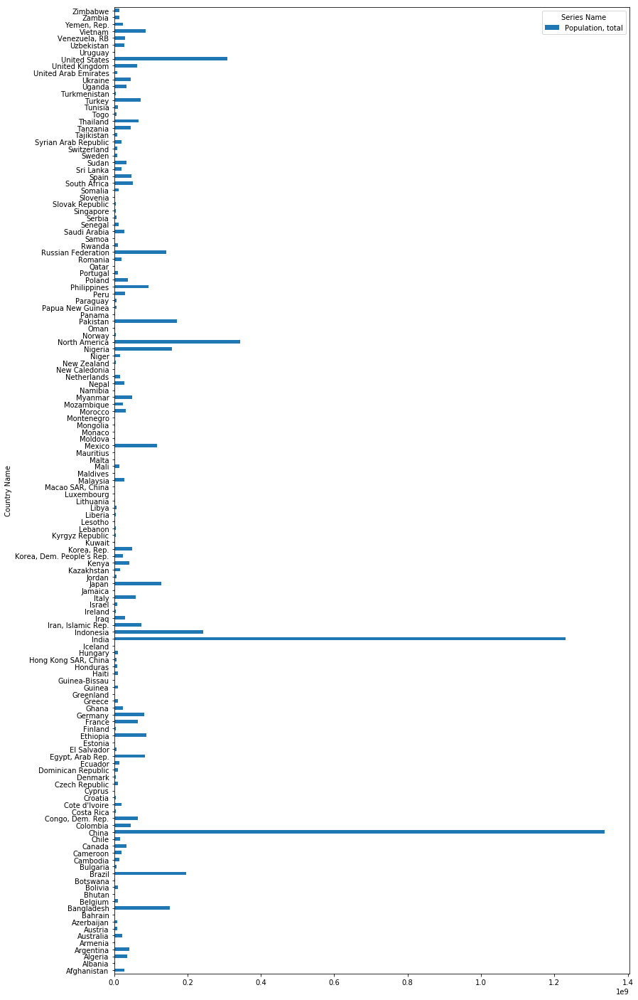

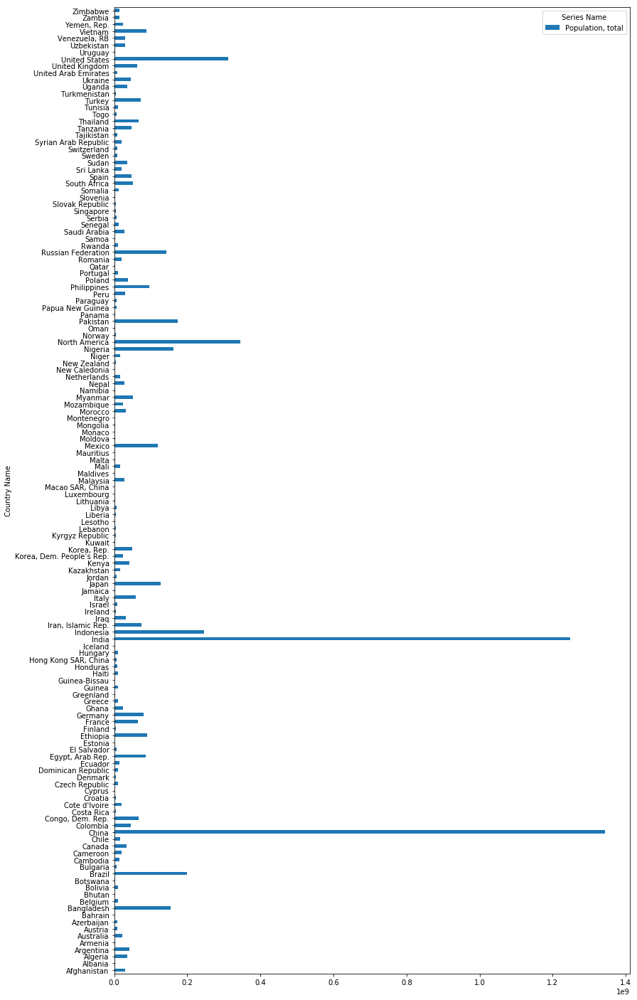

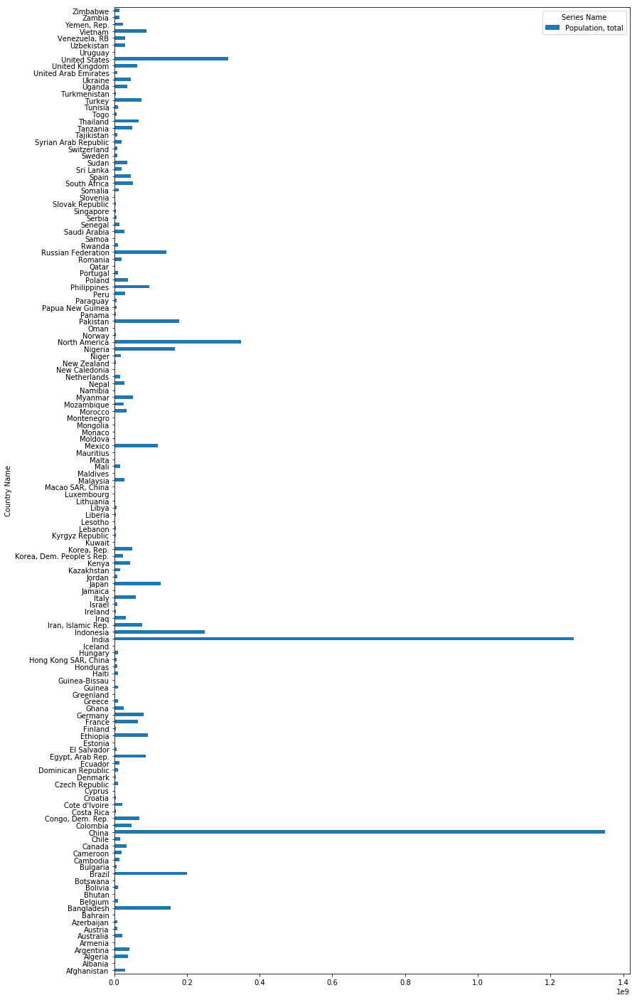

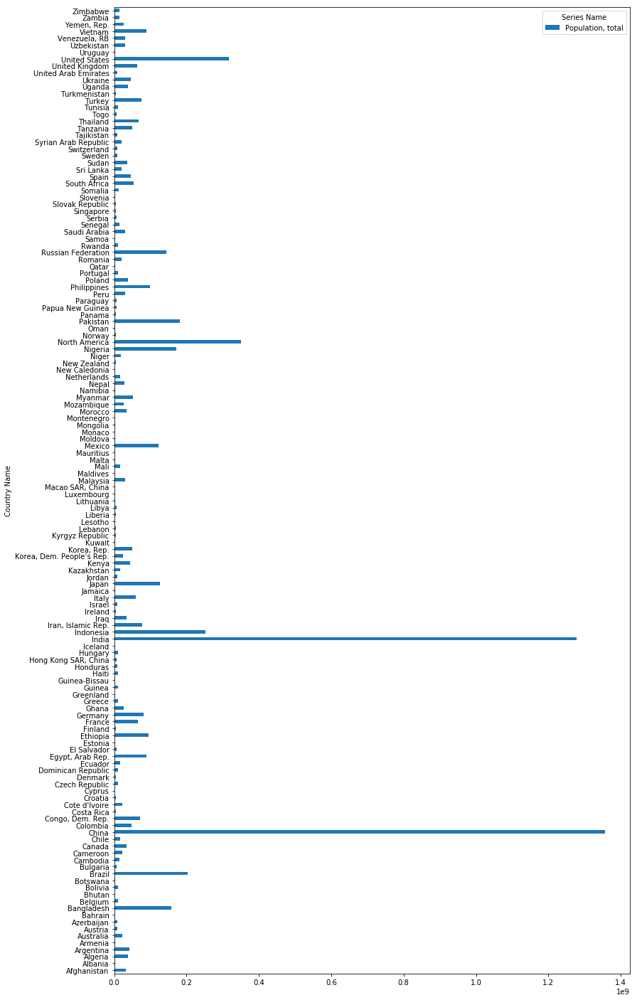

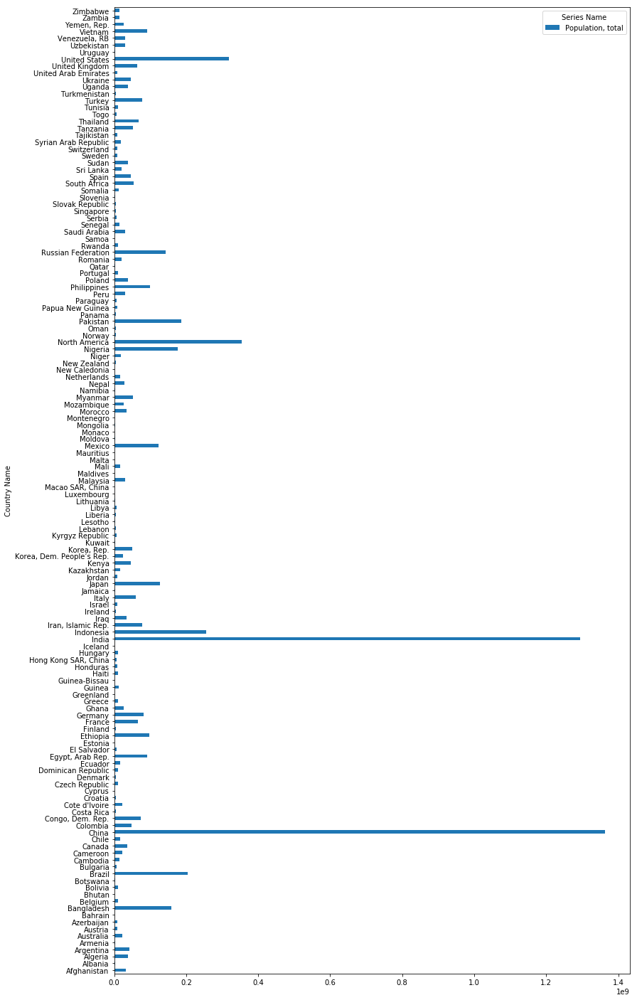

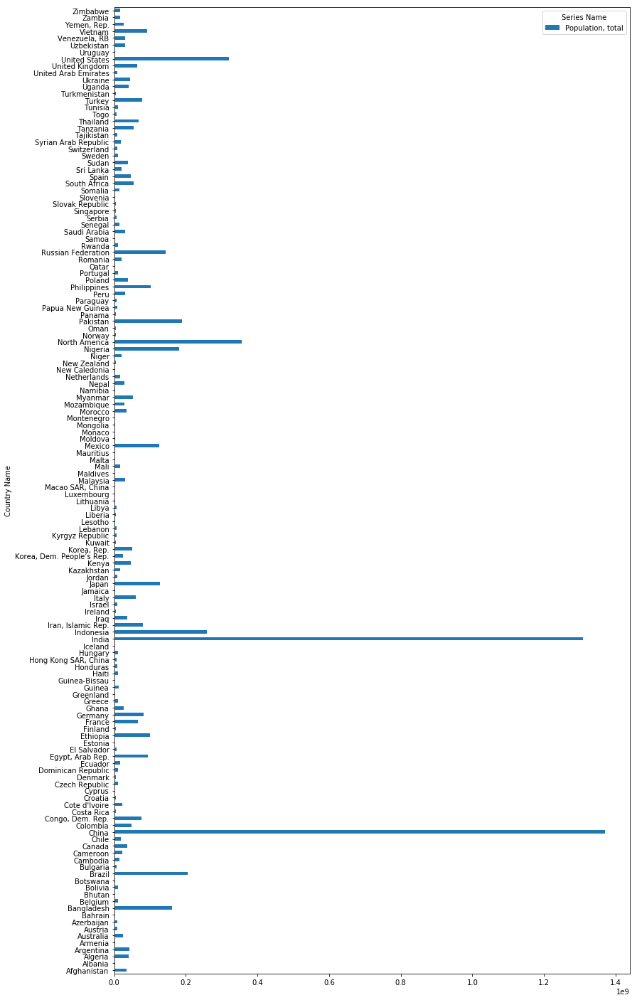

In [273]:
cleaned_data_2008[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2009[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2010[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2011[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2012[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2013[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2014[['Population, total']].plot.barh(figsize = (13, 25))
cleaned_data_2015[['Population, total']].plot.barh(figsize = (13, 25))

### Asian Countries w.r.t population growth over the years

In [381]:
def plot_features(countries_name, feature, labels, ylabel):
    
    plt.figure(figsize=(10,6))
    
    
    
    if len(countries_name) >= 3:
        plt.plot(countries_name[0]['Year'], countries_name[0][feature], '-o', label = labels[0])
        plt.plot(countries_name[1]['Year'], countries_name[1][feature], '-o', label = labels[1])
        plt.plot(countries_name[2]['Year'], countries_name[2][feature], '-o', label = labels[2])
        
        if len(countries_name) >= 5:
            plt.plot(countries_name[3]['Year'], countries_name[3][feature], '-o', label = labels[3])
            plt.plot(countries_name[4]['Year'], countries_name[4][feature], '-o', label = labels[4])
            
            if len(countries_name) >= 6:
                plt.plot(countries_name[5]['Year'], countries_name[5][feature], '-o', label = labels[5])
                
                if len(countries_name) >6:
                    plt.plot(countries_name[6]['Year'], countries_name[6][feature], '-o', label = labels[6])
                    plt.plot(countries_name[7]['Year'], countries_name[7][feature], '-o', label = labels[7])
                    plt.plot(countries_name[8]['Year'], countries_name[8][feature], '-o', label = labels[8])
                    plt.plot(countries_name[9]['Year'], countries_name[9][feature], '-o', label = labels[9])
                    plt.plot(countries_name[10]['Year'], countries_name[10][feature], '-o', label = labels[10])
                    plt.plot(countries_name[11]['Year'], countries_name[11][feature], '-o', label = labels[11])
    
    plt.title(feature)
    plt.xlabel('Year')
    plt.ylabel(ylabel)
    
    plt.legend()
    

In [382]:
india = demography.loc[['India'], ['Population growth (annual %)']]; india['Year'] = year
china = demography.loc[['China'], ['Population growth (annual %)']]; china['Year'] = year
japan = demography.loc[['Japan'], ['Population growth (annual %)']]; japan['Year'] = year
bangladesh = demography.loc[['Bangladesh'], ['Population growth (annual %)']]; bangladesh['Year'] = year
afghanistan = demography.loc[['Afghanistan'], ['Population growth (annual %)']]; afghanistan['Year'] = year

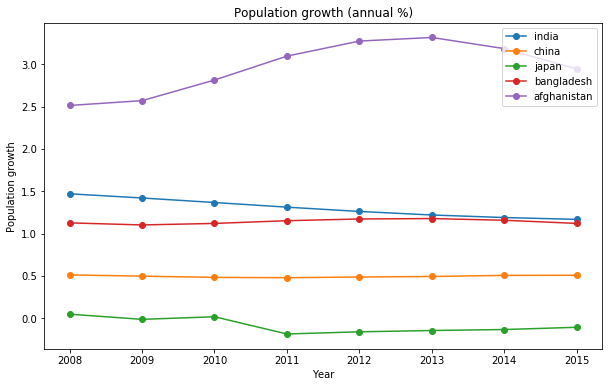

In [383]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### China's population is growth is constant neither increasing nor decreasing
#### India's population growth is decreasing slowly
#### Afghanistan's growth is increasing fast

### Asian countries w.r.t Total population

In [384]:
india = demography.loc[['India'], ['Population, total']]; india['Year'] = year
china = demography.loc[['China'], ['Population, total']]; china['Year'] = year
japan = demography.loc[['Japan'], ['Population, total']]; japan['Year'] = year
bangladesh = demography.loc[['Bangladesh'], ['Population, total']]; bangladesh['Year'] = year
afghanistan = demography.loc[['Afghanistan'], ['Population, total']]; afghanistan['Year'] = year

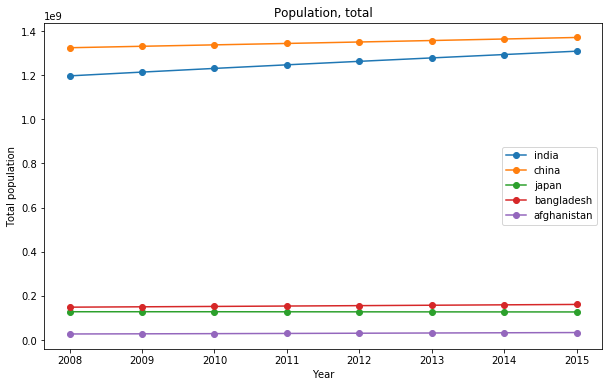

In [385]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Population, total'
ylabel = 'Total population'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### We know China and India has the highest population

### Asian Countries w.r.t sex ratio at birth

In [386]:
india = demography.loc[['India'], ['Sex ratio at birth (male births per female births)']]; india['Year'] = year
china = demography.loc[['China'], ['Sex ratio at birth (male births per female births)']]; china['Year'] = year
japan = demography.loc[['Japan'], ['Sex ratio at birth (male births per female births)']]; japan['Year'] = year
bangladesh = demography.loc[['Bangladesh'], ['Sex ratio at birth (male births per female births)']]; bangladesh['Year'] = year
afghanistan = demography.loc[['Afghanistan'], ['Sex ratio at birth (male births per female births)']]; afghanistan['Year'] = year

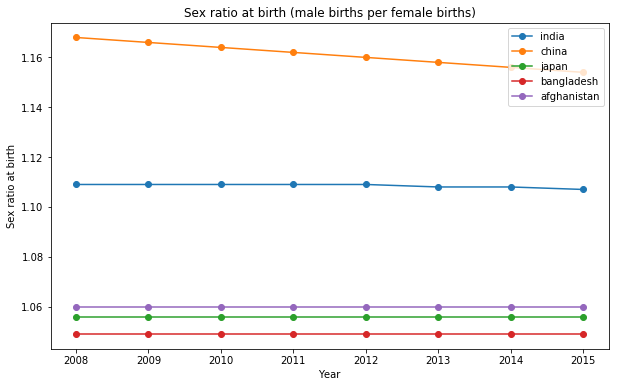

In [387]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Sex ratio at birth (male births per female births)'
ylabel = 'Sex ratio at birth'

asian = plot_features(asian_countries, feature, label, ylabel)

### African countries w..r.t population growth

In [388]:
south_africa = demography.loc[['South Africa'], ['Population growth (annual %)']]; south_africa['Year'] = year
zimbabwe = demography.loc[['Zimbabwe'], ['Population growth (annual %)']]; zimbabwe['Year'] = year
kenya = demography.loc[['Kenya'], ['Population growth (annual %)']]; kenya['Year'] = year
uganda = demography.loc[['Uganda'], ['Population growth (annual %)']]; uganda['Year'] = year
nigeria = demography.loc[['Nigeria'], ['Population growth (annual %)']]; nigeria['Year'] = year

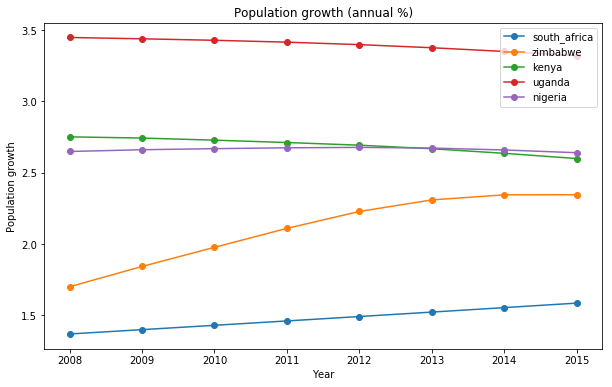

In [389]:
african_countries = [south_africa, zimbabwe, kenya, uganda, nigeria]
label = ['south_africa', 'zimbabwe', 'kenya', 'uganda', 'nigeria']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'

africian = plot_features(african_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Zimbabwe's population is increasing fast

### North American countries w.r.t population growth

In [390]:
canada = demography.loc[['Canada'], ['Population growth (annual %)']]; canada['Year'] = year
north_america = demography.loc[['North America'], ['Population growth (annual %)']]; north_america['Year'] = year
united_states = demography.loc[['United States'], ['Population growth (annual %)']]; united_states['Year'] = year

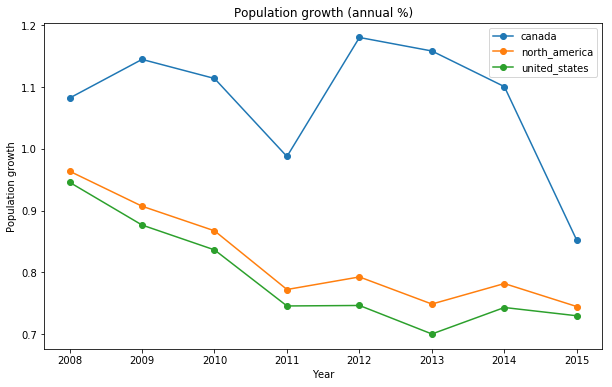

In [391]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### North America and United States population growth is mostly decreasing except in 2013

### European countries w.r.t Population growth

In [392]:
united_kingdom = demography.loc[['United Kingdom'], ['Population growth (annual %)']]; united_kingdom['Year'] = year
france = demography.loc[['France'], ['Population growth (annual %)']]; france['Year'] = year
germany = demography.loc[['Germany'], ['Population growth (annual %)']]; germany['Year'] = year
russian_federation = demography.loc[['Russian Federation'], ['Population growth (annual %)']]; russian_federation['Year'] = year
greece = demography.loc[['Greece'], ['Population growth (annual %)']]; greece['Year'] = year


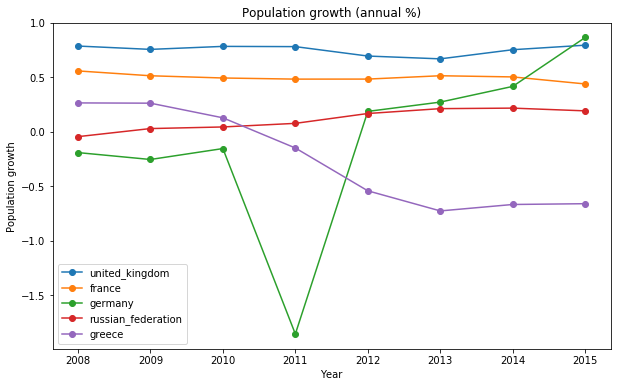

In [393]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'
european = plot_features(european_countries, feature, label, ylabel)


### Some interesting takeaways: 
#### Germany has a sharp dip in population growth in 2011
#### Greece population growth is decreasing till 2013 and then almost constant

### Arab countries w.r.t population growth 

In [394]:
egypt = demography.loc[['Egypt, Arab Rep.'], ['Population growth (annual %)']]; egypt['Year'] = year
iraq = demography.loc[['Iraq'], ['Population growth (annual %)']]; iraq['Year'] = year
saudi_arabia = demography.loc[['Saudi Arabia'], ['Population growth (annual %)']]; saudi_arabia['Year'] = year
somalia = demography.loc[['Somalia'], ['Population growth (annual %)']]; somalia['Year'] = year
sudan = demography.loc[['Sudan'], ['Population growth (annual %)']]; sudan['Year'] = year
uae = demography.loc[['United Arab Emirates'], ['Population growth (annual %)']]; uae['Year'] = year

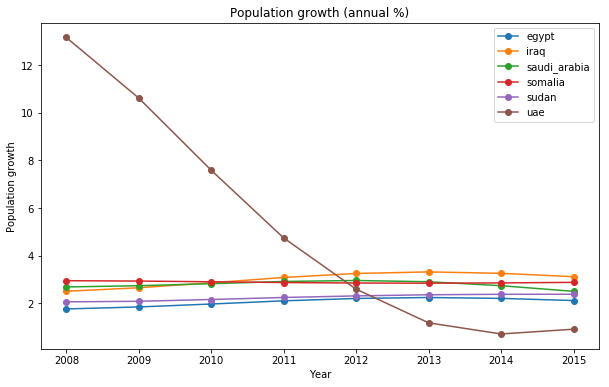

In [395]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### UAE's population growth had decreased fast till 2013

### South American countries w.r.t population growth

In [396]:
brazil = demography.loc[['Brazil'], ['Population growth (annual %)']]; brazil['Year'] = year
jamaica = demography.loc[['Jamaica'], ['Population growth (annual %)']]; jamaica['Year'] = year
mexico = demography.loc[['Mexico'], ['Population growth (annual %)']]; mexico['Year'] = year
venezuela = demography.loc[['Venezuela, RB'], ['Population growth (annual %)']]; venezuela['Year'] = year
peru = demography.loc[['Peru'], ['Population growth (annual %)']]; peru['Year'] = year
uruguay = demography.loc[['Uruguay'], ['Population growth (annual %)']]; uruguay['Year'] = year

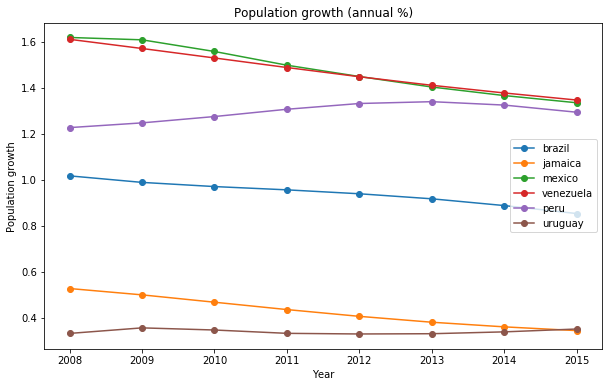

In [397]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Selected countries w.r.t population growth

In [398]:
india = demography.loc[['India'], ['Population growth (annual %)']]; india['Year'] = year
china = demography.loc[['China'], ['Population growth (annual %)']]; china['Year'] = year
japan = demography.loc[['Japan'], ['Population growth (annual %)']]; japan['Year'] = year
united_kingdom = demography.loc[['United Kingdom'], ['Population growth (annual %)']]; united_kingdom['Year'] = year
russian_federation = demography.loc[['Russian Federation'], ['Population growth (annual %)']]; russian_federation['Year'] = year
united_states = demography.loc[['United States'], ['Population growth (annual %)']]; united_states['Year'] = year
germany = demography.loc[['Germany'], ['Population growth (annual %)']]; germany['Year'] = year
france = demography.loc[['France'], ['Population growth (annual %)']]; france['Year'] = year
israel = demography.loc[['Israel'], ['Population growth (annual %)']]; israel['Year'] = year
saudi_arabia = demography.loc[['Saudi Arabia'], ['Population growth (annual %)']]; saudi_arabia['Year'] = year
uae = demography.loc[['United Arab Emirates'], ['Population growth (annual %)']]; uae['Year'] = year
canada = demography.loc[['Canada'], ['Population growth (annual %)']]; canada['Year'] = year

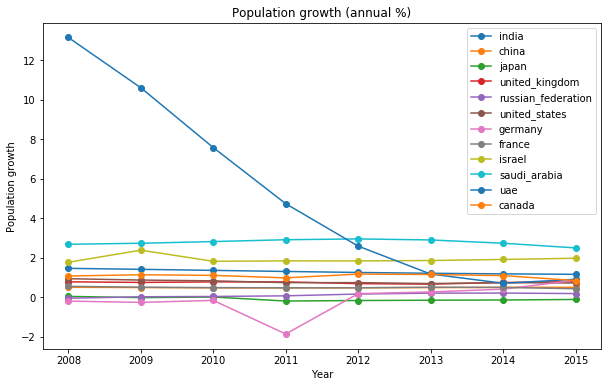

In [400]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Population growth (annual %)'
ylabel = 'Population growth'
south_american = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Looks like India is controlling the population 

### Selected countries w.r.t total population

In [402]:
india = demography.loc[['India'], ['Population, total']]; india['Year'] = year
china = demography.loc[['China'], ['Population, total']]; china['Year'] = year
japan = demography.loc[['Japan'], ['Population, total']]; japan['Year'] = year
united_kingdom = demography.loc[['United Kingdom'], ['Population, total']]; united_kingdom['Year'] = year
russian_federation = demography.loc[['Russian Federation'], ['Population, total']]; russian_federation['Year'] = year
united_states = demography.loc[['United States'], ['Population, total']]; united_states['Year'] = year
germany = demography.loc[['Germany'], ['Population, total']]; germany['Year'] = year
france = demography.loc[['France'], ['Population, total']]; france['Year'] = year
israel = demography.loc[['Israel'], ['Population, total']]; israel['Year'] = year
saudi_arabia = demography.loc[['Saudi Arabia'], ['Population, total']]; saudi_arabia['Year'] = year
uae = demography.loc[['United Arab Emirates'], ['Population, total']]; uae['Year'] = year
canada = demography.loc[['Canada'], ['Population, total']]; canada['Year'] = year

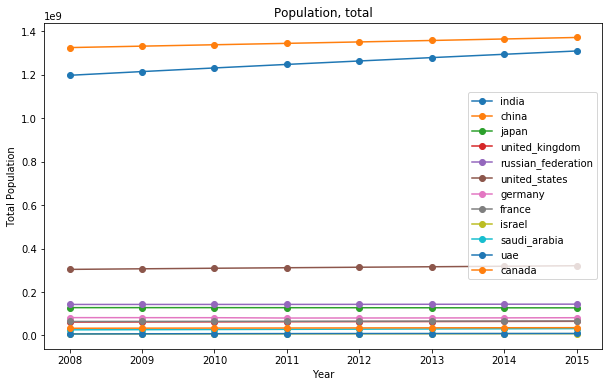

In [403]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Population, total'
ylabel = 'Total Population'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### China and India are way ahead in terms of population

### Now we will explore the trade

In [410]:
trade = cd[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']]


### Histogram of Imports

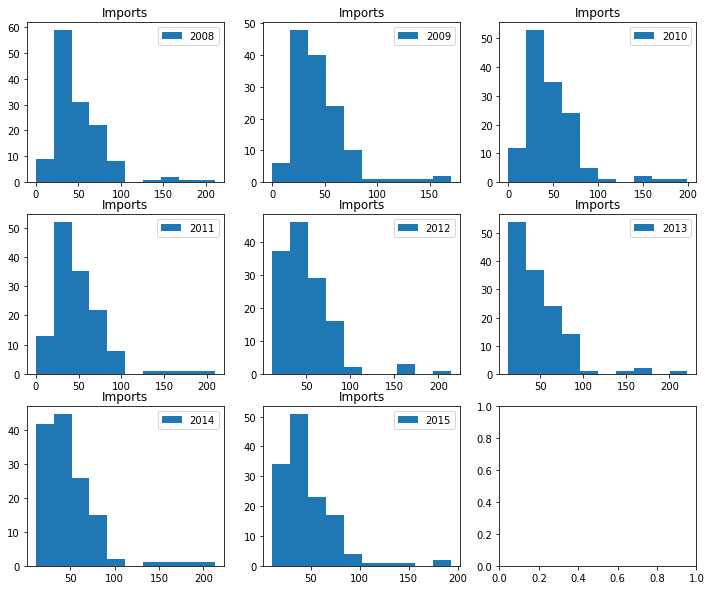

In [405]:
feature = 'Imports of goods and services (% of GDP)'
title = 'Imports'

TR = histogram_demography(years, feature, year, title)

### Histogram of Exports


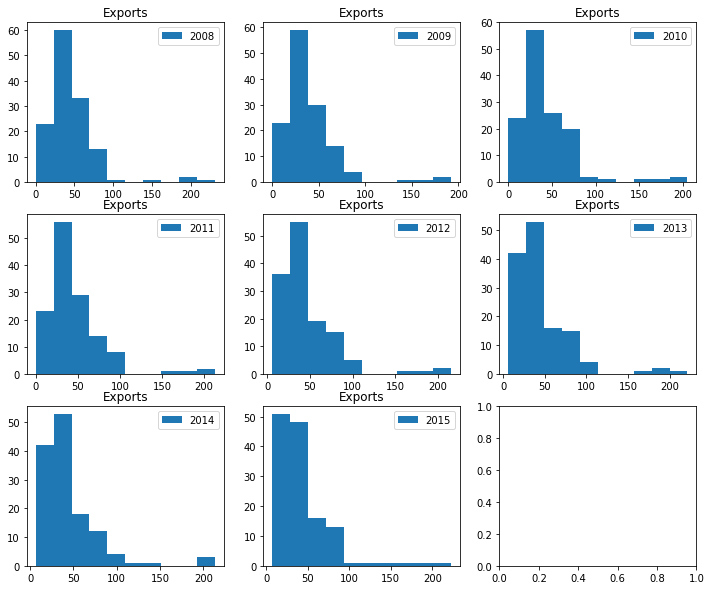

In [406]:
feature = 'Exports of goods and services (% of GDP)'
title = 'Exports'

TR = histogram_demography(years, feature, year, title)

### Barplot of countries w.r.t Imports and Exports

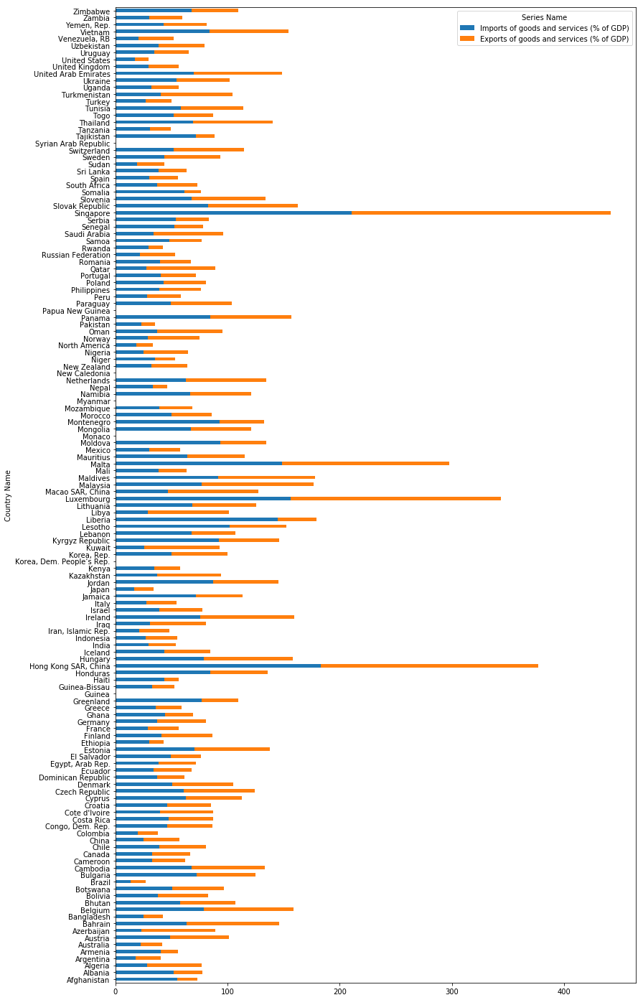

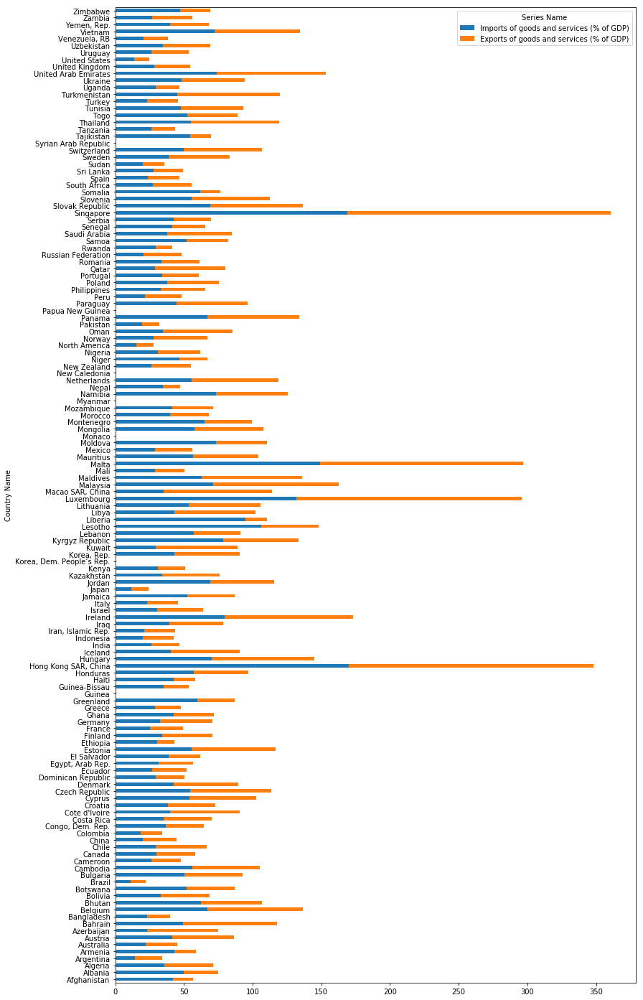

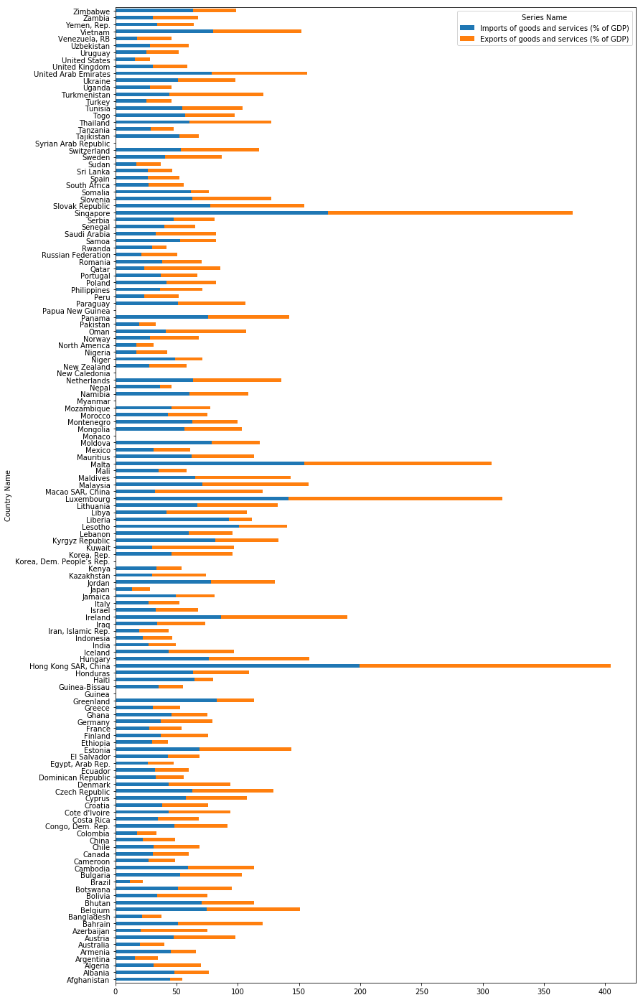

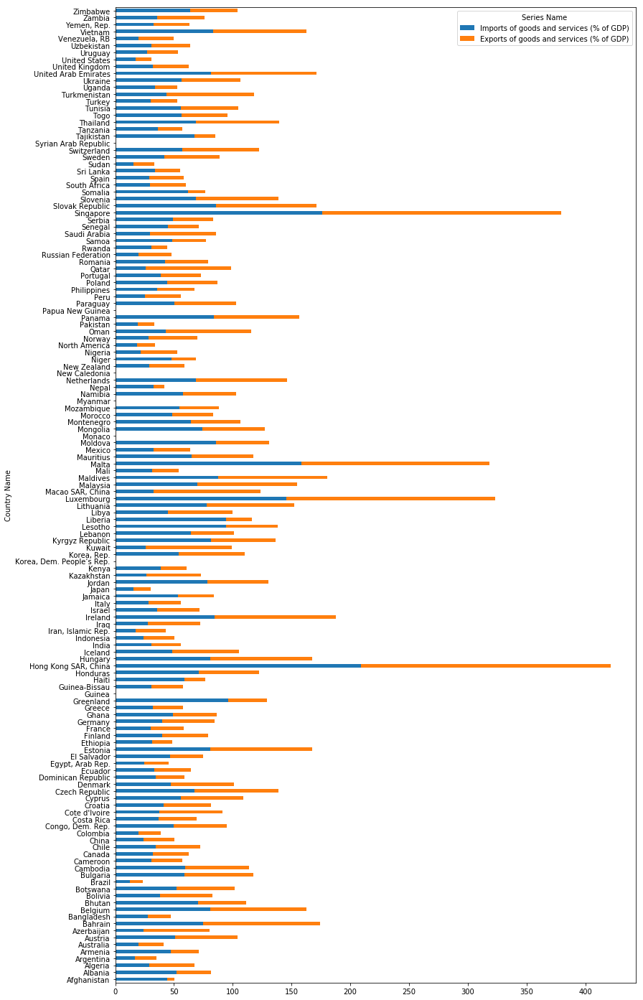

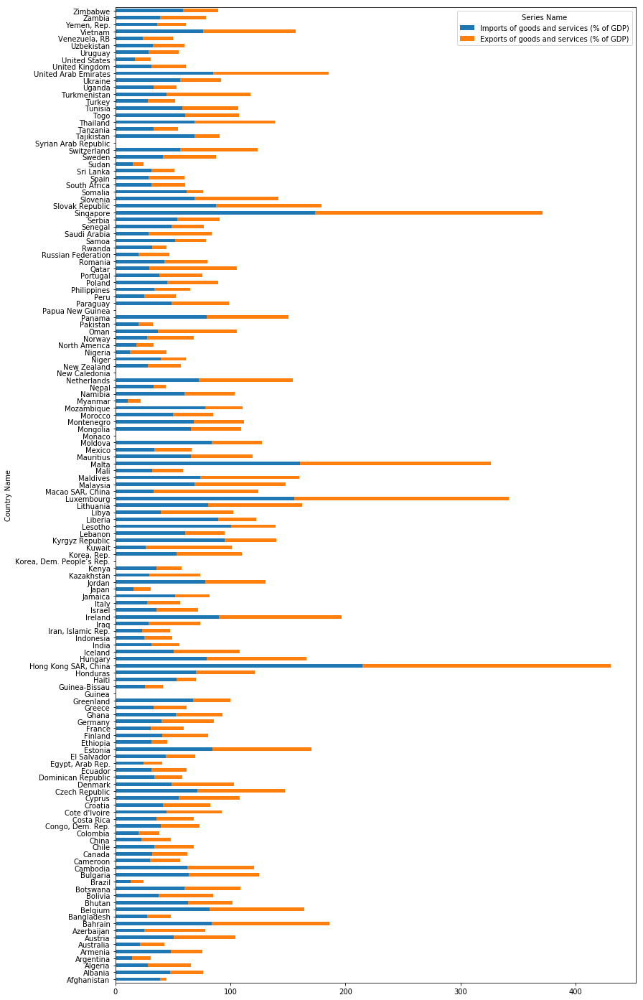

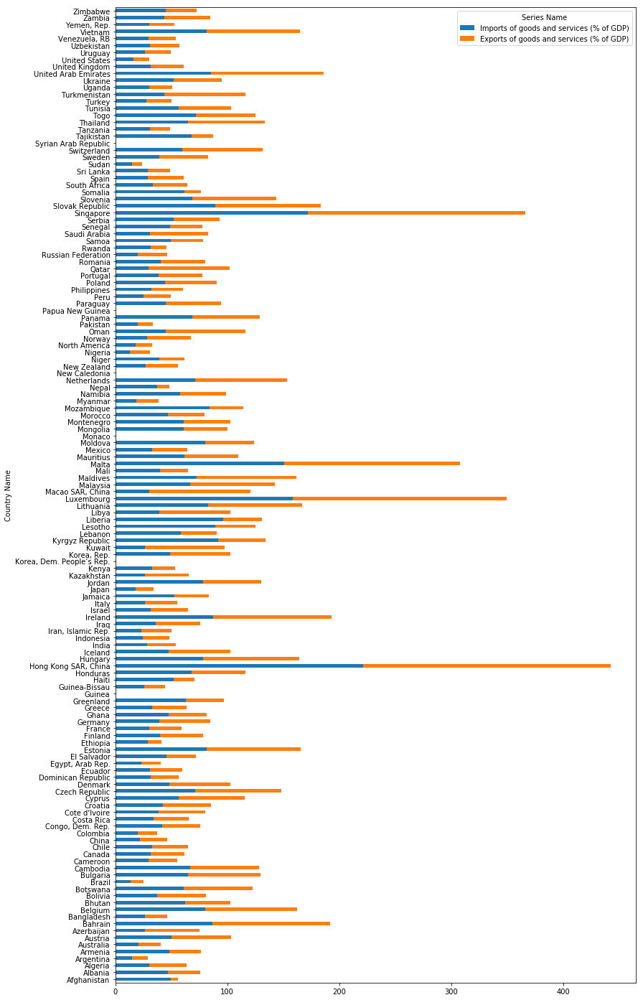

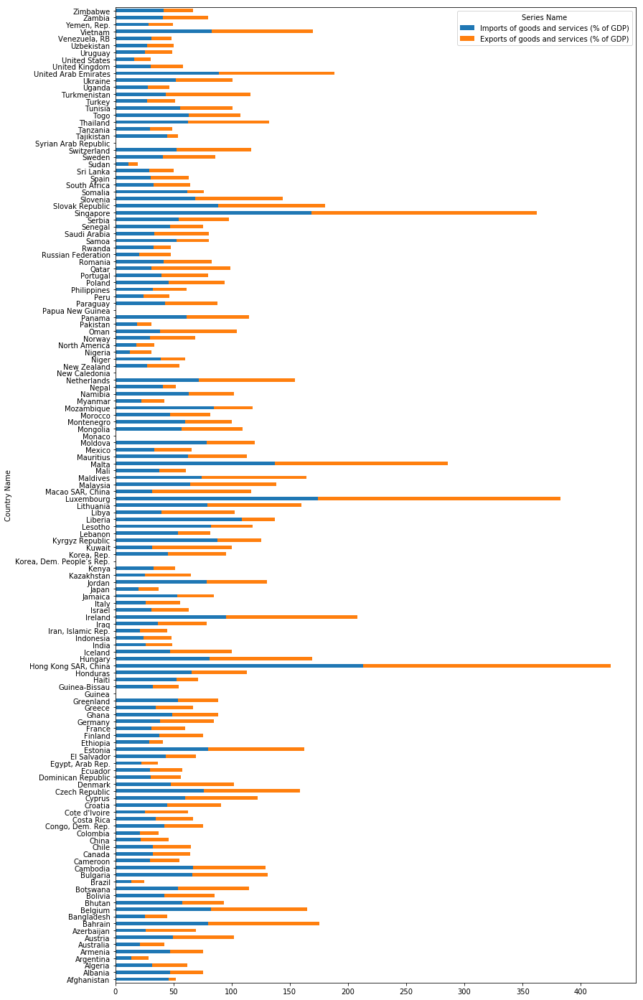

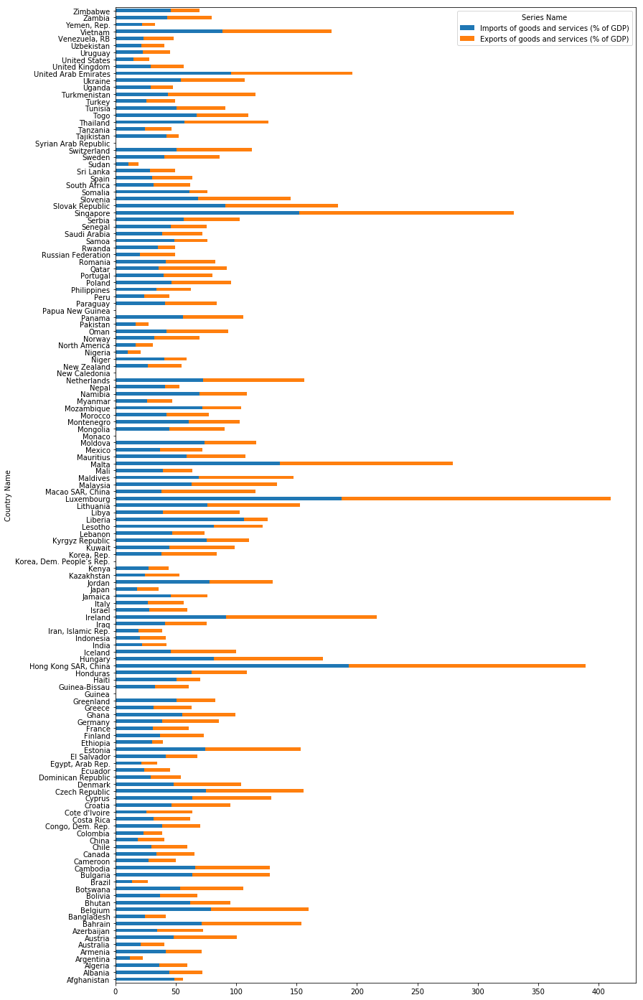

In [84]:
cleaned_data_2008[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['Imports of goods and services (% of GDP)', 'Exports of goods and services (% of GDP)']].plot.barh(stacked = True, figsize = (13, 25))


### Asian countries w.r.t Imports

In [411]:
india = trade.loc[['India'], ['Imports of goods and services (% of GDP)']]; india['Year'] = year
china = trade.loc[['China'], ['Imports of goods and services (% of GDP)']]; china['Year'] = year
japan = trade.loc[['Japan'], ['Imports of goods and services (% of GDP)']]; japan['Year'] = year
bangladesh = trade.loc[['Bangladesh'], ['Imports of goods and services (% of GDP)']]; bangladesh['Year'] = year
afghanistan = trade.loc[['Afghanistan'], ['Imports of goods and services (% of GDP)']]; afghanistan['Year'] = year


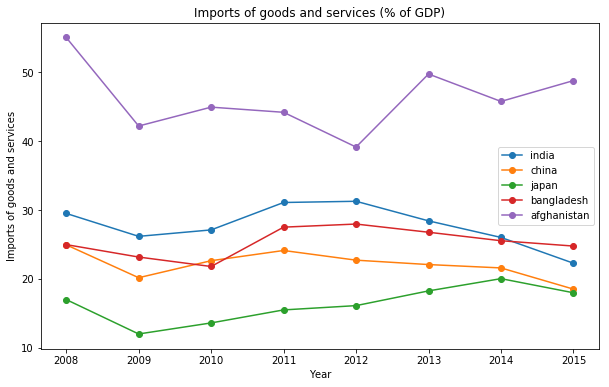

In [412]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Imports of goods and services (% of GDP)'
ylabel = 'Imports of goods and services'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Every countries imports is fluctuating but Afghanistan is fluctuating the most

### Asian countries w.r.t Exports

In [415]:
india = trade.loc[['India'], ['Exports of goods and services (% of GDP)']]; india['Year'] = year
china = trade.loc[['China'], ['Exports of goods and services (% of GDP)']]; china['Year'] = year
japan = trade.loc[['Japan'], ['Exports of goods and services (% of GDP)']]; japan['Year'] = year
bangladesh = trade.loc[['Bangladesh'], ['Exports of goods and services (% of GDP)']]; bangladesh['Year'] = year
afghanistan = trade.loc[['Afghanistan'], ['Exports of goods and services (% of GDP)']]; afghanistan['Year'] = year

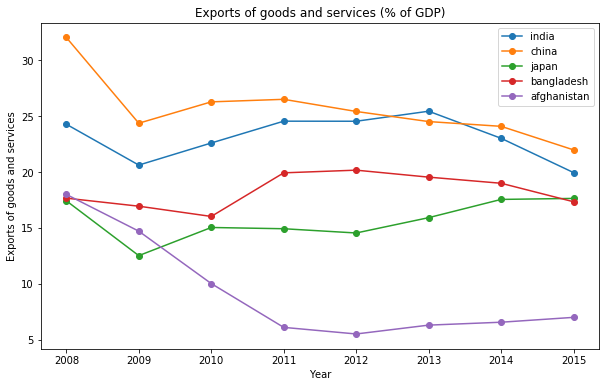

In [416]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Exports of goods and services (% of GDP)'
ylabel = 'Exports of goods and services'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Afghanistan's Export has decreased significantly

### North American countries w.r.t Imports

In [418]:
canada = trade.loc[['Canada'], ['Imports of goods and services (% of GDP)']]; canada['Year'] = year
north_america = trade.loc[['North America'], ['Imports of goods and services (% of GDP)']]; north_america['Year'] = year
united_states = trade.loc[['United States'], ['Imports of goods and services (% of GDP)']]; united_states['Year'] = year

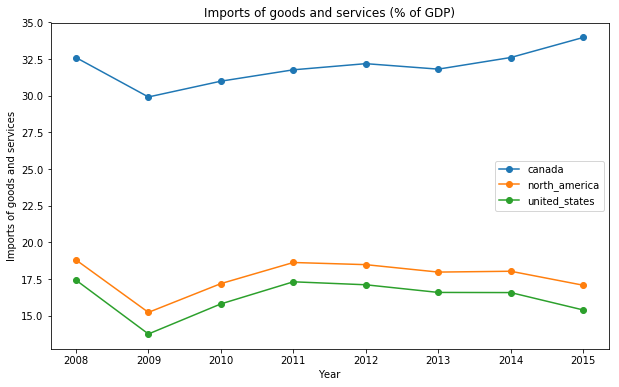

In [419]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Imports of goods and services (% of GDP)'
ylabel = 'Imports of goods and services'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Every country has a dip in 2009 and then they managed it well 

### North American countries w.r.t Exports

In [421]:
canada = trade.loc[['Canada'], ['Exports of goods and services (% of GDP)']]; canada['Year'] = year
north_america = trade.loc[['North America'], ['Exports of goods and services (% of GDP)']]; north_america['Year'] = year
united_states = trade.loc[['United States'], ['Exports of goods and services (% of GDP)']]; united_states['Year'] = year

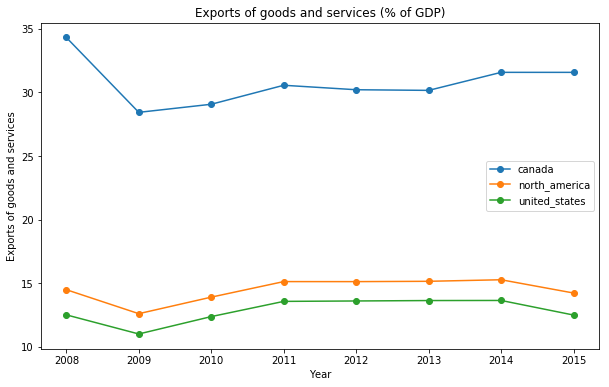

In [422]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Exports of goods and services (% of GDP)'
ylabel = 'Exports of goods and services'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### European countries w.r.t Imports

In [423]:
united_kingdom = trade.loc[['United Kingdom'], ['Imports of goods and services (% of GDP)']]; united_kingdom['Year'] = year
france = trade.loc[['France'], ['Imports of goods and services (% of GDP)']]; france['Year'] = year
germany = trade.loc[['Germany'], ['Imports of goods and services (% of GDP)']]; germany['Year'] = year
russian_federation = trade.loc[['Russian Federation'], ['Imports of goods and services (% of GDP)']]; russian_federation['Year'] = year
greece = trade.loc[['Greece'], ['Imports of goods and services (% of GDP)']]; greece['Year'] = year


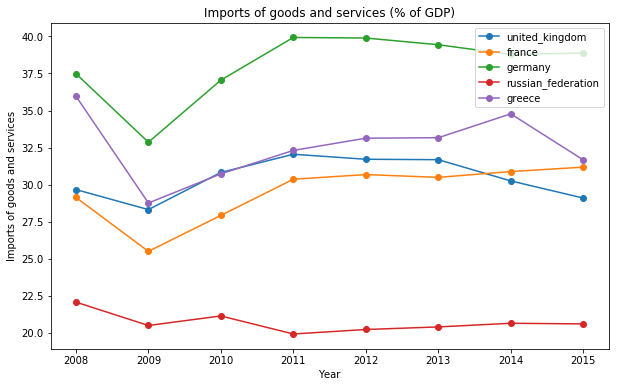

In [424]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Imports of goods and services (% of GDP)'
ylabel = 'Imports of goods and services'
european = plot_features(european_countries, feature, label, ylabel)


### Some interesting takeaways: 
#### There is a significant dip in 2009 and every country managed well after that except Russian Federation

### European countries w.r.t Exports

In [426]:
united_kingdom = trade.loc[['United Kingdom'], ['Exports of goods and services (% of GDP)']]; united_kingdom['Year'] = year
france = trade.loc[['France'], ['Exports of goods and services (% of GDP)']]; france['Year'] = year
germany = trade.loc[['Germany'], ['Exports of goods and services (% of GDP)']]; germany['Year'] = year
russian_federation = trade.loc[['Russian Federation'], ['Exports of goods and services (% of GDP)']]; russian_federation['Year'] = year
greece = trade.loc[['Greece'], ['Exports of goods and services (% of GDP)']]; greece['Year'] = year

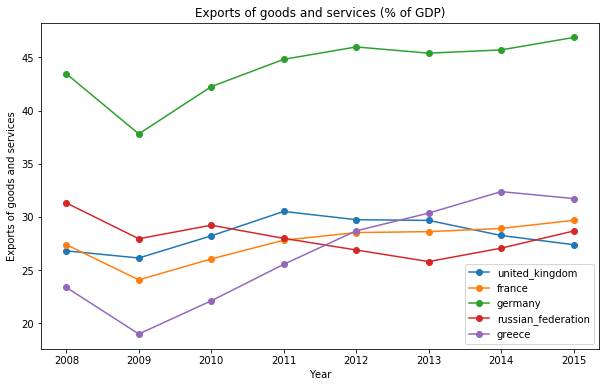

In [427]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Exports of goods and services (% of GDP)'
ylabel = 'Exports of goods and services'
european = plot_features(european_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Germany and Greece exports has increased significantly after 2009

### Arab countries w.r.t Imports

In [428]:
egypt = trade.loc[['Egypt, Arab Rep.'], ['Imports of goods and services (% of GDP)']]; egypt['Year'] = year
iraq = trade.loc[['Iraq'], ['Imports of goods and services (% of GDP)']]; iraq['Year'] = year
saudi_arabia = trade.loc[['Saudi Arabia'], ['Imports of goods and services (% of GDP)']]; saudi_arabia['Year'] = year
somalia = trade.loc[['Somalia'], ['Imports of goods and services (% of GDP)']]; somalia['Year'] = year
sudan = trade.loc[['Sudan'], ['Imports of goods and services (% of GDP)']]; sudan['Year'] = year
uae = trade.loc[['United Arab Emirates'], ['Imports of goods and services (% of GDP)']]; uae['Year'] = year


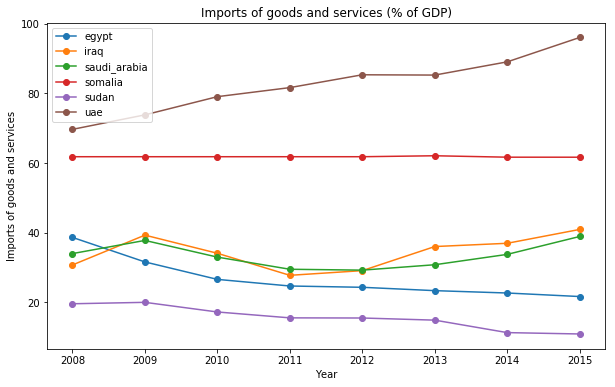

In [429]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Imports of goods and services (% of GDP)'
ylabel = 'Imports of goods and services'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Only UAE Imports increasing continuously

### Arab countries w.r.t Exports

In [431]:
egypt = trade.loc[['Egypt, Arab Rep.'], ['Exports of goods and services (% of GDP)']]; egypt['Year'] = year
iraq = trade.loc[['Iraq'], ['Exports of goods and services (% of GDP)']]; iraq['Year'] = year
saudi_arabia = trade.loc[['Saudi Arabia'], ['Exports of goods and services (% of GDP)']]; saudi_arabia['Year'] = year
somalia = trade.loc[['Somalia'], ['Exports of goods and services (% of GDP)']]; somalia['Year'] = year
sudan = trade.loc[['Sudan'], ['Exports of goods and services (% of GDP)']]; sudan['Year'] = year
uae = trade.loc[['United Arab Emirates'], ['Exports of goods and services (% of GDP)']]; uae['Year'] = year


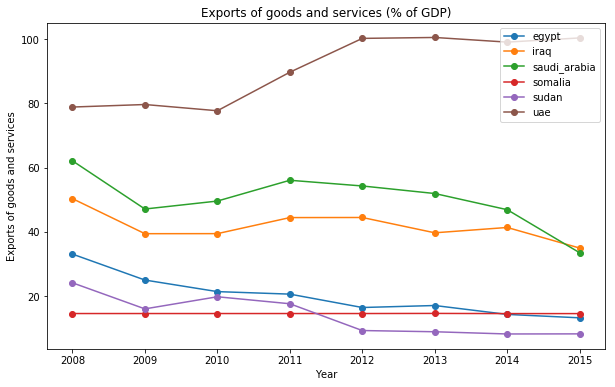

In [432]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Exports of goods and services (% of GDP)'
ylabel = 'Exports of goods and services'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### UAE Exports has increased from 2010 to 2012

### South American countries w.r.t Imports

In [434]:
brazil = trade.loc[['Brazil'], ['Imports of goods and services (% of GDP)']]; brazil['Year'] = year
jamaica = trade.loc[['Jamaica'], ['Imports of goods and services (% of GDP)']]; jamaica['Year'] = year
mexico = trade.loc[['Mexico'], ['Imports of goods and services (% of GDP)']]; mexico['Year'] = year
venezuela = trade.loc[['Venezuela, RB'], ['Imports of goods and services (% of GDP)']]; venezuela['Year'] = year
peru = trade.loc[['Peru'], ['Imports of goods and services (% of GDP)']]; peru['Year'] = year
uruguay = trade.loc[['Uruguay'], ['Imports of goods and services (% of GDP)']]; uruguay['Year'] = year

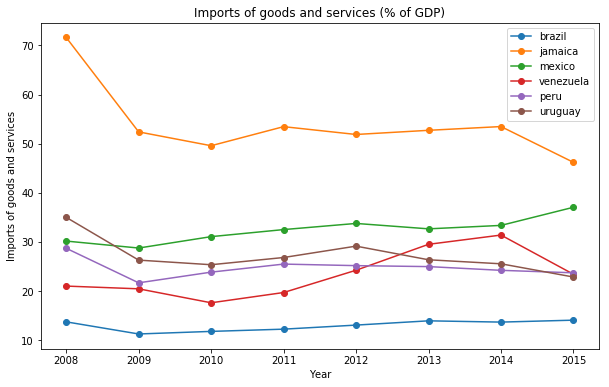

In [435]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Imports of goods and services (% of GDP)'
ylabel = 'Imports of goods and services'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Jamaica's Imports has decreased signioficantly till 2010 then it's not fluctuating much

### South American countries w.r.t Exports

In [436]:
brazil = trade.loc[['Brazil'], ['Exports of goods and services (% of GDP)']]; brazil['Year'] = year
jamaica = trade.loc[['Jamaica'], ['Exports of goods and services (% of GDP)']]; jamaica['Year'] = year
mexico = trade.loc[['Mexico'], ['Exports of goods and services (% of GDP)']]; mexico['Year'] = year
venezuela = trade.loc[['Venezuela, RB'], ['Exports of goods and services (% of GDP)']]; venezuela['Year'] = year
peru = trade.loc[['Peru'], ['Exports of goods and services (% of GDP)']]; peru['Year'] = year
uruguay = trade.loc[['Uruguay'], ['Exports of goods and services (% of GDP)']]; uruguay['Year'] = year

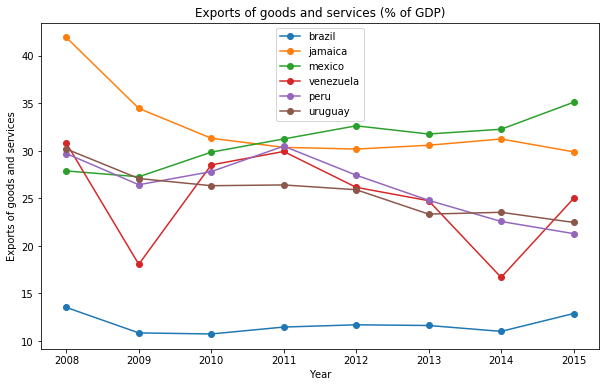

In [437]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Exports of goods and services (% of GDP)'
ylabel = 'Exports of goods and services'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Venezuela has sharp decrease in exports in 2009 and 2014
#### Jamaica's Export is decresasing 2011 and then constant

### Selected countries w.r.t Imports

In [438]:
india = trade.loc[['India'], ['Imports of goods and services (% of GDP)']]; india['Year'] = year
china = trade.loc[['China'], ['Imports of goods and services (% of GDP)']]; china['Year'] = year
japan = trade.loc[['Japan'], ['Imports of goods and services (% of GDP)']]; japan['Year'] = year
united_kingdom = trade.loc[['United Kingdom'], ['Imports of goods and services (% of GDP)']]; united_kingdom['Year'] = year
russian_federation = trade.loc[['Russian Federation'], ['Imports of goods and services (% of GDP)']]; russian_federation['Year'] = year
united_states = trade.loc[['United States'], ['Imports of goods and services (% of GDP)']]; united_states['Year'] = year
germany = trade.loc[['Germany'], ['Imports of goods and services (% of GDP)']]; germany['Year'] = year
france = trade.loc[['France'], ['Imports of goods and services (% of GDP)']]; france['Year'] = year
israel = trade.loc[['Israel'], ['Imports of goods and services (% of GDP)']]; israel['Year'] = year
saudi_arabia = trade.loc[['Saudi Arabia'], ['Imports of goods and services (% of GDP)']]; saudi_arabia['Year'] = year
uae = trade.loc[['United Arab Emirates'], ['Imports of goods and services (% of GDP)']]; uae['Year'] = year
canada = trade.loc[['Canada'], ['Imports of goods and services (% of GDP)']]; canada['Year'] = year

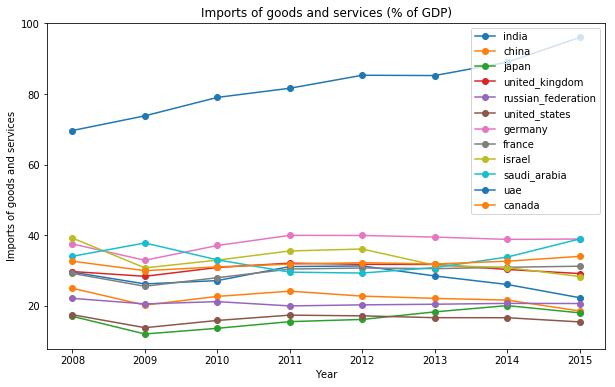

In [439]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Imports of goods and services (% of GDP)'
ylabel = 'Imports of goods and services'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### UAE's Imports had increased significantly over the time

### Selected countries w.r.t Exports

In [440]:
india = trade.loc[['India'], ['Exports of goods and services (% of GDP)']]; india['Year'] = year
china = trade.loc[['China'], ['Exports of goods and services (% of GDP)']]; china['Year'] = year
japan = trade.loc[['Japan'], ['Exports of goods and services (% of GDP)']]; japan['Year'] = year
united_kingdom = trade.loc[['United Kingdom'], ['Exports of goods and services (% of GDP)']]; united_kingdom['Year'] = year
russian_federation = trade.loc[['Russian Federation'], ['Exports of goods and services (% of GDP)']]; russian_federation['Year'] = year
united_states = trade.loc[['United States'], ['Exports of goods and services (% of GDP)']]; united_states['Year'] = year
germany = trade.loc[['Germany'], ['Exports of goods and services (% of GDP)']]; germany['Year'] = year
france = trade.loc[['France'], ['Exports of goods and services (% of GDP)']]; france['Year'] = year
israel = trade.loc[['Israel'], ['Exports of goods and services (% of GDP)']]; israel['Year'] = year
saudi_arabia = trade.loc[['Saudi Arabia'], ['Exports of goods and services (% of GDP)']]; saudi_arabia['Year'] = year
uae = trade.loc[['United Arab Emirates'], ['Exports of goods and services (% of GDP)']]; uae['Year'] = year
canada = trade.loc[['Canada'], ['Exports of goods and services (% of GDP)']]; canada['Year'] = year

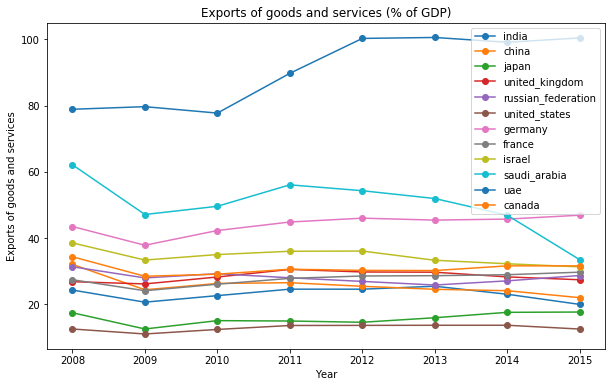

In [441]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Exports of goods and services (% of GDP)'
ylabel = 'Exports of goods and services'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### UAE's Exports had increased significantly over the time

### Now we will explore the economy

In [442]:
economy = cd[['GDP (current US$)', 'GDP growth (annual %)', 'GNI (current US$)', 'GNI growth (annual %)']]

### Histogram of GDP

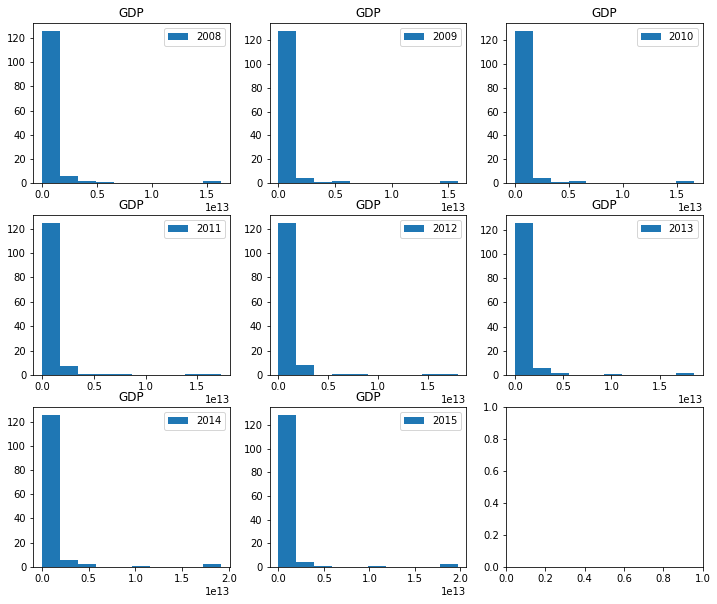

In [443]:
feature = 'GDP (current US$)'
title = 'GDP'

TR = histogram_demography(years, feature, year, title)

### Histogram of GDP growth

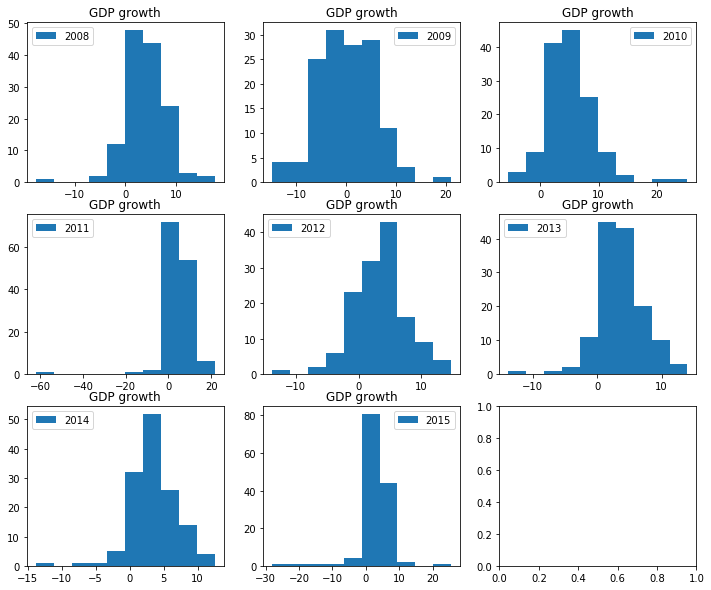

In [444]:
feature = 'GDP growth (annual %)'
title = 'GDP growth'

TR = histogram_demography(years, feature, year, title)

### Histogram of GNI

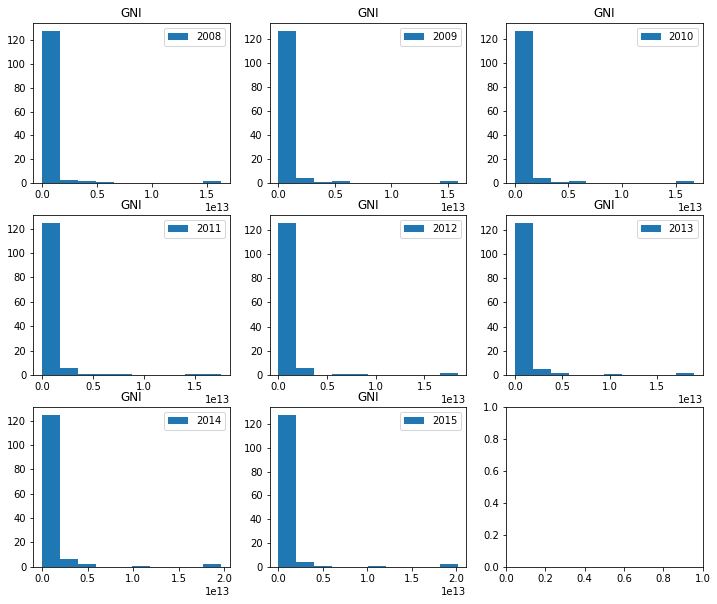

In [445]:
feature = 'GNI (current US$)'
title = 'GNI'

TR = histogram_demography(years, feature, year, title)

### Histogram of GNI growth

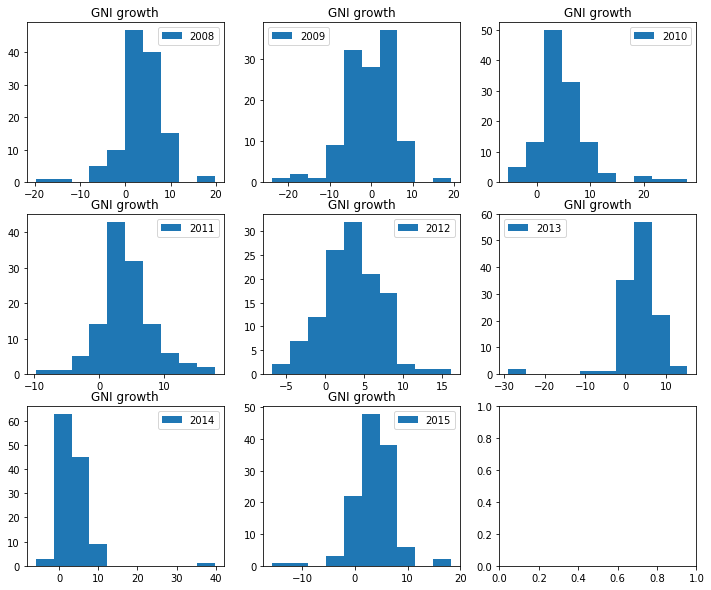

In [446]:
feature = 'GNI growth (annual %)'
title = 'GNI growth'

TR = histogram_demography(years, feature, year, title)

### Barplots of countries w.r.t GDP and GNI

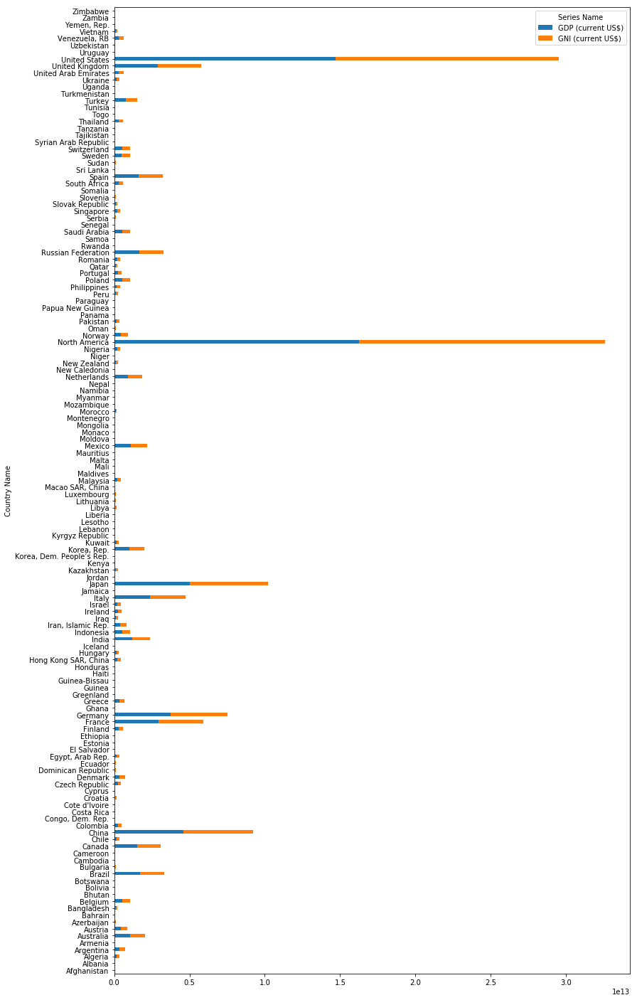

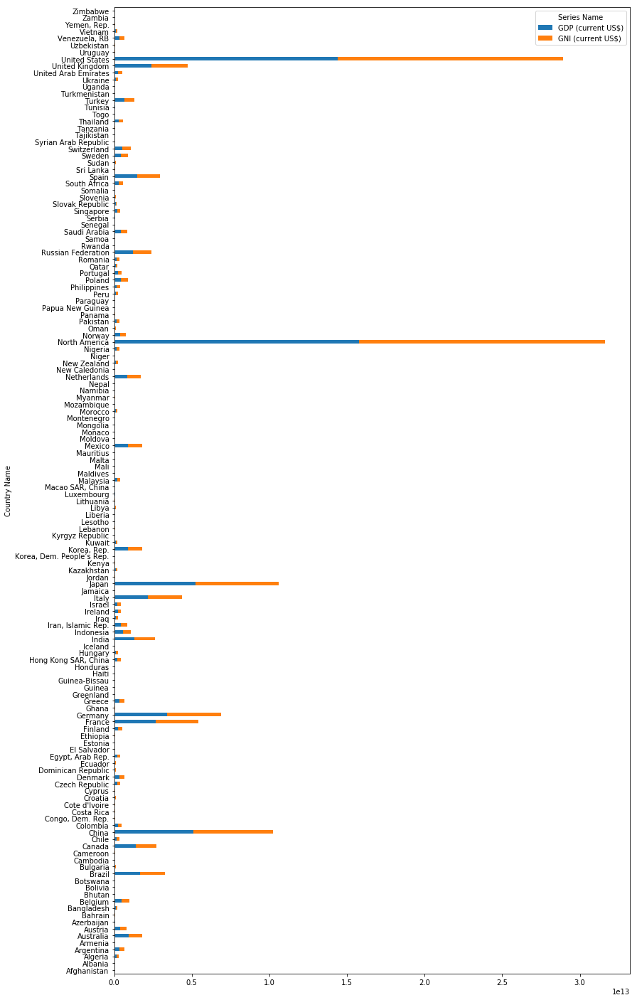

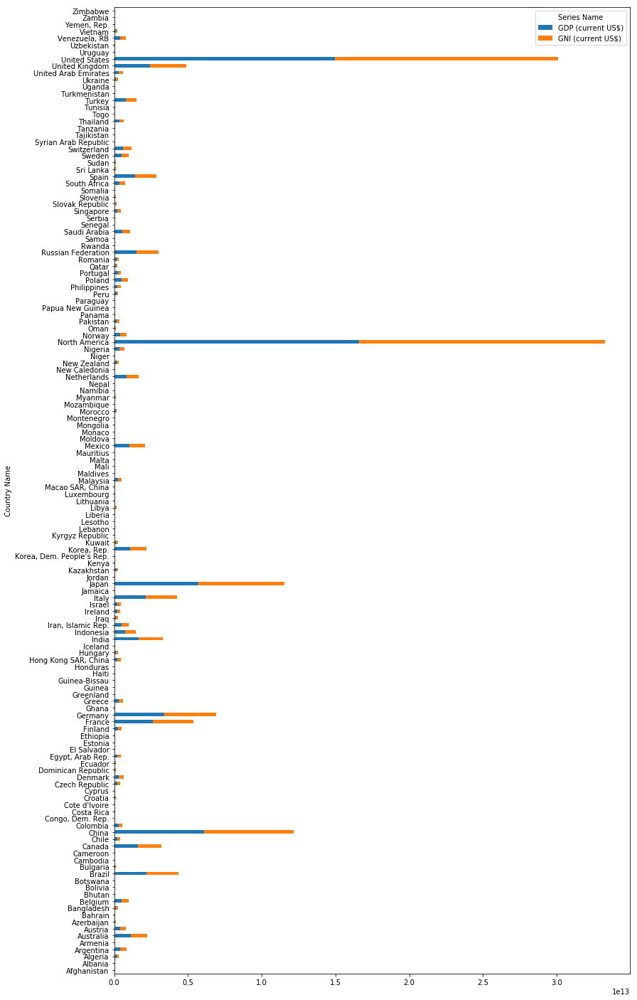

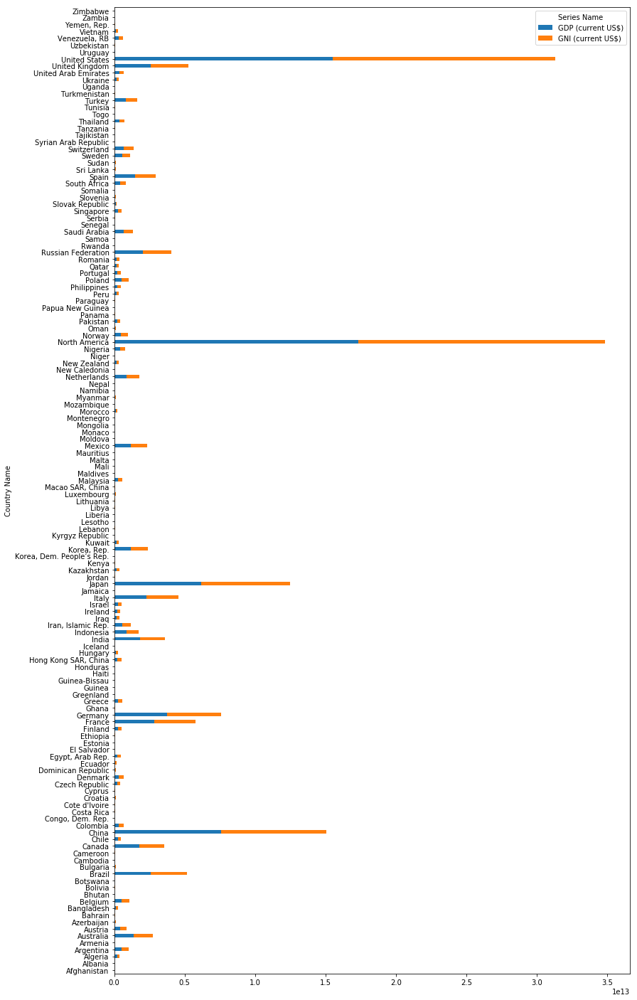

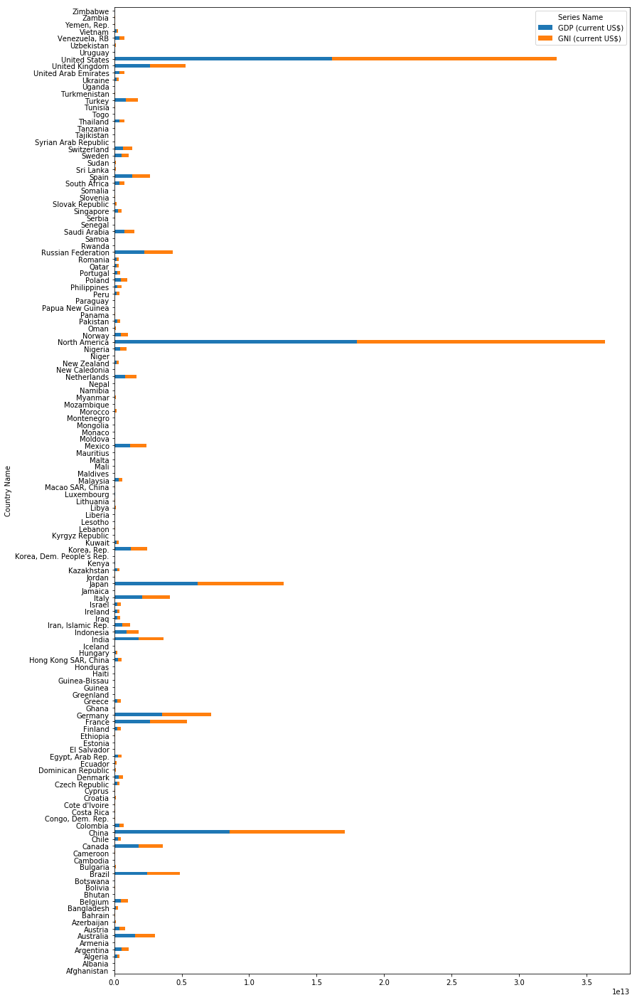

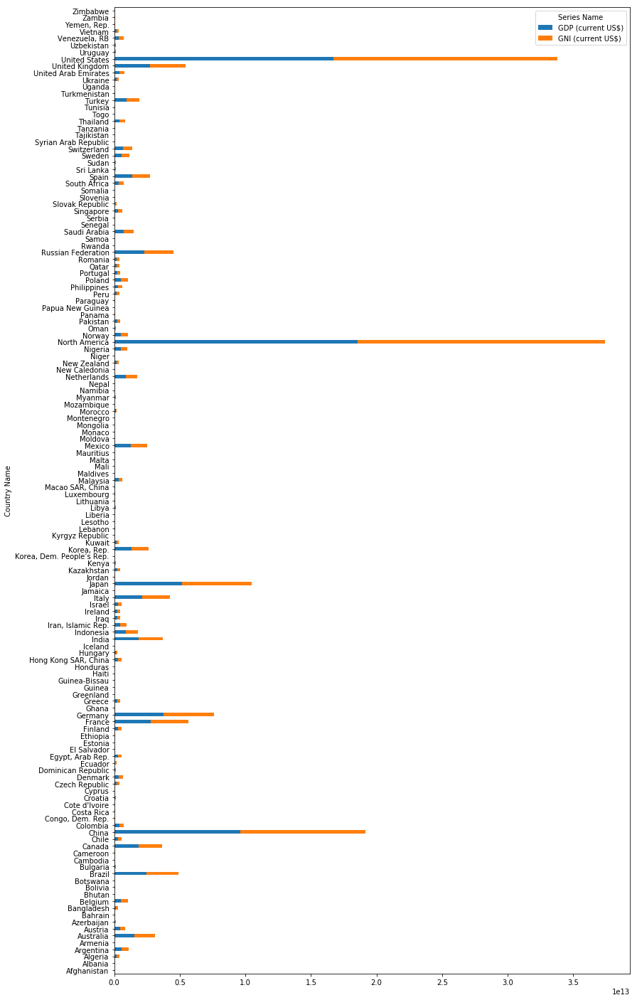

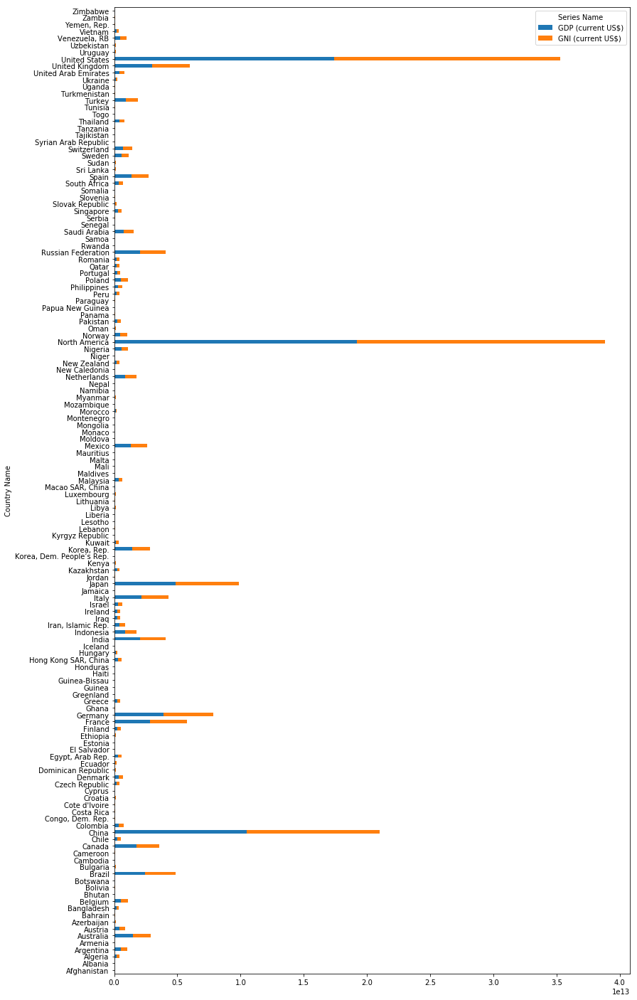

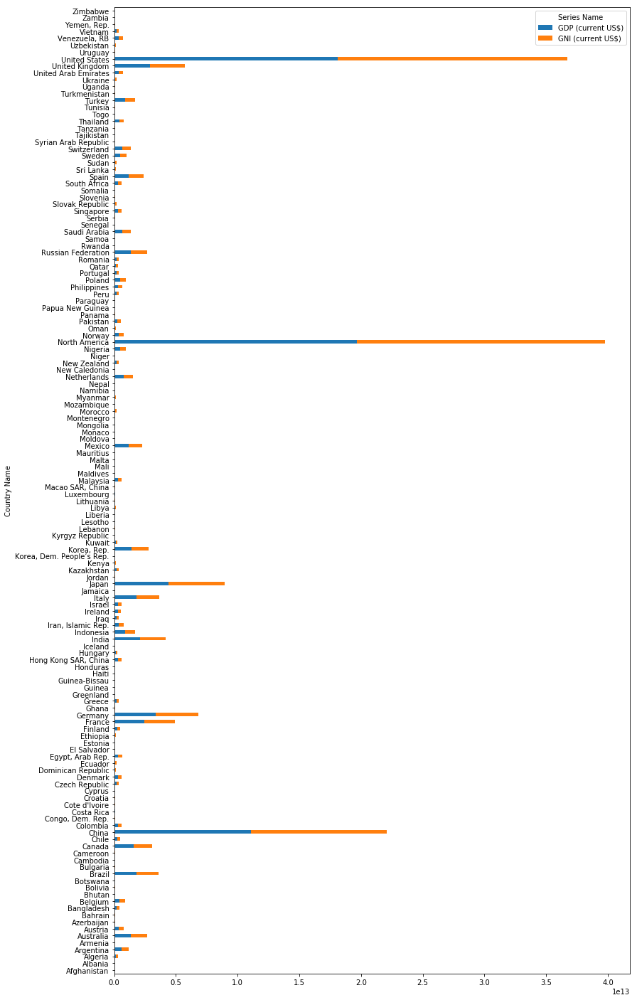

In [102]:
cleaned_data_2008[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['GDP (current US$)', 'GNI (current US$)']].plot.barh(stacked = True, figsize = (13, 25))


### Barplots of countries w.r.t GDP growth and GNI growth

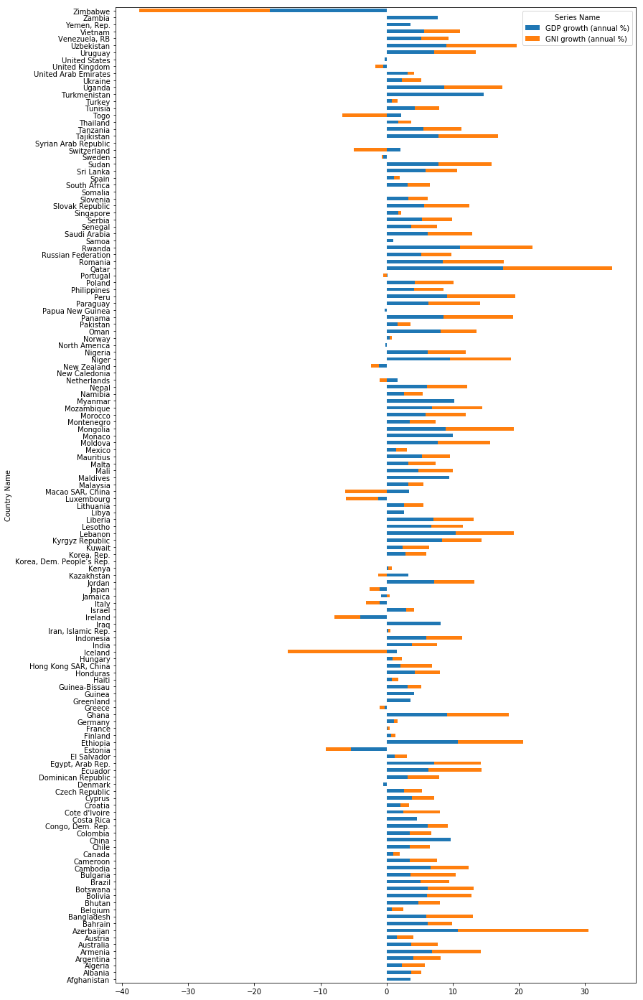

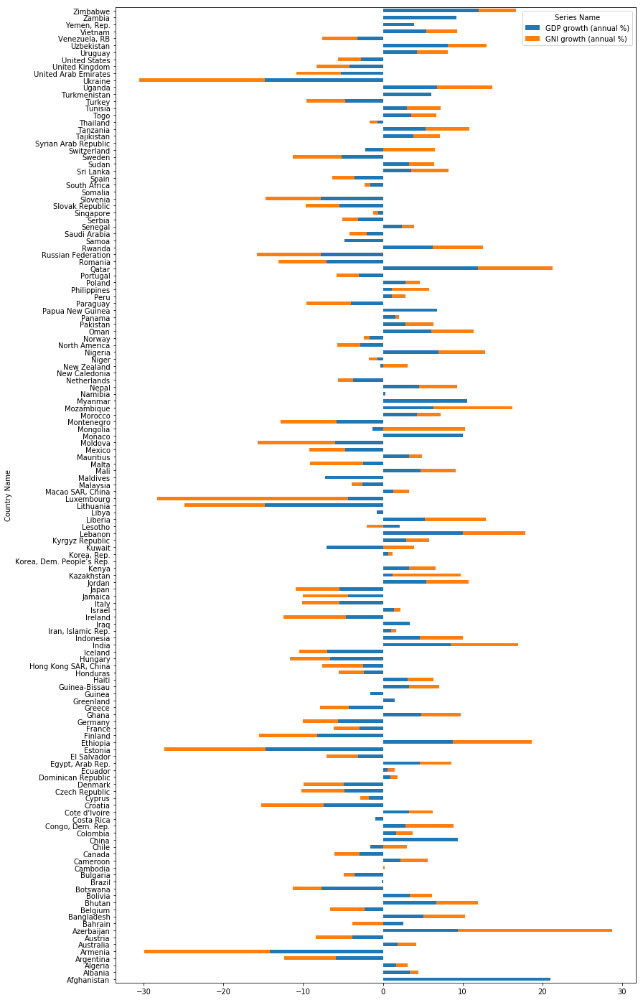

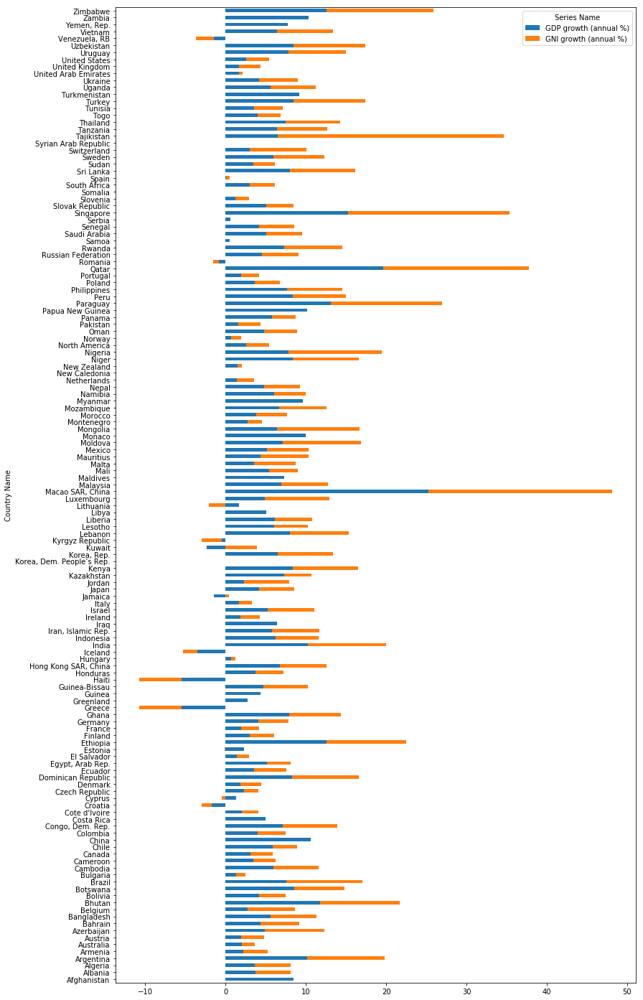

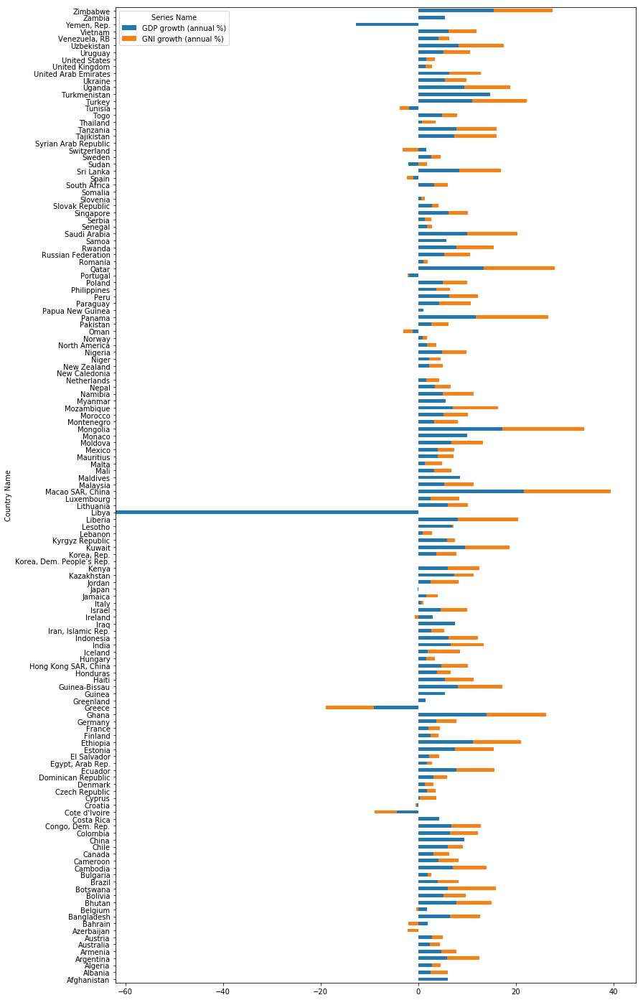

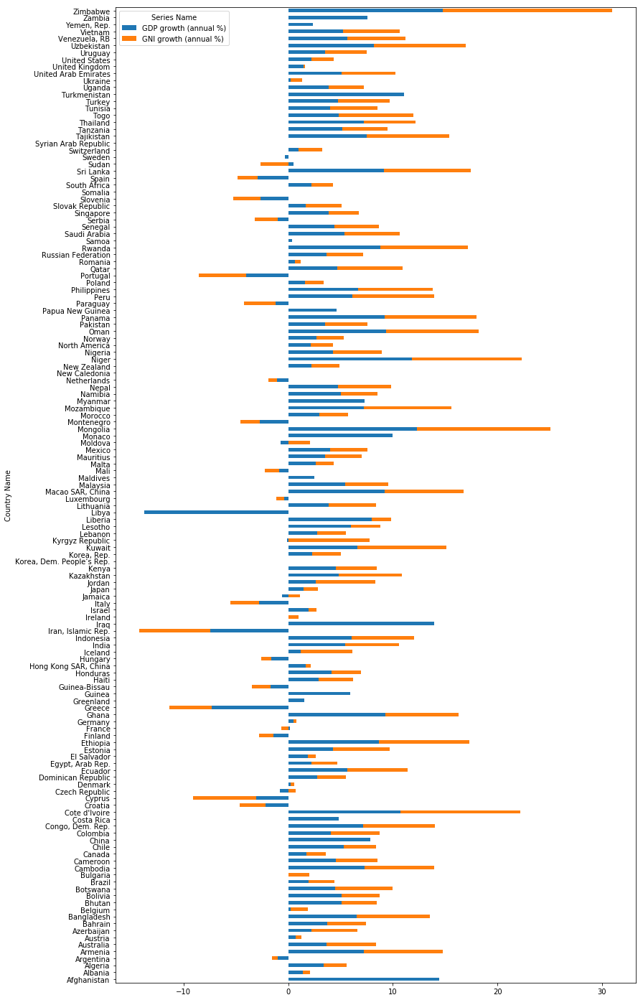

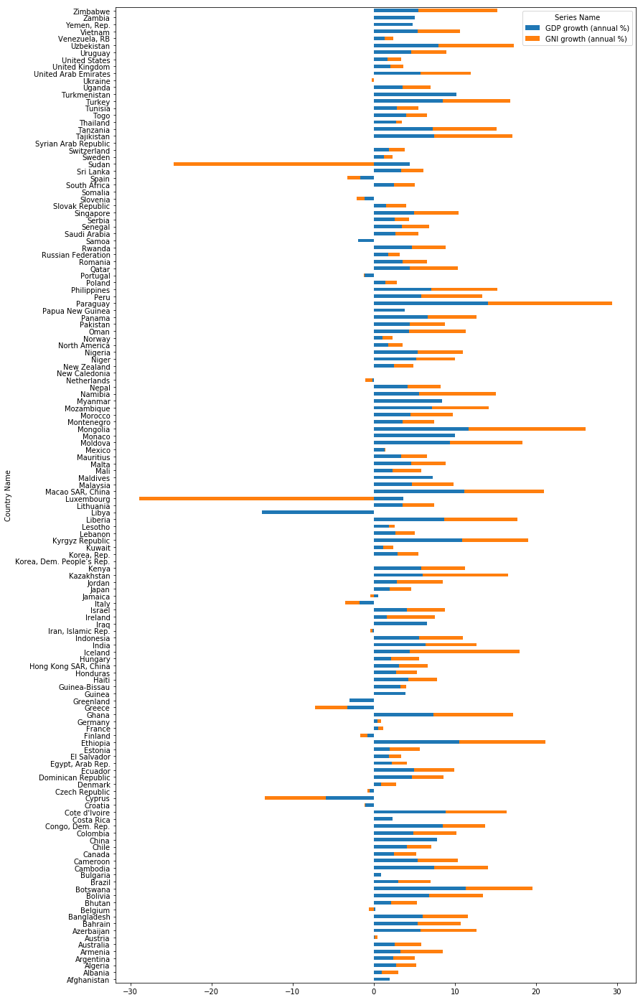

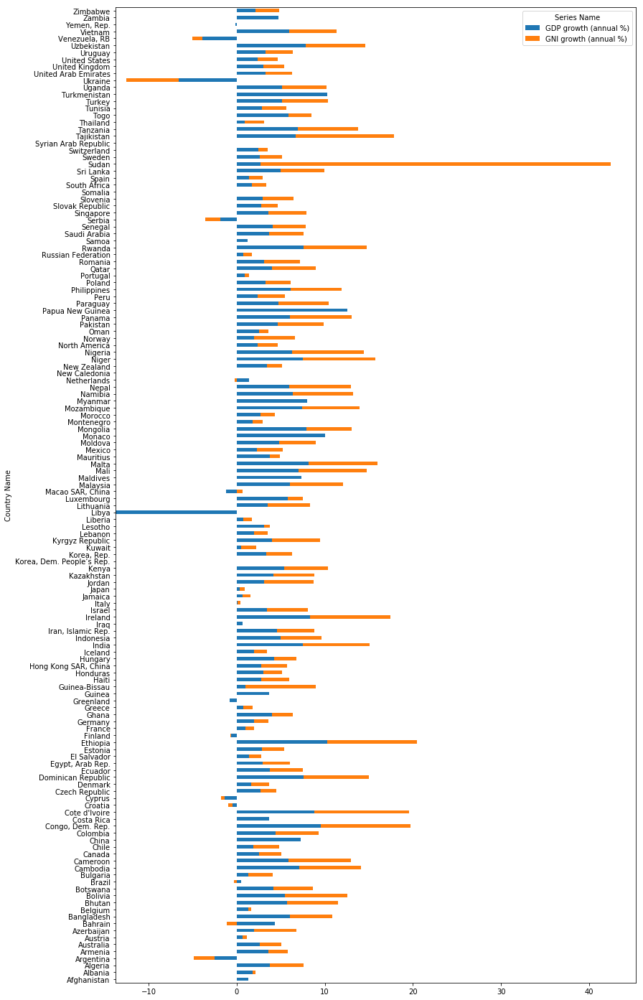

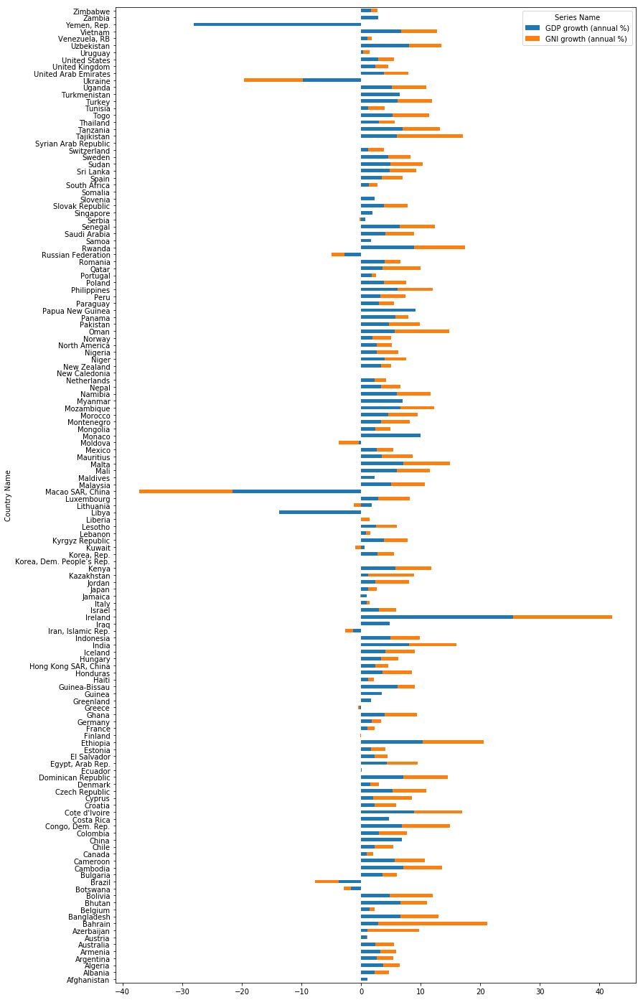

In [103]:
cleaned_data_2008[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['GDP growth (annual %)', 'GNI growth (annual %)']].plot.barh(stacked = True, figsize = (13, 25))


### Asian countries w.r.t GDP

In [447]:
india = economy.loc[['India'], ['GDP (current US$)']]; india['Year'] = year
china = economy.loc[['China'], ['GDP (current US$)']]; china['Year'] = year
japan = economy.loc[['Japan'], ['GDP (current US$)']]; japan['Year'] = year
bangladesh = economy.loc[['Bangladesh'], ['GDP (current US$)']]; bangladesh['Year'] = year
afghanistan = economy.loc[['Afghanistan'], ['GDP (current US$)']]; afghanistan['Year'] = year

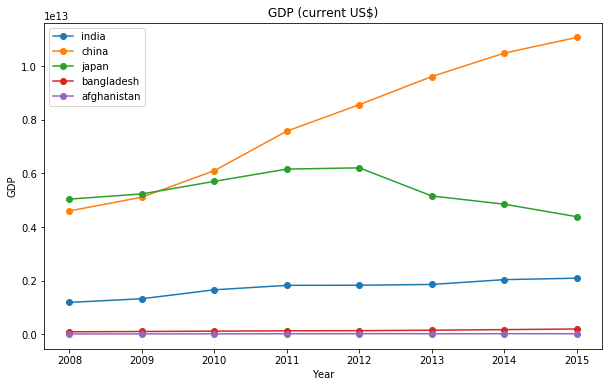

In [448]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'GDP (current US$)'
ylabel = 'GDP'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### China's GDP has increased significantly 
#### India's GDP is increasing very slowly

### Asian countries w.r.t GDP growth

In [449]:
india = economy.loc[['India'], ['GDP growth (annual %)']]; india['Year'] = year
china = economy.loc[['China'], ['GDP growth (annual %)']]; china['Year'] = year
japan = economy.loc[['Japan'], ['GDP growth (annual %)']]; japan['Year'] = year
bangladesh = economy.loc[['Bangladesh'], ['GDP growth (annual %)']]; bangladesh['Year'] = year
afghanistan = economy.loc[['Afghanistan'], ['GDP growth (annual %)']]; afghanistan['Year'] = year

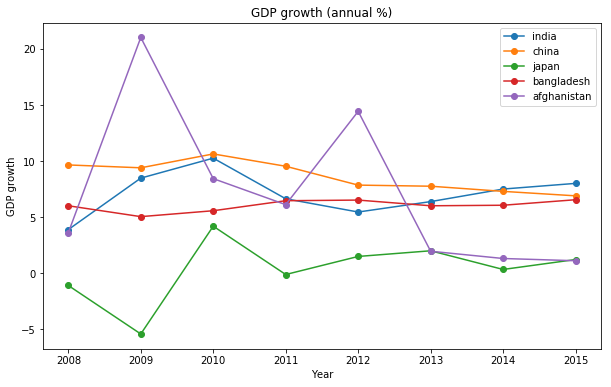

In [450]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'GDP growth (annual %)'
ylabel = 'GDP growth'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Japan and Afghanistan GDP growth is very much fluctuating

### North American countries w.r.t GDP

In [451]:
canada = economy.loc[['Canada'], ['GDP (current US$)']]; canada['Year'] = year
north_america = economy.loc[['North America'], ['GDP (current US$)']]; north_america['Year'] = year
united_states = economy.loc[['United States'], ['GDP (current US$)']]; united_states['Year'] = year

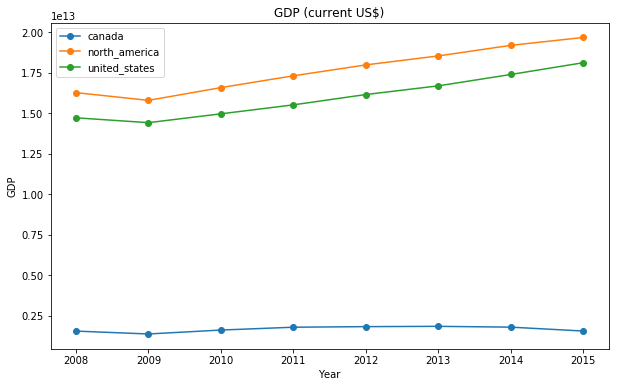

In [452]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'GDP (current US$)'
ylabel = 'GDP'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### United States and North America are way ahead in terms of GDP

### North American countries w.r.t GDP growth

In [453]:
canada = economy.loc[['Canada'], ['GDP growth (annual %)']]; canada['Year'] = year
north_america = economy.loc[['North America'], ['GDP growth (annual %)']]; north_america['Year'] = year
united_states = economy.loc[['United States'], ['GDP growth (annual %)']]; united_states['Year'] = year

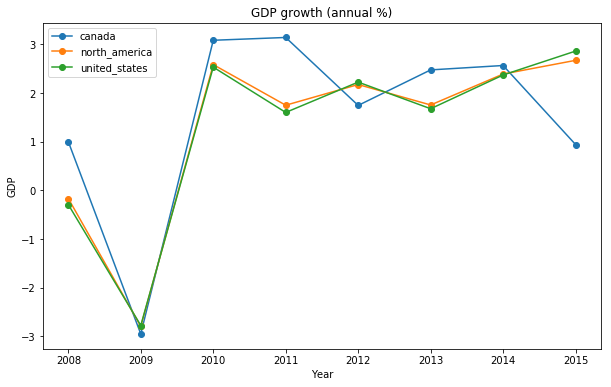

In [454]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'GDP growth (annual %)'
ylabel = 'GDP'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### There There is a sudden decrease in GDP growth in 2009 and then a massive increase in 2010

### European countries w.r.t GDP

In [455]:
united_kingdom = economy.loc[['United Kingdom'], ['GDP (current US$)']]; united_kingdom['Year'] = year
france = economy.loc[['France'], ['GDP (current US$)']]; france['Year'] = year
germany = economy.loc[['Germany'], ['GDP (current US$)']]; germany['Year'] = year
russian_federation = economy.loc[['Russian Federation'], ['GDP (current US$)']]; russian_federation['Year'] = year
greece = economy.loc[['Greece'], ['GDP (current US$)']]; greece['Year'] = year

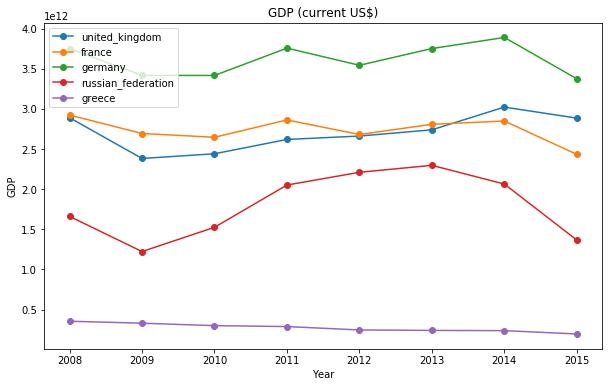

In [456]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'GDP (current US$)'
ylabel = 'GDP'
european = plot_features(european_countries, feature, label, ylabel)

### European countries w.r.t GDP growth

In [457]:
united_kingdom = economy.loc[['United Kingdom'], ['GDP growth (annual %)']]; united_kingdom['Year'] = year
france = economy.loc[['France'], ['GDP growth (annual %)']]; france['Year'] = year
germany = economy.loc[['Germany'], ['GDP growth (annual %)']]; germany['Year'] = year
russian_federation = economy.loc[['Russian Federation'], ['GDP growth (annual %)']]; russian_federation['Year'] = year
greece = economy.loc[['Greece'], ['GDP growth (annual %)']]; greece['Year'] = year

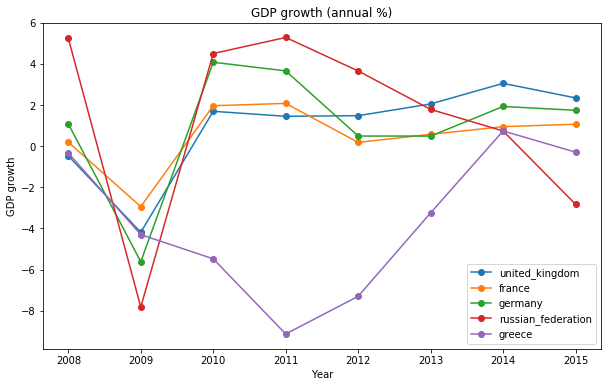

In [458]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'GDP growth (annual %)'
ylabel = 'GDP growth'
european = plot_features(european_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### For every countries GDP growth has decreased in 2009 and then increased mssively in 2010 except Greece

### Arab countries w.r.t GDP

In [460]:
egypt = economy.loc[['Egypt, Arab Rep.'], ['GDP (current US$)']]; egypt['Year'] = year
iraq = economy.loc[['Iraq'], ['GDP (current US$)']]; iraq['Year'] = year
saudi_arabia = economy.loc[['Saudi Arabia'], ['GDP (current US$)']]; saudi_arabia['Year'] = year
somalia = economy.loc[['Somalia'], ['GDP (current US$)']]; somalia['Year'] = year
sudan = economy.loc[['Sudan'], ['GDP (current US$)']]; sudan['Year'] = year
uae = economy.loc[['United Arab Emirates'], ['GDP (current US$)']]; uae['Year'] = year

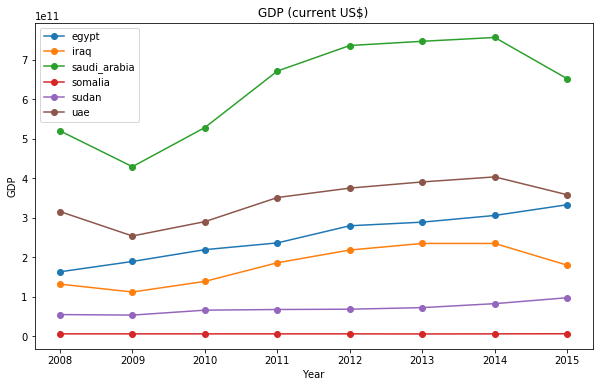

In [461]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'GDP (current US$)'
ylabel = 'GDP'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Every countries GDP is increasing slowly or constant but but Saudi Arabia has increased significantly

### Arab countries w.r.t GDP growth

In [462]:
egypt = economy.loc[['Egypt, Arab Rep.'], ['GDP growth (annual %)']]; egypt['Year'] = year
iraq = economy.loc[['Iraq'], ['GDP growth (annual %)']]; iraq['Year'] = year
saudi_arabia = economy.loc[['Saudi Arabia'], ['GDP growth (annual %)']]; saudi_arabia['Year'] = year
somalia = economy.loc[['Somalia'], ['GDP growth (annual %)']]; somalia['Year'] = year
sudan = economy.loc[['Sudan'], ['GDP growth (annual %)']]; sudan['Year'] = year
uae = economy.loc[['United Arab Emirates'], ['GDP growth (annual %)']]; uae['Year'] = year

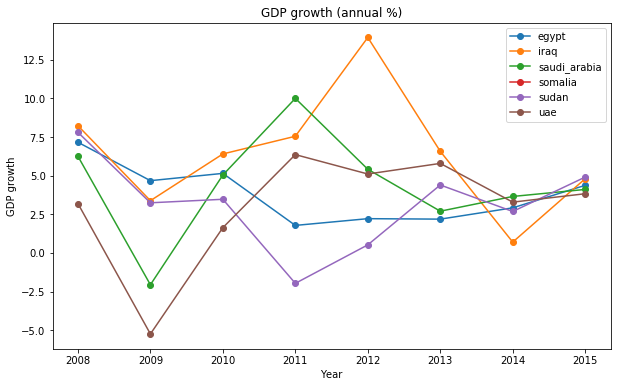

In [463]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'GDP growth (annual %)'
ylabel = 'GDP growth'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### As earlier dip in 2009 and increase in 2010

### South American countries w.r.t GDP

In [464]:
brazil = economy.loc[['Brazil'], ['GDP (current US$)']]; brazil['Year'] = year
jamaica = economy.loc[['Jamaica'], ['GDP (current US$)']]; jamaica['Year'] = year
mexico = economy.loc[['Mexico'], ['GDP (current US$)']]; mexico['Year'] = year
venezuela = economy.loc[['Venezuela, RB'], ['GDP (current US$)']]; venezuela['Year'] = year
peru = economy.loc[['Peru'], ['GDP (current US$)']]; peru['Year'] = year
uruguay = economy.loc[['Uruguay'], ['GDP (current US$)']]; uruguay['Year'] = year


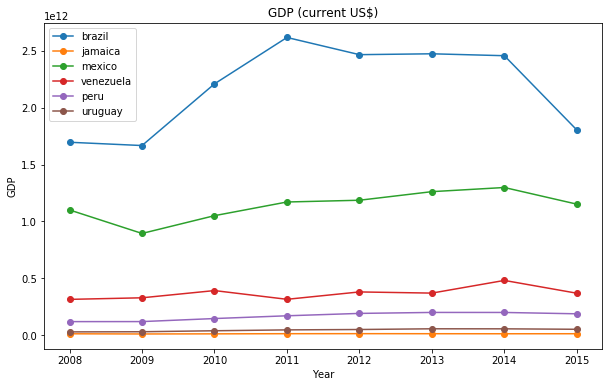

In [465]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'GDP (current US$)'
ylabel = 'GDP'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Brazil's GDP has increased significantly

### South American countries w.r.t GDP growth

In [466]:
brazil = economy.loc[['Brazil'], ['GDP growth (annual %)']]; brazil['Year'] = year
jamaica = economy.loc[['Jamaica'], ['GDP growth (annual %)']]; jamaica['Year'] = year
mexico = economy.loc[['Mexico'], ['GDP growth (annual %)']]; mexico['Year'] = year
venezuela = economy.loc[['Venezuela, RB'], ['GDP growth (annual %)']]; venezuela['Year'] = year
peru = economy.loc[['Peru'], ['GDP growth (annual %)']]; peru['Year'] = year
uruguay = economy.loc[['Uruguay'], ['GDP growth (annual %)']]; uruguay['Year'] = year

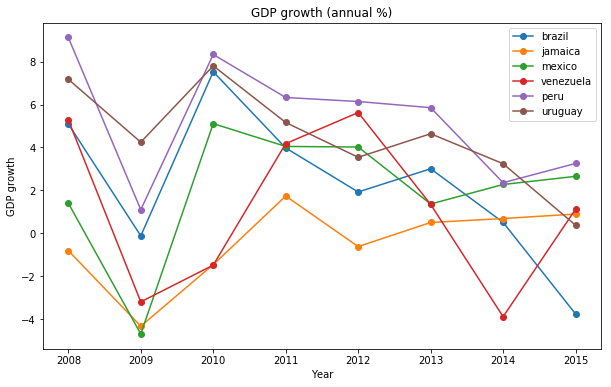

In [467]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'GDP growth (annual %)'
ylabel = 'GDP growth'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Dip in 2009 and increased in 2010 and then decreasing from there again

### Selected countries w.r.t GDP

In [468]:
india = economy.loc[['India'], ['GDP (current US$)']]; india['Year'] = year
china = economy.loc[['China'], ['GDP (current US$)']]; china['Year'] = year
japan = economy.loc[['Japan'], ['GDP (current US$)']]; japan['Year'] = year
united_kingdom = economy.loc[['United Kingdom'], ['GDP (current US$)']]; united_kingdom['Year'] = year
russian_federation = economy.loc[['Russian Federation'], ['GDP (current US$)']]; russian_federation['Year'] = year
united_states = economy.loc[['United States'], ['GDP (current US$)']]; united_states['Year'] = year
germany = economy.loc[['Germany'], ['GDP (current US$)']]; germany['Year'] = year
france = economy.loc[['France'], ['GDP (current US$)']]; france['Year'] = year
israel = economy.loc[['Israel'], ['GDP (current US$)']]; israel['Year'] = year
saudi_arabia = economy.loc[['Saudi Arabia'], ['GDP (current US$)']]; saudi_arabia['Year'] = year
uae = economy.loc[['United Arab Emirates'], ['GDP (current US$)']]; uae['Year'] = year
canada = economy.loc[['Canada'], ['GDP (current US$)']]; canada['Year'] = year


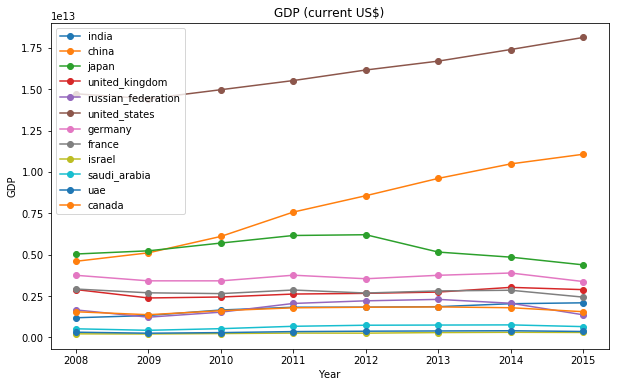

In [469]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'GDP (current US$)'
ylabel = 'GDP'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### United States is way ahead in GDP followed by China

### Selected countries w.r.t GDP growth

In [470]:
india = economy.loc[['India'], ['GDP growth (annual %)']]; india['Year'] = year
china = economy.loc[['China'], ['GDP growth (annual %)']]; china['Year'] = year
japan = economy.loc[['Japan'], ['GDP growth (annual %)']]; japan['Year'] = year
united_kingdom = economy.loc[['United Kingdom'], ['GDP growth (annual %)']]; united_kingdom['Year'] = year
russian_federation = economy.loc[['Russian Federation'], ['GDP growth (annual %)']]; russian_federation['Year'] = year
united_states = economy.loc[['United States'], ['GDP growth (annual %)']]; united_states['Year'] = year
germany = economy.loc[['Germany'], ['GDP growth (annual %)']]; germany['Year'] = year
france = economy.loc[['France'], ['GDP growth (annual %)']]; france['Year'] = year
israel = economy.loc[['Israel'], ['GDP growth (annual %)']]; israel['Year'] = year
saudi_arabia = economy.loc[['Saudi Arabia'], ['GDP growth (annual %)']]; saudi_arabia['Year'] = year
uae = economy.loc[['United Arab Emirates'], ['GDP growth (annual %)']]; uae['Year'] = year
canada = economy.loc[['Canada'], ['GDP growth (annual %)']]; canada['Year'] = year

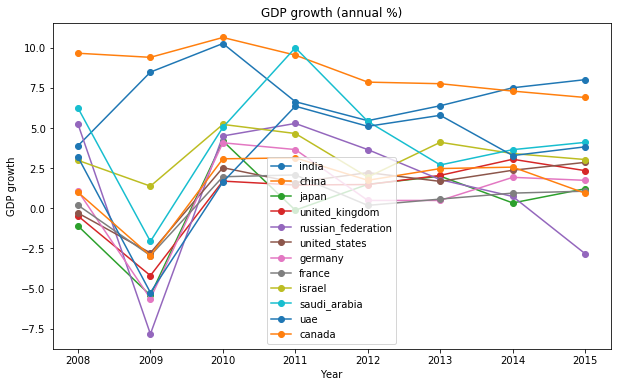

In [471]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'GDP growth (annual %)'
ylabel = 'GDP growth'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Now we will explore basic services

In [472]:
basic_services = cd[['People using basic sanitation services (% of population)', 'Access to electricity (% of population)', 'People using basic drinking water services (% of population)']]

### Histogram of Access to electricity

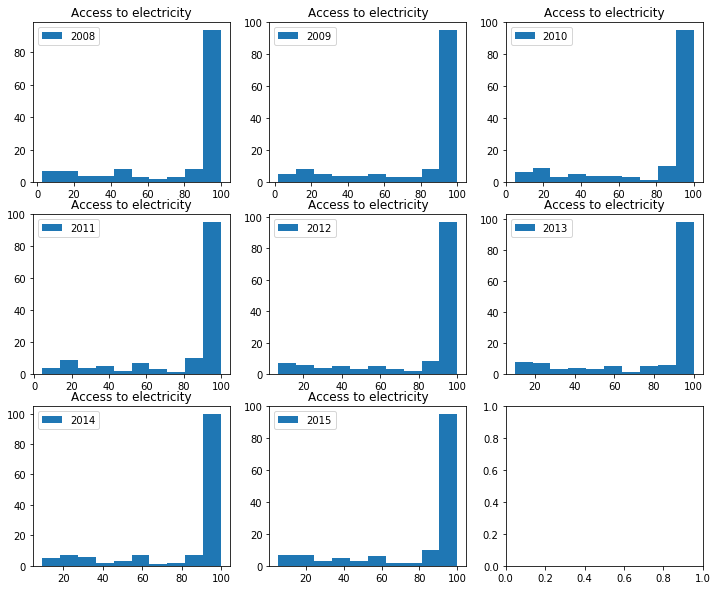

In [473]:
feature ='Access to electricity (% of population)'
title = 'Access to electricity'

TR = histogram_demography(years, feature, year, title)

### Histogram of people using basic drinking water services

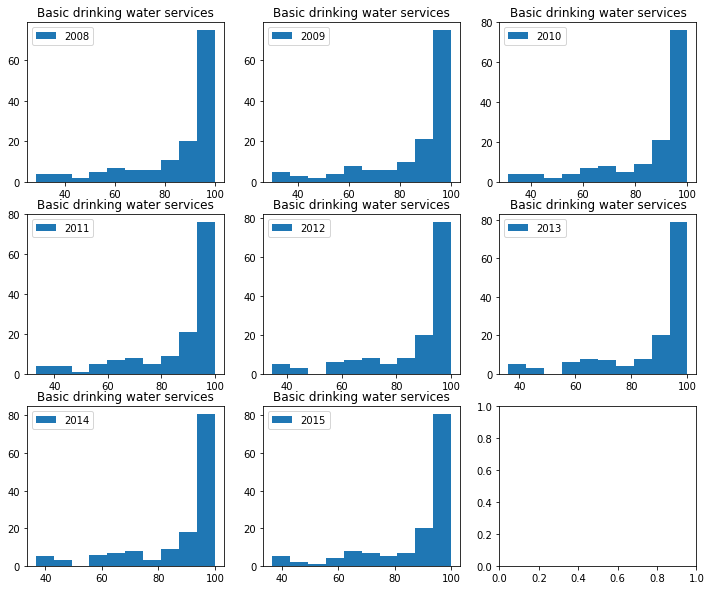

In [474]:
feature ='People using basic drinking water services (% of population)'
title = 'Basic drinking water services'

TR = histogram_demography(years, feature, year, title)

### Barplot of Access to electricity and Basic drinking water services

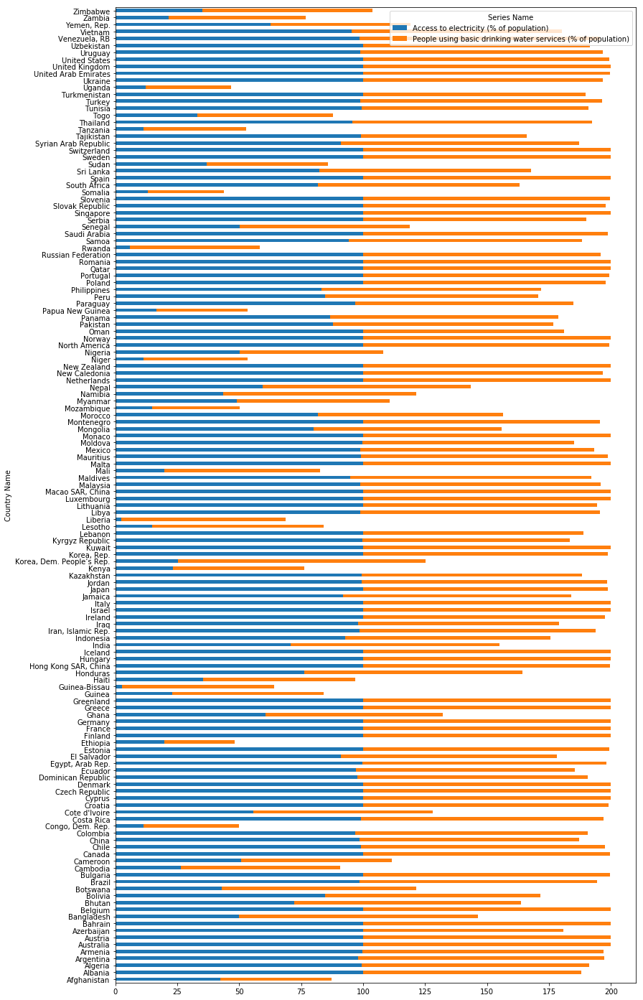

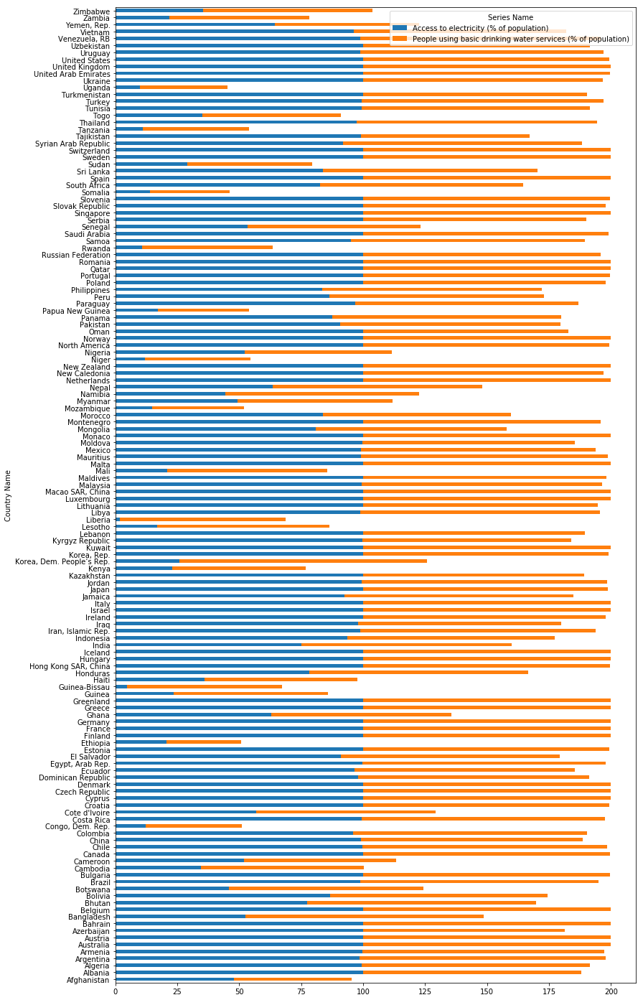

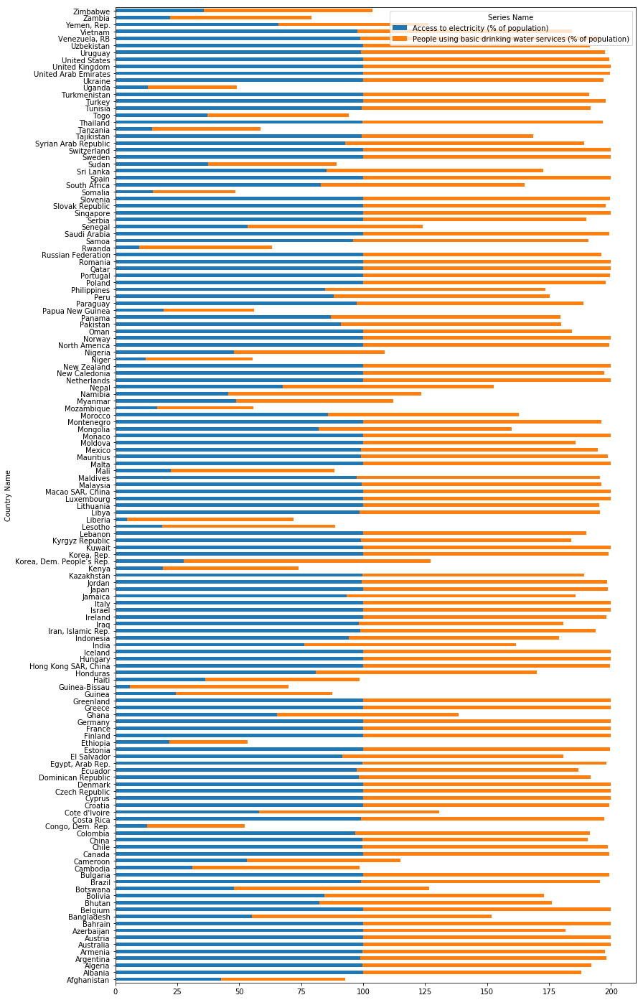

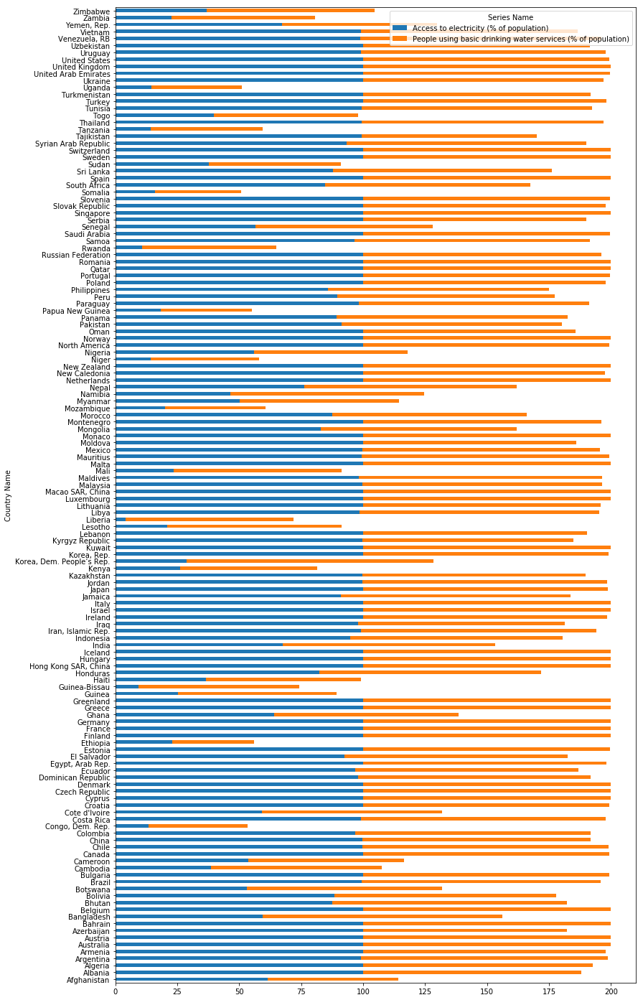

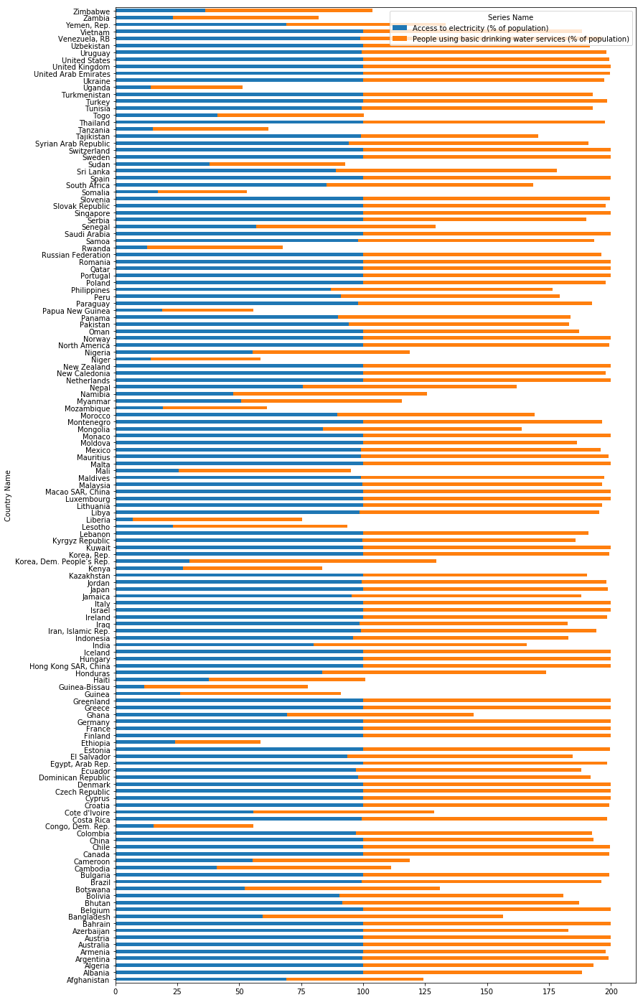

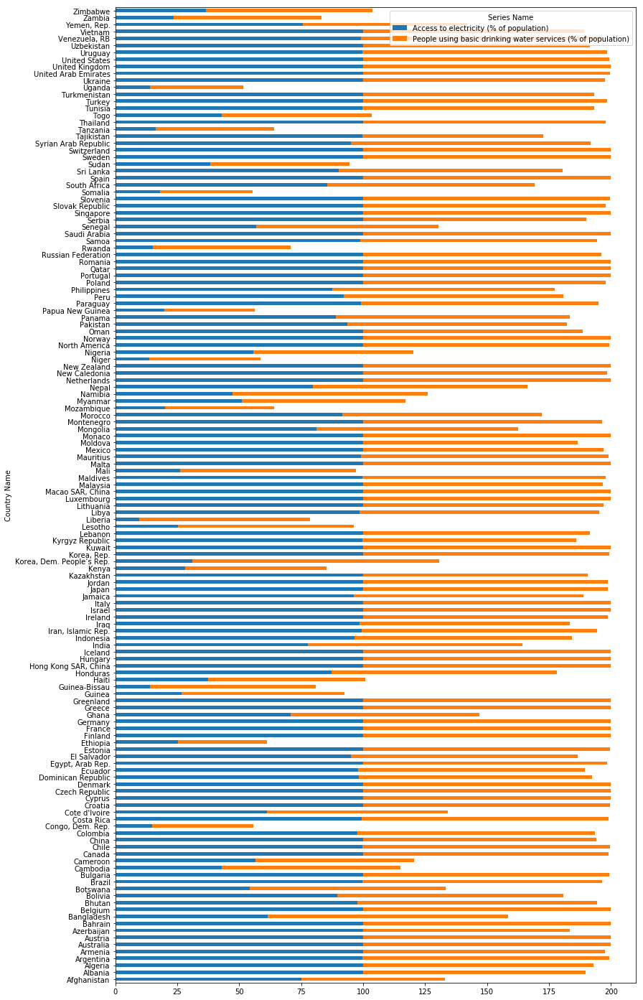

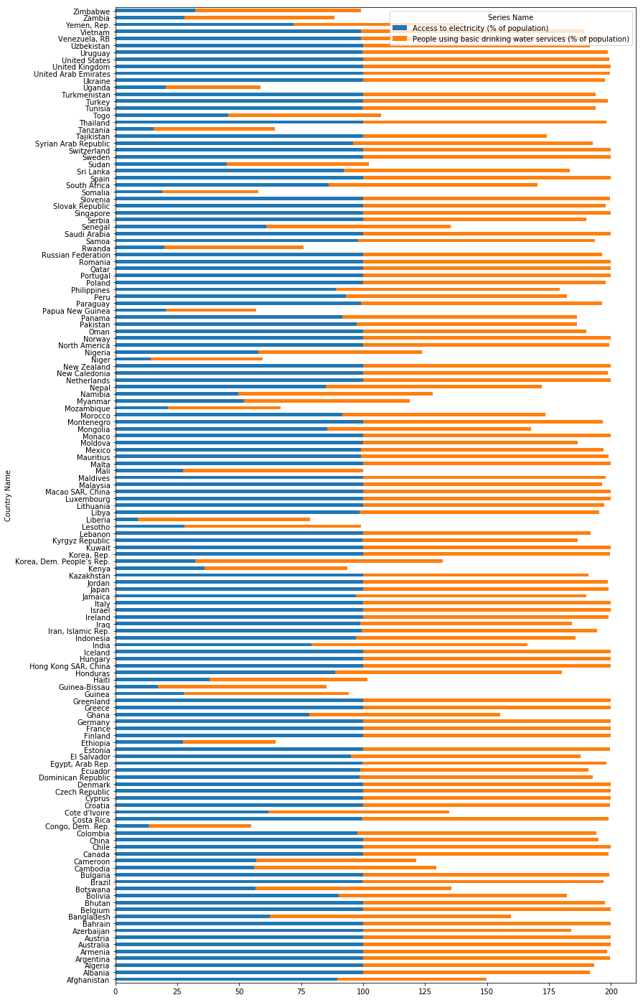

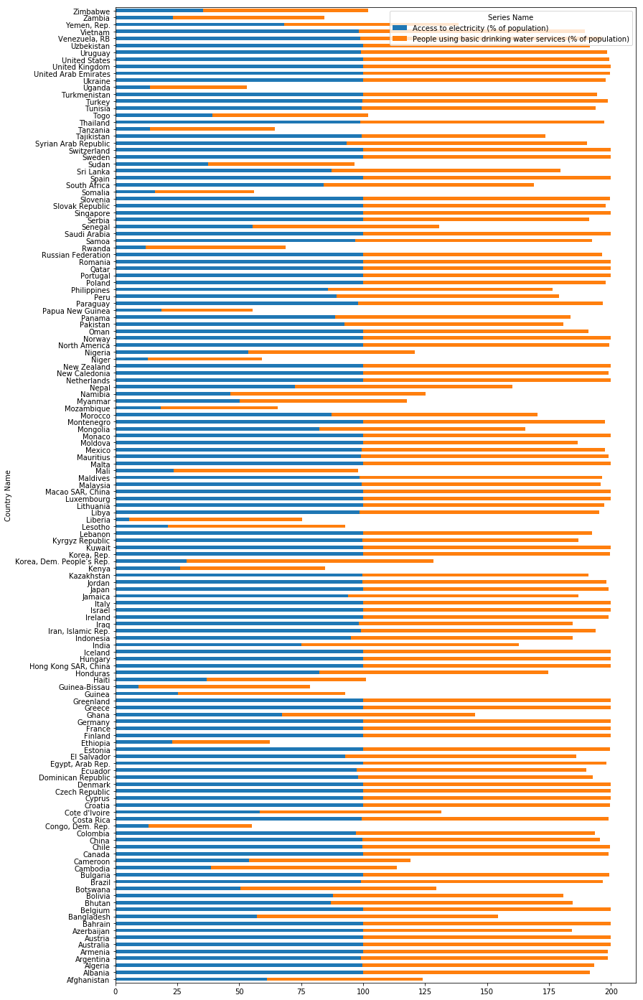

In [119]:
cleaned_data_2008[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['Access to electricity (% of population)', 'People using basic drinking water services (% of population)']].plot.barh(stacked = True, figsize = (13, 25))

### Asian countries w.r.t Access to electricity

In [475]:
india = basic_services.loc[['India'], ['Access to electricity (% of population)']]; india['Year'] = year
china = basic_services.loc[['China'], ['Access to electricity (% of population)']]; china['Year'] = year
japan = basic_services.loc[['Japan'], ['Access to electricity (% of population)']]; japan['Year'] = year
bangladesh = basic_services.loc[['Bangladesh'], ['Access to electricity (% of population)']]; bangladesh['Year'] = year
afghanistan = basic_services.loc[['Afghanistan'], ['Access to electricity (% of population)']]; afghanistan['Year'] = year

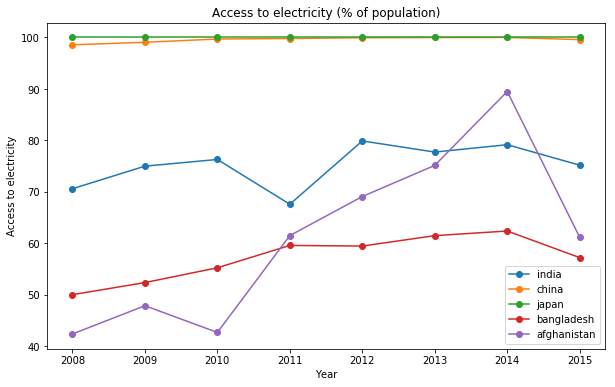

In [476]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Access to electricity (% of population)'
ylabel = 'Access to electricity'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Japan and China's almost 100% population has access to electricity
#### Afghanistan is increasing significantly

### Asian countries w.r.t Basic drinking water services

In [477]:
india = basic_services.loc[['India'], ['People using basic drinking water services (% of population)']]; india['Year'] = year
china = basic_services.loc[['China'], ['People using basic drinking water services (% of population)']]; china['Year'] = year
japan = basic_services.loc[['Japan'], ['People using basic drinking water services (% of population)']]; japan['Year'] = year
bangladesh = basic_services.loc[['Bangladesh'], ['People using basic drinking water services (% of population)']]; bangladesh['Year'] = year
afghanistan = basic_services.loc[['Afghanistan'], ['People using basic drinking water services (% of population)']]; afghanistan['Year'] = year

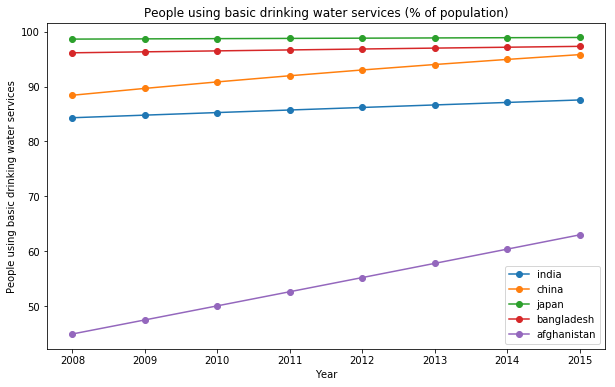

In [478]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'People using basic drinking water services (% of population)'
ylabel = 'People using basic drinking water services'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Afghanistan has problem of drinking water services but situation is getting good every year

### North American countries w.r.t Access to electricity

In [479]:
canada = basic_services.loc[['Canada'], ['Access to electricity (% of population)']]; canada['Year'] = year
north_america = basic_services.loc[['North America'], ['Access to electricity (% of population)']]; north_america['Year'] = year
united_states = basic_services.loc[['United States'], ['Access to electricity (% of population)']]; united_states['Year'] = year

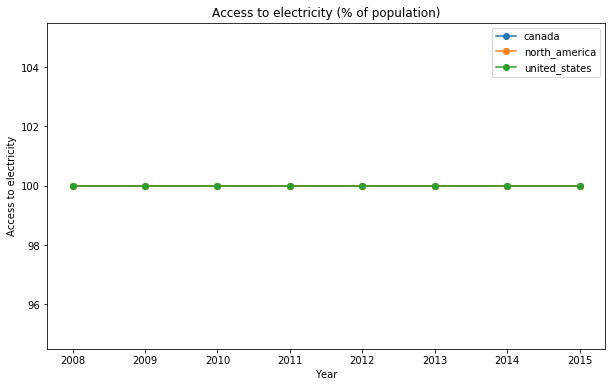

In [480]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Access to electricity (% of population)'
ylabel = 'Access to electricity'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### All the above countries has 100 % population has access to electricity

### North American countries w.r.t Basic drinking services

In [481]:
canada = basic_services.loc[['Canada'], ['People using basic drinking water services (% of population)']]; canada['Year'] = year
north_america = basic_services.loc[['North America'], ['People using basic drinking water services (% of population)']]; north_america['Year'] = year
united_states = basic_services.loc[['United States'], ['People using basic drinking water services (% of population)']]; united_states['Year'] = year

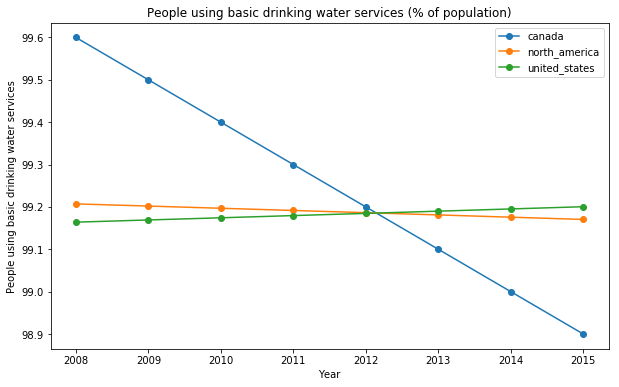

In [482]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'People using basic drinking water services (% of population)'
ylabel = 'People using basic drinking water services'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Canada's drinking water services has decreased over the year

### European countries w.r.t Access to electricity

In [483]:
united_kingdom = basic_services.loc[['United Kingdom'], ['Access to electricity (% of population)']]; united_kingdom['Year'] = year
france = basic_services.loc[['France'], ['Access to electricity (% of population)']]; france['Year'] = year
germany = basic_services.loc[['Germany'], ['Access to electricity (% of population)']]; germany['Year'] = year
russian_federation = basic_services.loc[['Russian Federation'], ['Access to electricity (% of population)']]; russian_federation['Year'] = year
greece = basic_services.loc[['Greece'], ['Access to electricity (% of population)']]; greece['Year'] = year


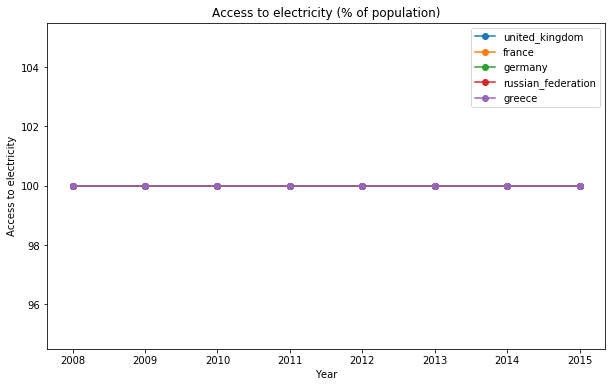

In [484]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Access to electricity (% of population)'
ylabel = 'Access to electricity'
european = plot_features(european_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### All the above countries 100 % population has acce to electricity

In [485]:
united_kingdom = basic_services.loc[['United Kingdom'], ['People using basic drinking water services (% of population)']]; united_kingdom['Year'] = year
france = basic_services.loc[['France'], ['People using basic drinking water services (% of population)']]; france['Year'] = year
germany = basic_services.loc[['Germany'], ['People using basic drinking water services (% of population)']]; germany['Year'] = year
russian_federation = basic_services.loc[['Russian Federation'], ['People using basic drinking water services (% of population)']]; russian_federation['Year'] = year
greece = basic_services.loc[['Greece'], ['People using basic drinking water services (% of population)']]; greece['Year'] = year

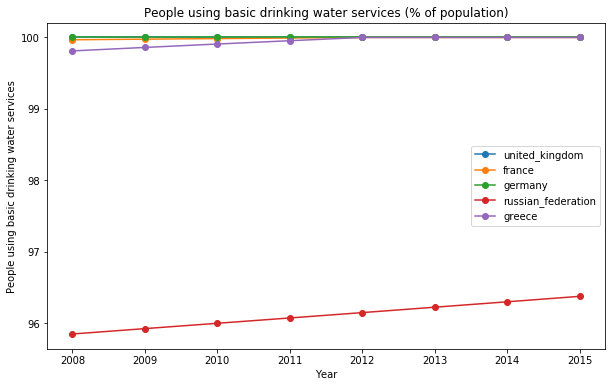

In [486]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'People using basic drinking water services (% of population)'
ylabel = 'People using basic drinking water services'
european = plot_features(european_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Russian Federation drinking is increasing  

### Arab countries w.r.t Access to electricity

In [487]:
egypt = basic_services.loc[['Egypt, Arab Rep.'], ['Access to electricity (% of population)']]; egypt['Year'] = year
iraq = basic_services.loc[['Iraq'], ['Access to electricity (% of population)']]; iraq['Year'] = year
saudi_arabia = basic_services.loc[['Saudi Arabia'], ['Access to electricity (% of population)']]; saudi_arabia['Year'] = year
somalia = basic_services.loc[['Somalia'], ['Access to electricity (% of population)']]; somalia['Year'] = year
sudan = basic_services.loc[['Sudan'], ['Access to electricity (% of population)']]; sudan['Year'] = year
uae = basic_services.loc[['United Arab Emirates'], ['Access to electricity (% of population)']]; uae['Year'] = year

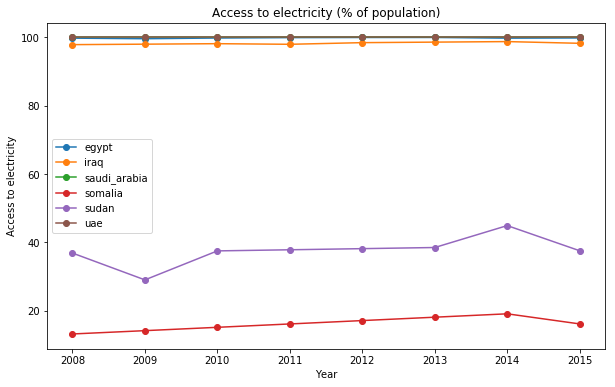

In [488]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Access to electricity (% of population)'
ylabel = 'Access to electricity'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Sudan and Somalia are way behind other Arab countries in terms of electricity

### Arab countries w.r.t basic drinking services

In [489]:
egypt = basic_services.loc[['Egypt, Arab Rep.'], ['People using basic drinking water services (% of population)']]; egypt['Year'] = year
iraq = basic_services.loc[['Iraq'], ['People using basic drinking water services (% of population)']]; iraq['Year'] = year
saudi_arabia = basic_services.loc[['Saudi Arabia'], ['People using basic drinking water services (% of population)']]; saudi_arabia['Year'] = year
somalia = basic_services.loc[['Somalia'], ['People using basic drinking water services (% of population)']]; somalia['Year'] = year
sudan = basic_services.loc[['Sudan'], ['People using basic drinking water services (% of population)']]; sudan['Year'] = year
uae = basic_services.loc[['United Arab Emirates'], ['People using basic drinking water services (% of population)']]; uae['Year'] = year

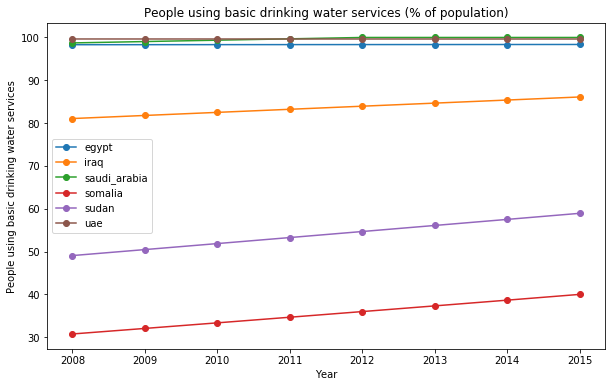

In [490]:
arab_countries = [egypt, iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'People using basic drinking water services (% of population)'
ylabel = 'People using basic drinking water services'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Somalia, Sudan and Iraq's drinking water services in increasing over the years

### South American countries w.r.t Access to electricity

In [491]:
brazil = basic_services.loc[['Brazil'], ['Access to electricity (% of population)']]; brazil['Year'] = year
jamaica = basic_services.loc[['Jamaica'], ['Access to electricity (% of population)']]; jamaica['Year'] = year
mexico = basic_services.loc[['Mexico'], ['Access to electricity (% of population)']]; mexico['Year'] = year
venezuela = basic_services.loc[['Venezuela, RB'], ['Access to electricity (% of population)']]; venezuela['Year'] = year
peru = basic_services.loc[['Peru'], ['Access to electricity (% of population)']]; peru['Year'] = year
uruguay = basic_services.loc[['Uruguay'], ['Access to electricity (% of population)']]; uruguay['Year'] = year

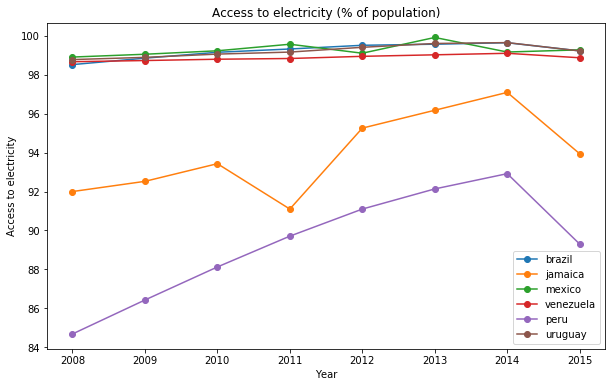

In [492]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Access to electricity (% of population)'
ylabel = 'Access to electricity'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Peru and Jamaica are doing good in terms of electricity

### South American countries w.r.t basic drinking water services

In [493]:
brazil = basic_services.loc[['Brazil'], ['People using basic drinking water services (% of population)']]; brazil['Year'] = year
jamaica = basic_services.loc[['Jamaica'], ['People using basic drinking water services (% of population)']]; jamaica['Year'] = year
mexico = basic_services.loc[['Mexico'], ['People using basic drinking water services (% of population)']]; mexico['Year'] = year
venezuela = basic_services.loc[['Venezuela, RB'], ['People using basic drinking water services (% of population)']]; venezuela['Year'] = year
peru = basic_services.loc[['Peru'], ['People using basic drinking water services (% of population)']]; peru['Year'] = year
uruguay = basic_services.loc[['Uruguay'], ['People using basic drinking water services (% of population)']]; uruguay['Year'] = year

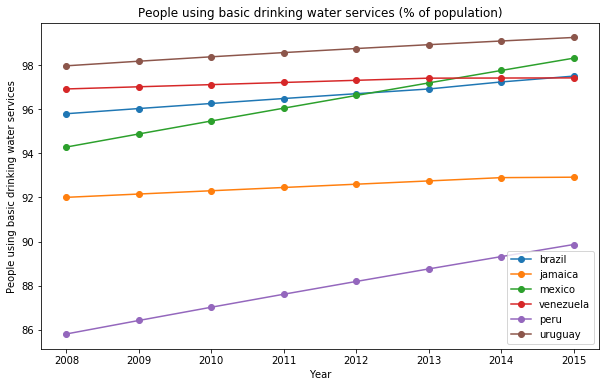

In [494]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'People using basic drinking water services (% of population)'
ylabel = 'People using basic drinking water services'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Selected countries w.r.t Access to electricity

In [495]:
india = basic_services.loc[['India'], ['Access to electricity (% of population)']]; india['Year'] = year
china = basic_services.loc[['China'], ['Access to electricity (% of population)']]; china['Year'] = year
japan = basic_services.loc[['Japan'], ['Access to electricity (% of population)']]; japan['Year'] = year
united_kingdom = basic_services.loc[['United Kingdom'], ['Access to electricity (% of population)']]; united_kingdom['Year'] = year
russian_federation = basic_services.loc[['Russian Federation'], ['Access to electricity (% of population)']]; russian_federation['Year'] = year
united_states = basic_services.loc[['United States'], ['Access to electricity (% of population)']]; united_states['Year'] = year
germany = basic_services.loc[['Germany'], ['Access to electricity (% of population)']]; germany['Year'] = year
france = basic_services.loc[['France'], ['Access to electricity (% of population)']]; france['Year'] = year
israel = basic_services.loc[['Israel'], ['Access to electricity (% of population)']]; israel['Year'] = year
saudi_arabia = basic_services.loc[['Saudi Arabia'], ['Access to electricity (% of population)']]; saudi_arabia['Year'] = year
uae = basic_services.loc[['United Arab Emirates'], ['Access to electricity (% of population)']]; uae['Year'] = year
canada = basic_services.loc[['Canada'], ['Access to electricity (% of population)']]; canada['Year'] = year


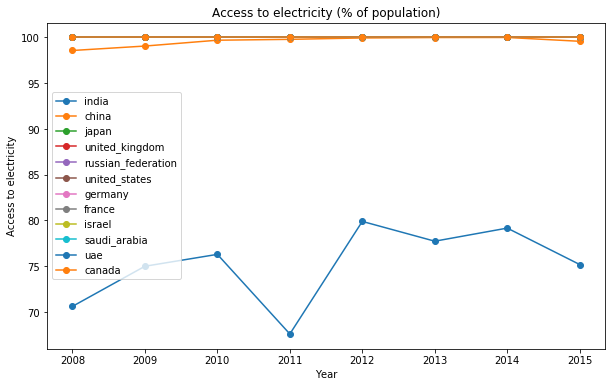

In [496]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Access to electricity (% of population)'
ylabel = 'Access to electricity'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### India has lot of sope improvement in electricity department

### Selected countries w.r.t basic drinking services

In [497]:
india = basic_services.loc[['India'], ['People using basic drinking water services (% of population)']]; india['Year'] = year
china = basic_services.loc[['China'], ['People using basic drinking water services (% of population)']]; china['Year'] = year
japan = basic_services.loc[['Japan'], ['People using basic drinking water services (% of population)']]; japan['Year'] = year
united_kingdom = basic_services.loc[['United Kingdom'], ['People using basic drinking water services (% of population)']]; united_kingdom['Year'] = year
russian_federation = basic_services.loc[['Russian Federation'], ['People using basic drinking water services (% of population)']]; russian_federation['Year'] = year
united_states = basic_services.loc[['United States'], ['People using basic drinking water services (% of population)']]; united_states['Year'] = year
germany = basic_services.loc[['Germany'], ['People using basic drinking water services (% of population)']]; germany['Year'] = year
france = basic_services.loc[['France'], ['People using basic drinking water services (% of population)']]; france['Year'] = year
israel = basic_services.loc[['Israel'], ['People using basic drinking water services (% of population)']]; israel['Year'] = year
saudi_arabia = basic_services.loc[['Saudi Arabia'], ['People using basic drinking water services (% of population)']]; saudi_arabia['Year'] = year
uae = basic_services.loc[['United Arab Emirates'], ['People using basic drinking water services (% of population)']]; uae['Year'] = year
canada = basic_services.loc[['Canada'], ['People using basic drinking water services (% of population)']]; canada['Year'] = year

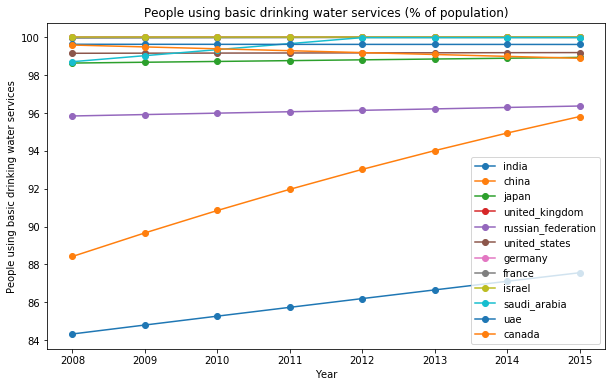

In [498]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'People using basic drinking water services (% of population)'
ylabel = 'People using basic drinking water services'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### India can improve in water services department also

### Now we will explore some miscellaneous indicators

In [499]:
miscellaneous = cd[['Health expenditure, total (% of GDP)', 'Compulsory education, duration (years)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']]


### Histogram of Health Expenditure

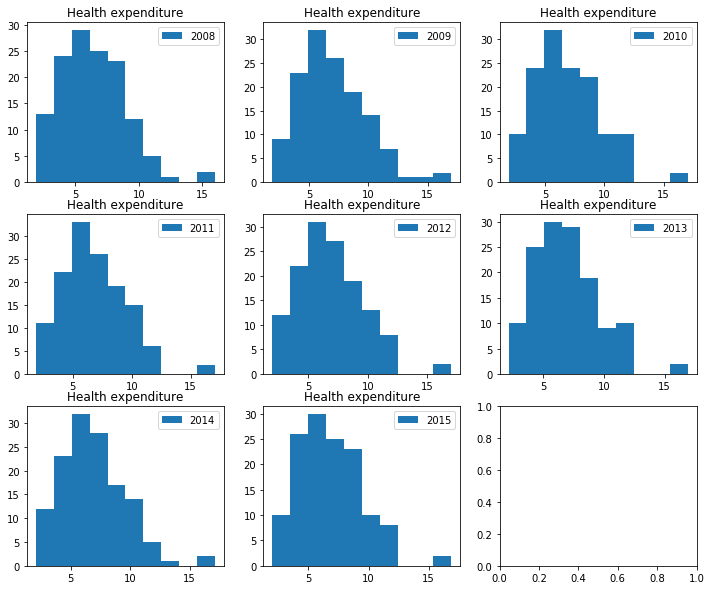

In [500]:
feature = 'Health expenditure, total (% of GDP)'
title = 'Health expenditure'

TR = histogram_demography(years, feature, year, title)

### Histogram of Compulsory education

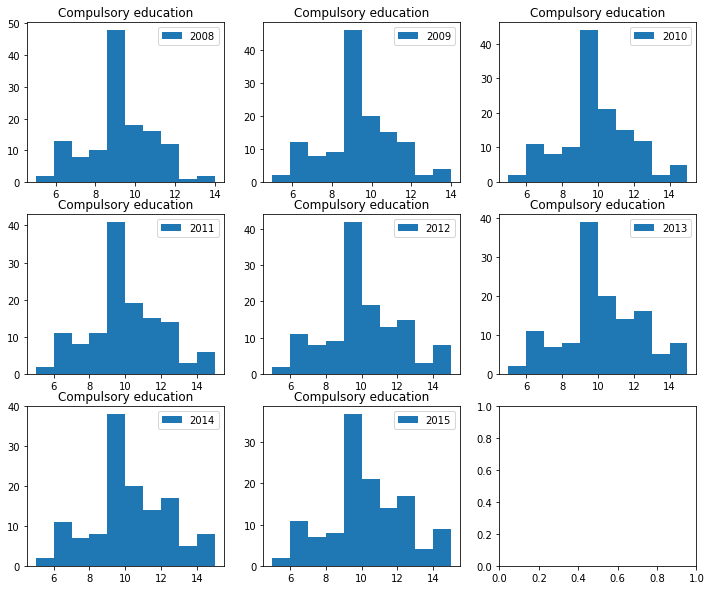

In [501]:
feature = 'Compulsory education, duration (years)'
title = 'Compulsory education'

TR = histogram_demography(years, feature, year, title)

### Histogram of Unemployment

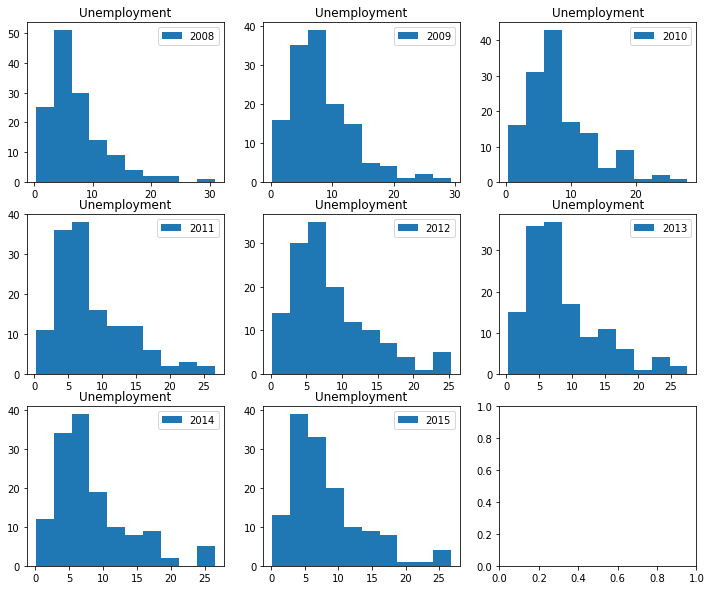

In [502]:
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
title = 'Unemployment'

TR = histogram_demography(years, feature, year, title)

### Barplot of Health expenditure and Unemployment

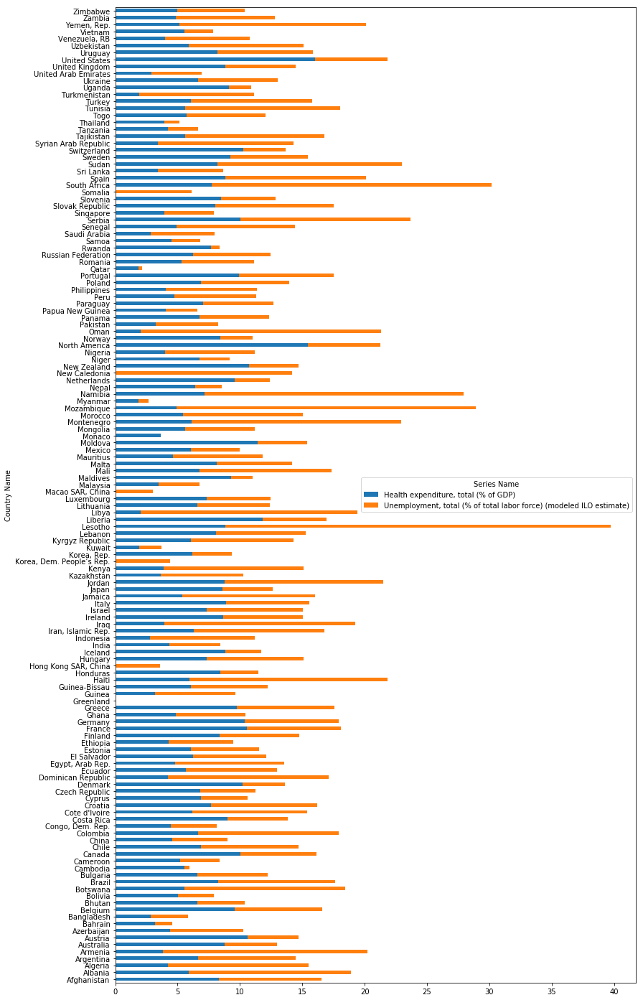

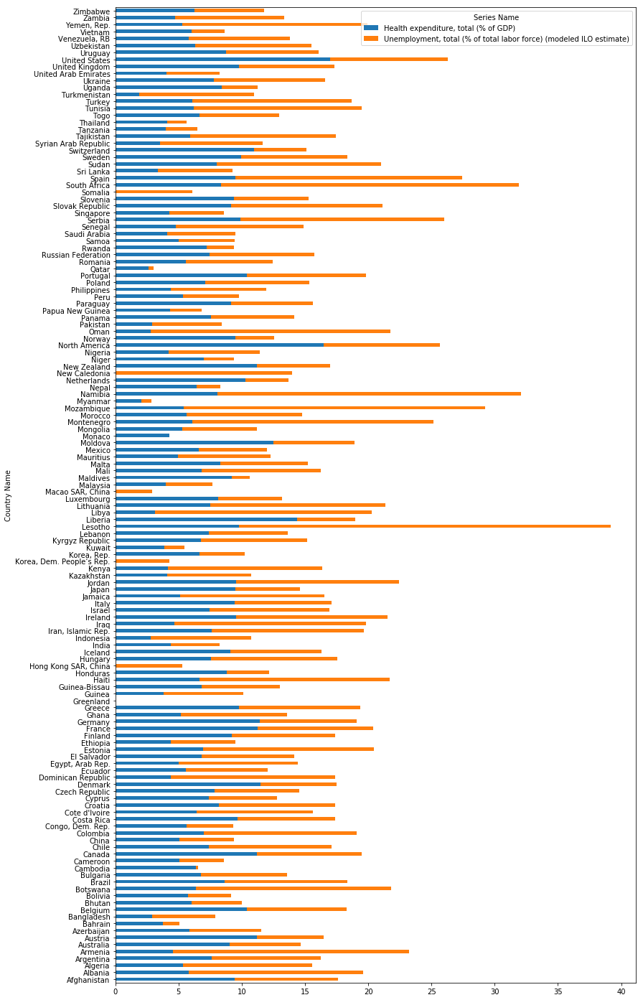

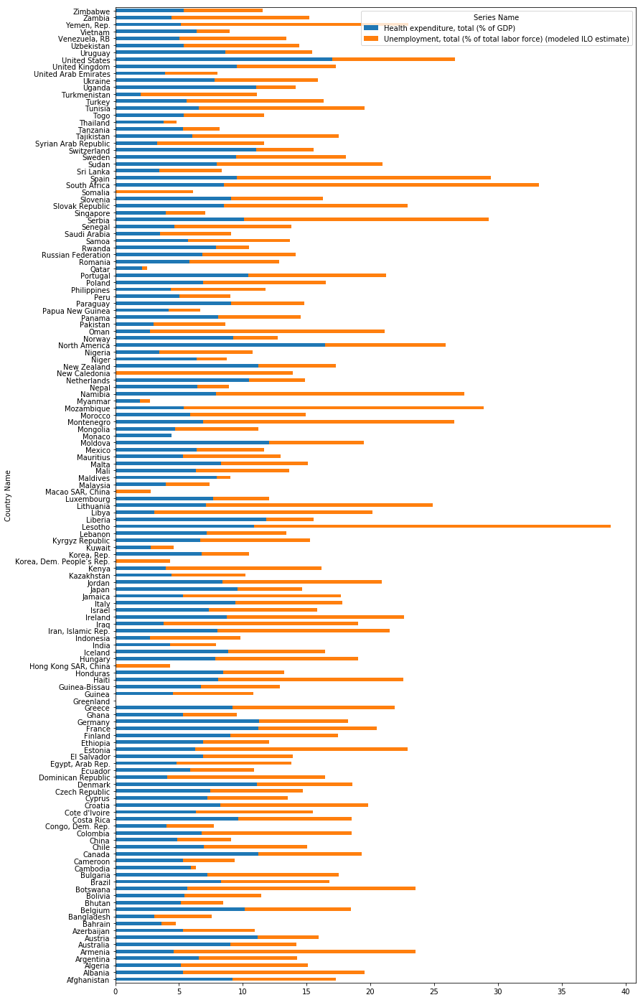

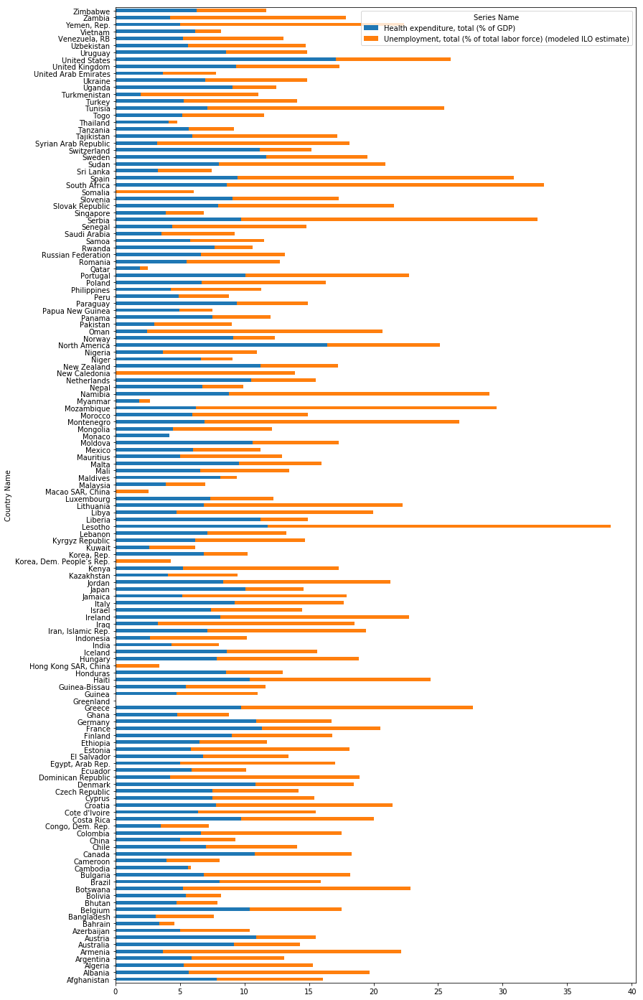

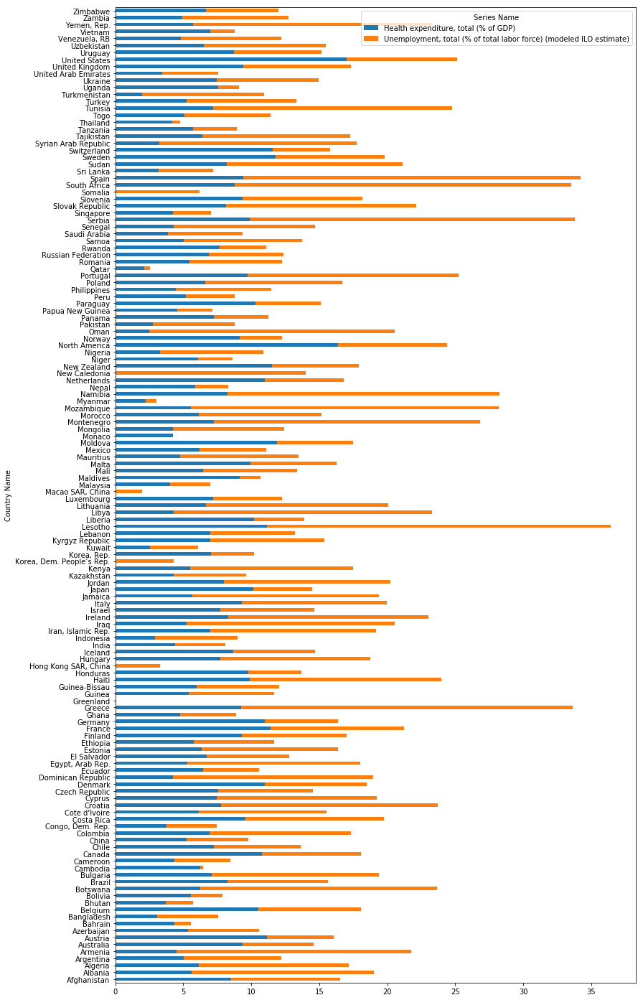

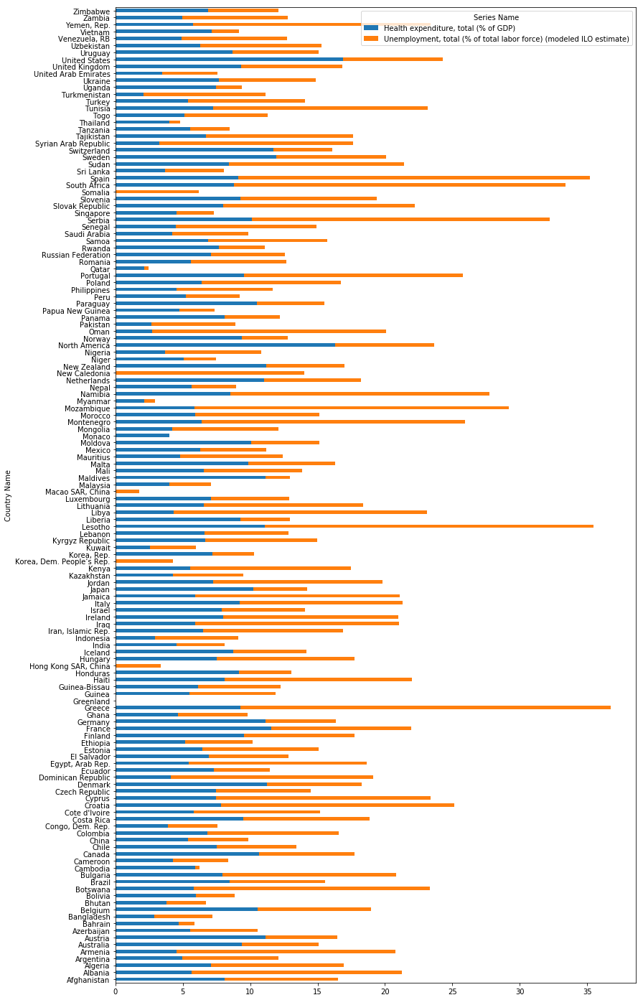

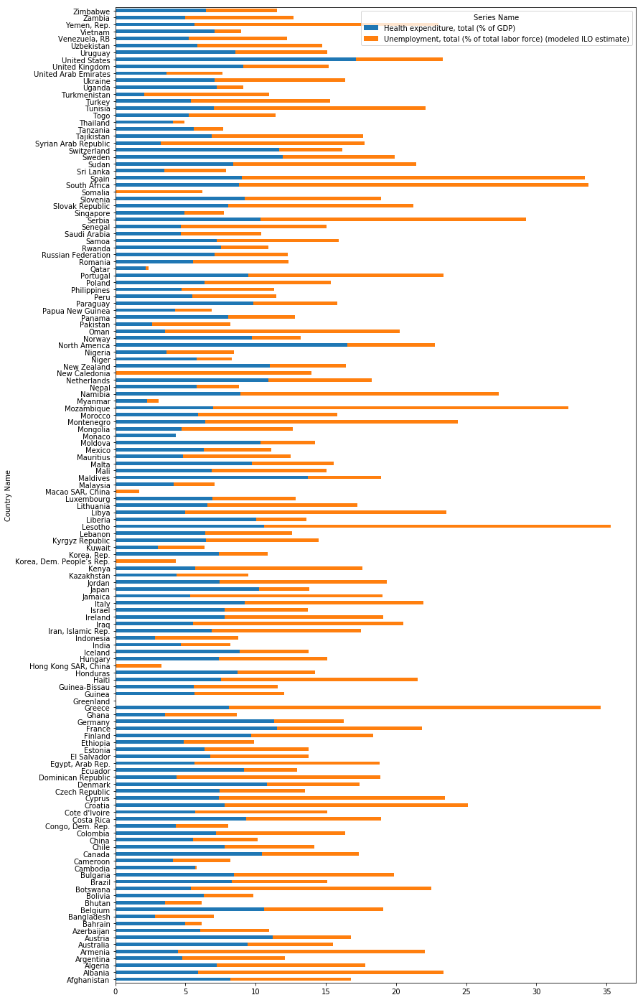

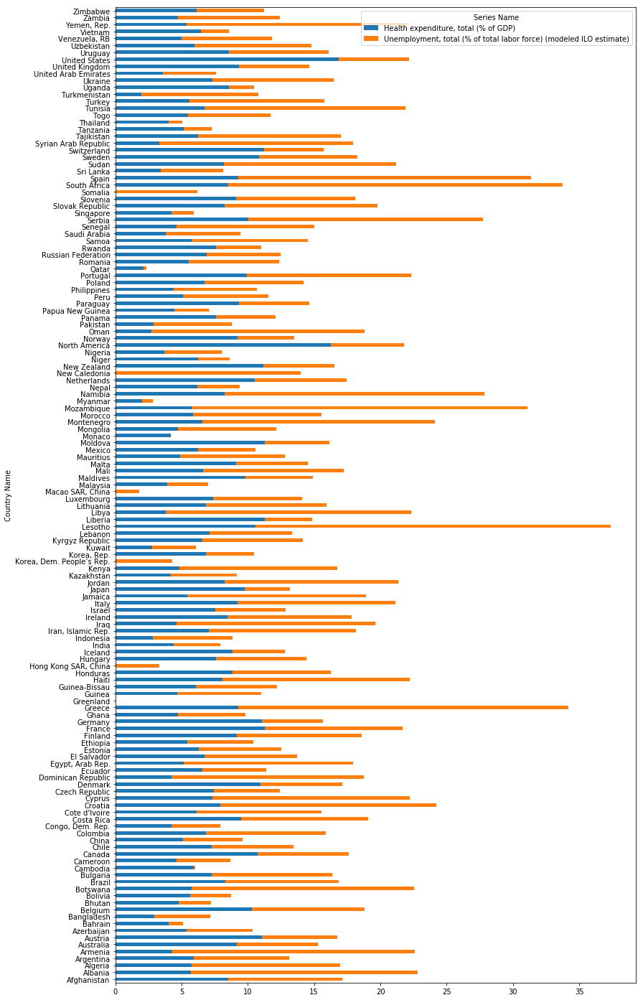

In [136]:
cleaned_data_2008[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['Health expenditure, total (% of GDP)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)']].plot.barh(stacked = True, figsize = (13, 25))


### Barplot of Compulsory education

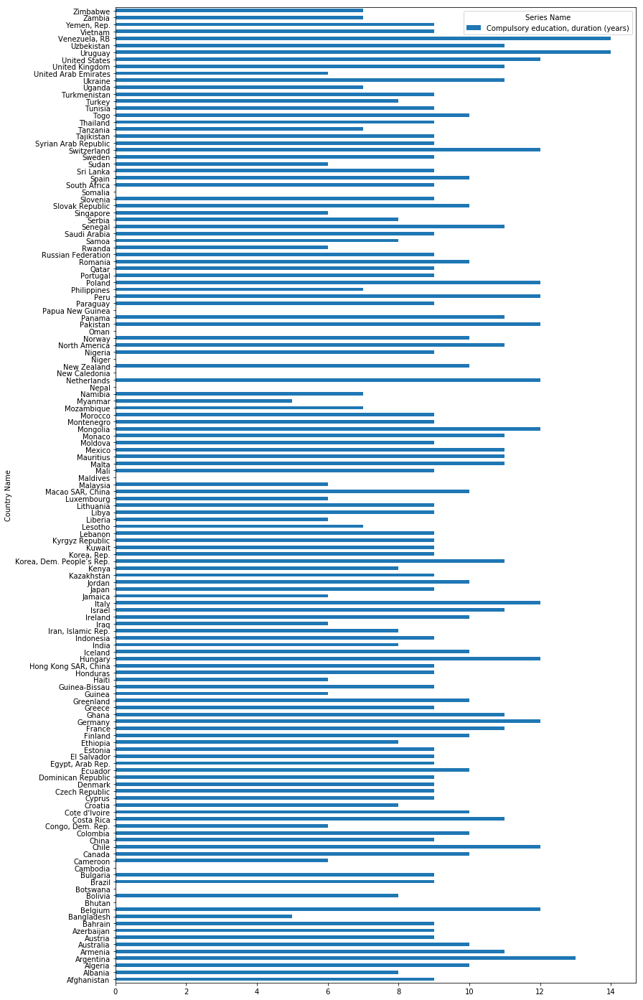

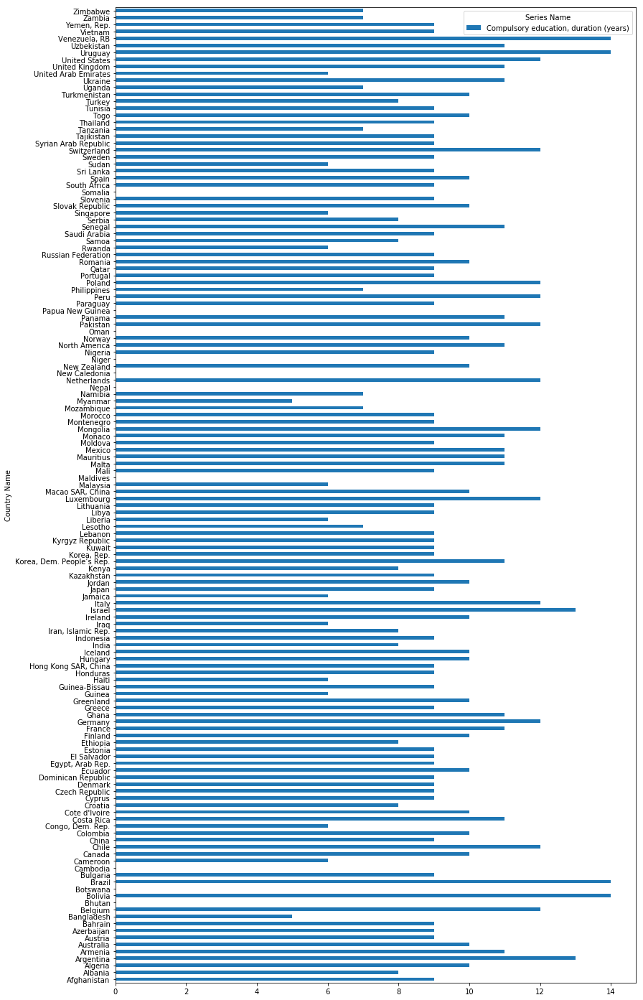

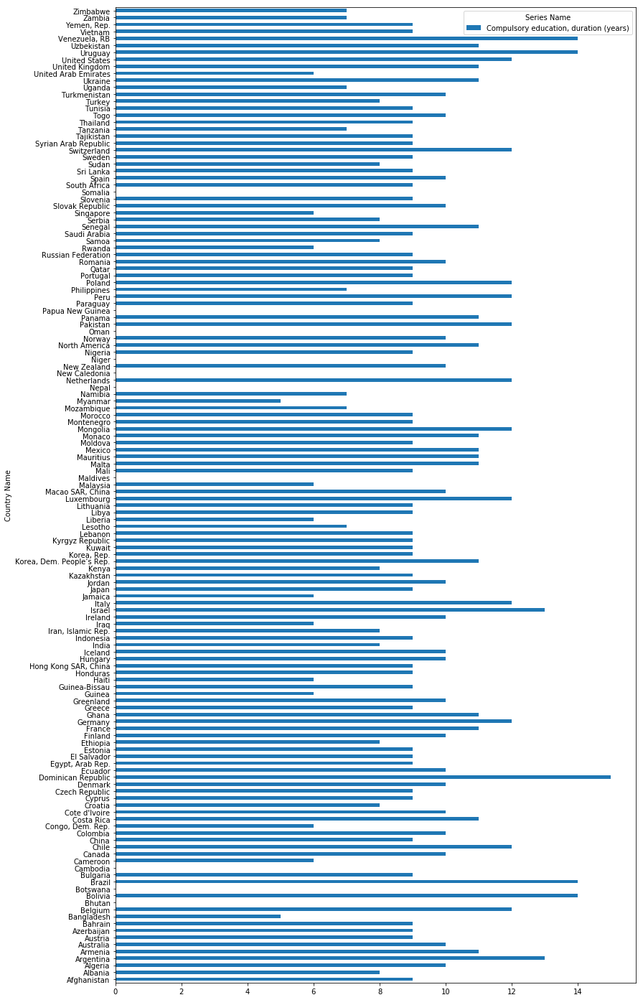

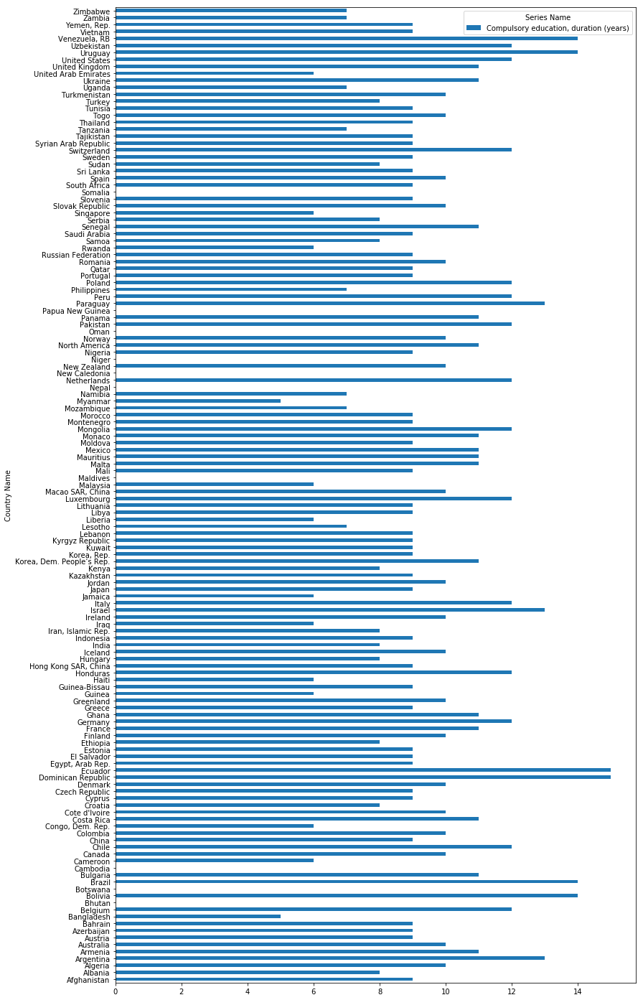

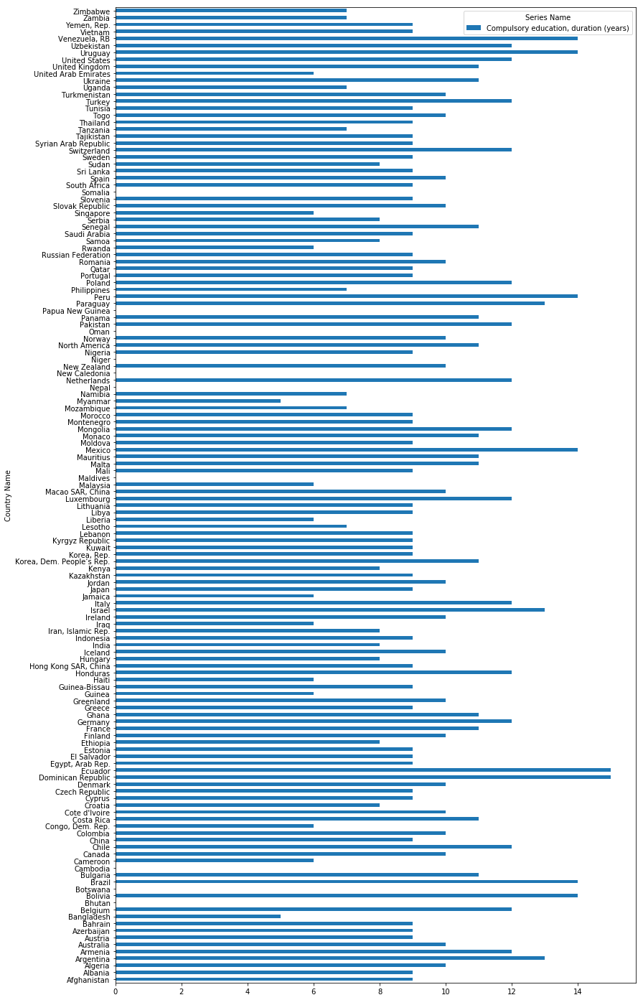

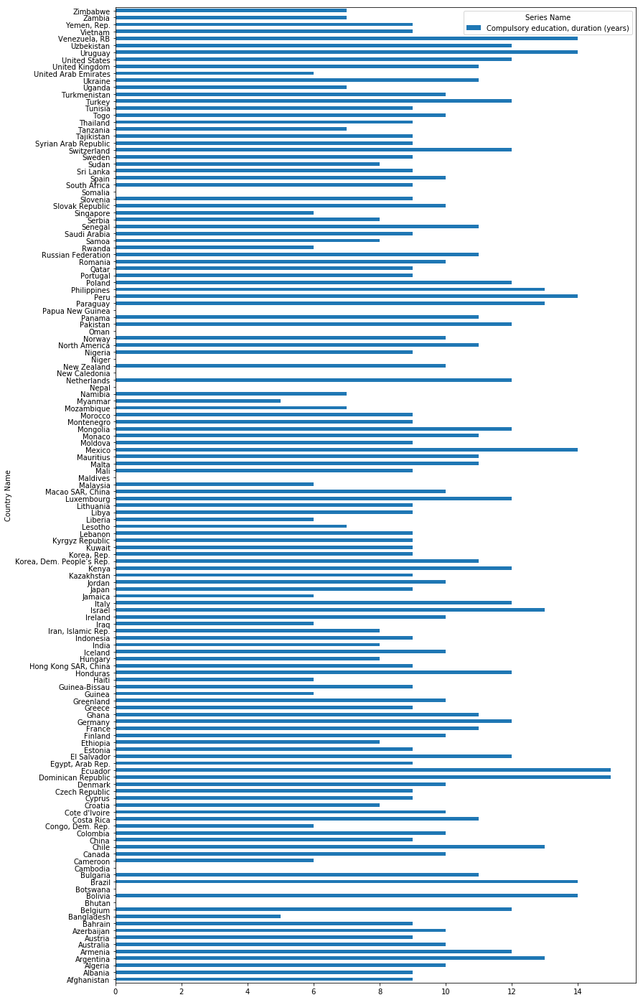

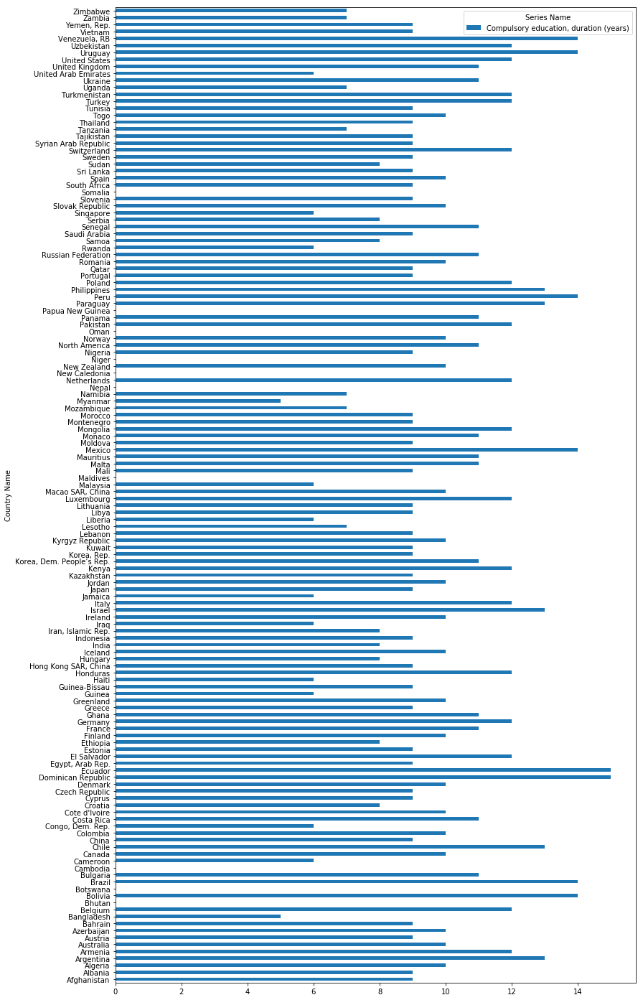

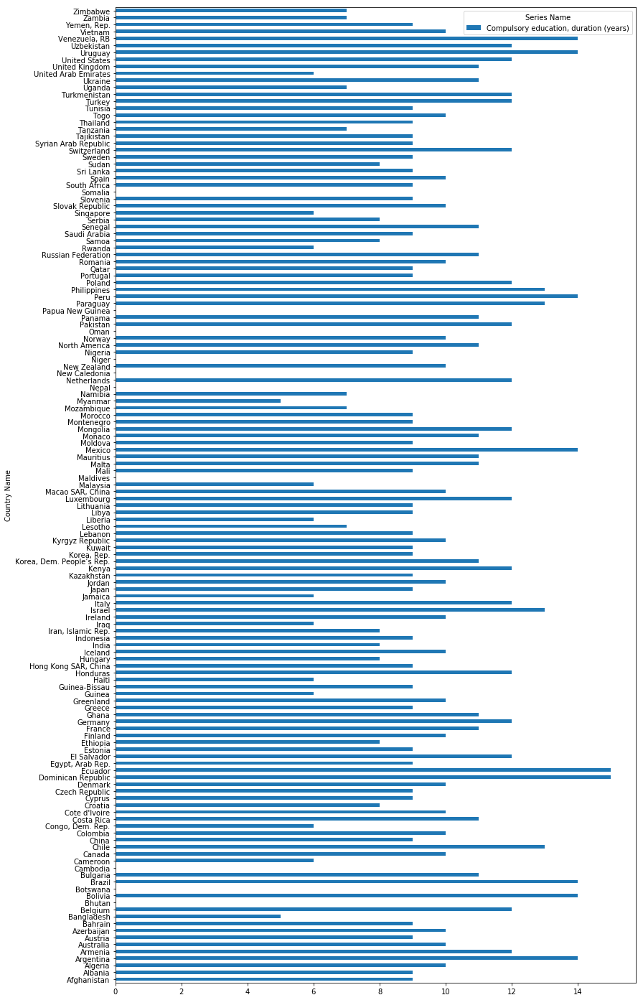

In [137]:
cleaned_data_2008[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2009[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2010[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2011[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2012[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2013[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2014[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))
cleaned_data_2015[['Compulsory education, duration (years)']].plot.barh(stacked = True, figsize = (13, 25))


### Asian countries w..r.t Compulsory education

In [503]:
india = miscellaneous.loc[['India'], ['Compulsory education, duration (years)']]; india['Year'] = year
china = miscellaneous.loc[['China'], ['Compulsory education, duration (years)']]; china['Year'] = year
japan = miscellaneous.loc[['Japan'], ['Compulsory education, duration (years)']]; japan['Year'] = year
bangladesh = miscellaneous.loc[['Bangladesh'], ['Compulsory education, duration (years)']]; bangladesh['Year'] = year
afghanistan = miscellaneous.loc[['Afghanistan'], ['Compulsory education, duration (years)']]; afghanistan['Year'] = year

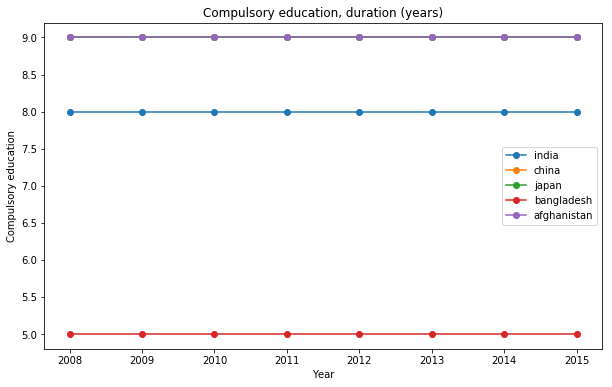

In [504]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Compulsory education, duration (years)'
ylabel = 'Compulsory education'

asian = plot_features(asian_countries, feature, label, ylabel)

### Asian countries w.r.t Unemployment

In [505]:
india = miscellaneous.loc[['India'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; india['Year'] = year
china = miscellaneous.loc[['China'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; china['Year'] = year
japan = miscellaneous.loc[['Japan'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; japan['Year'] = year
bangladesh = miscellaneous.loc[['Bangladesh'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; bangladesh['Year'] = year
afghanistan = miscellaneous.loc[['Afghanistan'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; afghanistan['Year'] = year

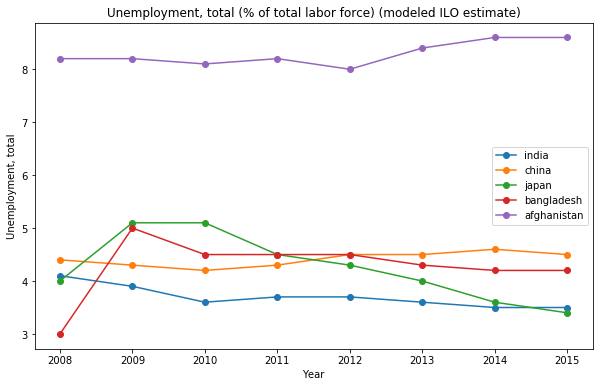

In [506]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
ylabel = 'Unemployment, total'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Afghanistan's unemployment is way too much

### Asian countries w.r.t Health expenditure

In [507]:
india = miscellaneous.loc[['India'], ['Health expenditure, total (% of GDP)']]; india['Year'] = year
china = miscellaneous.loc[['China'], ['Health expenditure, total (% of GDP)']]; china['Year'] = year
japan = miscellaneous.loc[['Japan'], ['Health expenditure, total (% of GDP)']]; japan['Year'] = year
bangladesh = miscellaneous.loc[['Bangladesh'], ['Health expenditure, total (% of GDP)']]; bangladesh['Year'] = year
afghanistan = miscellaneous.loc[['Afghanistan'], ['Health expenditure, total (% of GDP)']]; afghanistan['Year'] = year

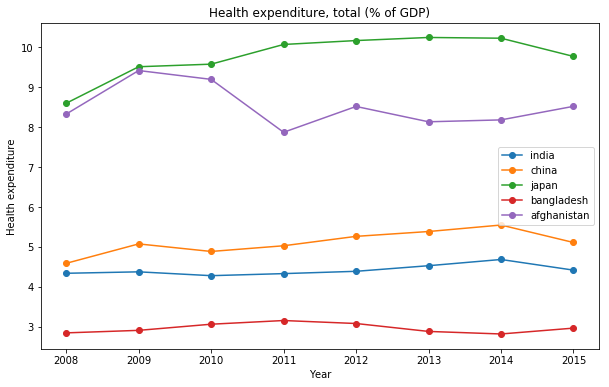

In [508]:
asian_countries = [india, china, japan, bangladesh, afghanistan]
label = ['india', 'china', 'japan', 'bangladesh', 'afghanistan']
feature = 'Health expenditure, total (% of GDP)'
ylabel = 'Health expenditure'

asian = plot_features(asian_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Bangladesh, India and China can improve upon their Health expenditure

### North American countries w.r.t Compulsory education

In [509]:
canada = miscellaneous.loc[['Canada'], ['Compulsory education, duration (years)']]; canada['Year'] = year
north_america = miscellaneous.loc[['North America'], ['Compulsory education, duration (years)']]; north_america['Year'] = year
united_states = miscellaneous.loc[['United States'], ['Compulsory education, duration (years)']]; united_states['Year'] = year

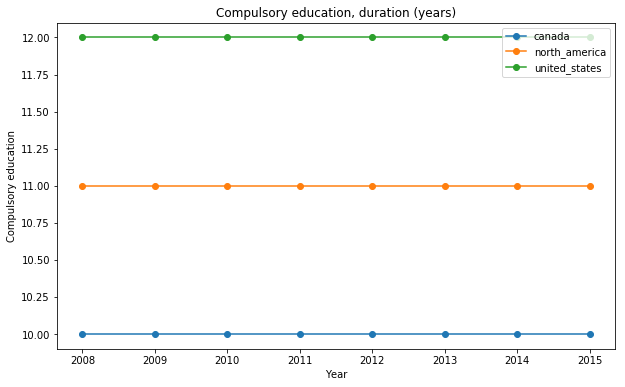

In [510]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Compulsory education, duration (years)'
ylabel = 'Compulsory education'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### North American countries w.r.t Unemployment

In [511]:
canada = miscellaneous.loc[['Canada'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; canada['Year'] = year
north_america = miscellaneous.loc[['North America'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; north_america['Year'] = year
united_states = miscellaneous.loc[['United States'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; united_states['Year'] = year

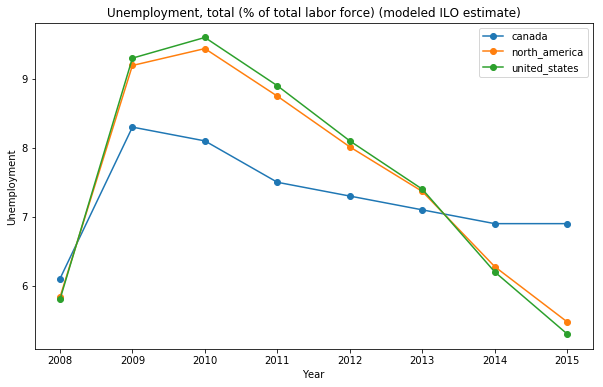

In [512]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
ylabel = 'Unemployment'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Unemployment has significantly decreased since 2010

### North American countries w.r.t Health expenditure

In [513]:
canada = miscellaneous.loc[['Canada'], ['Health expenditure, total (% of GDP)']]; canada['Year'] = year
north_america = miscellaneous.loc[['North America'], ['Health expenditure, total (% of GDP)']]; north_america['Year'] = year
united_states = miscellaneous.loc[['United States'], ['Health expenditure, total (% of GDP)']]; united_states['Year'] = year

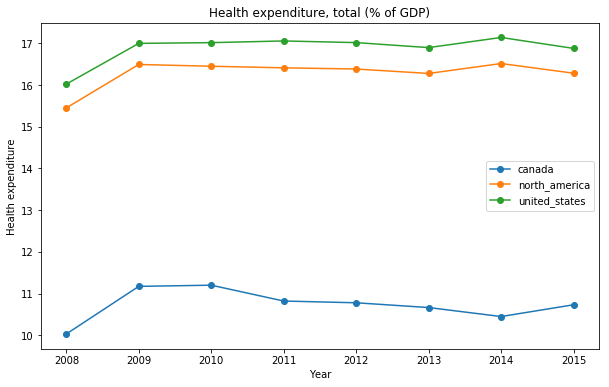

In [514]:
north_american_countries = [canada, north_america, united_states]
label = ['canada', 'north_america', 'united_states']
feature = 'Health expenditure, total (% of GDP)'
ylabel = 'Health expenditure'

north_american = plot_features(north_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Canada can improve compared to there counterparts

### European countries w.r.t compulsory education

In [515]:
united_kingdom = miscellaneous.loc[['United Kingdom'], ['Compulsory education, duration (years)']]; united_kingdom['Year'] = year
france = miscellaneous.loc[['France'], ['Compulsory education, duration (years)']]; france['Year'] = year
germany = miscellaneous.loc[['Germany'], ['Compulsory education, duration (years)']]; germany['Year'] = year
russian_federation = miscellaneous.loc[['Russian Federation'], ['Compulsory education, duration (years)']]; russian_federation['Year'] = year
greece = miscellaneous.loc[['Greece'], ['Compulsory education, duration (years)']]; greece['Year'] = year

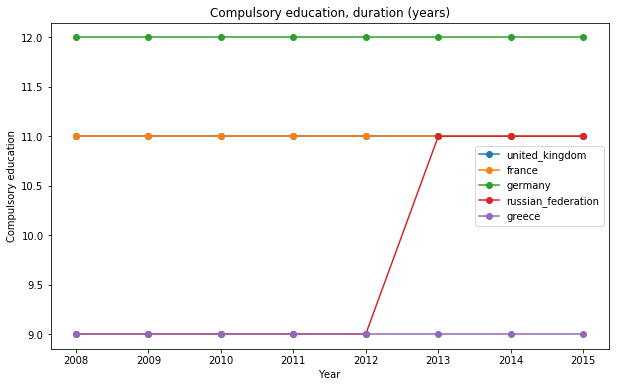

In [516]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Compulsory education, duration (years)'
ylabel = 'Compulsory education'
european = plot_features(european_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Wow Russian Federation has incresed their compulsory education

### European countries w.r.t Unemployment

In [517]:
united_kingdom = miscellaneous.loc[['United Kingdom'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; united_kingdom['Year'] = year
france = miscellaneous.loc[['France'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; france['Year'] = year
germany = miscellaneous.loc[['Germany'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; germany['Year'] = year
russian_federation = miscellaneous.loc[['Russian Federation'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; russian_federation['Year'] = year
greece = miscellaneous.loc[['Greece'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; greece['Year'] = year

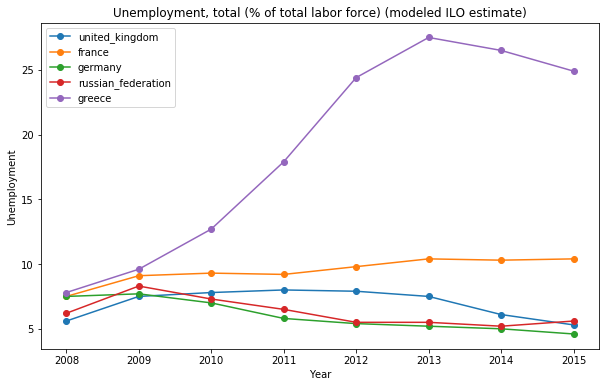

In [518]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
ylabel = 'Unemployment'
european = plot_features(european_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Unemployment in Greece has increased significantly

### European countries w.r.t Health expenditure

In [519]:
united_kingdom = miscellaneous.loc[['United Kingdom'], ['Health expenditure, total (% of GDP)']]; united_kingdom['Year'] = year
france = miscellaneous.loc[['France'], ['Health expenditure, total (% of GDP)']]; france['Year'] = year
germany = miscellaneous.loc[['Germany'], ['Health expenditure, total (% of GDP)']]; germany['Year'] = year
russian_federation = miscellaneous.loc[['Russian Federation'], ['Health expenditure, total (% of GDP)']]; russian_federation['Year'] = year
greece = miscellaneous.loc[['Greece'], ['Health expenditure, total (% of GDP)']]; greece['Year'] = year

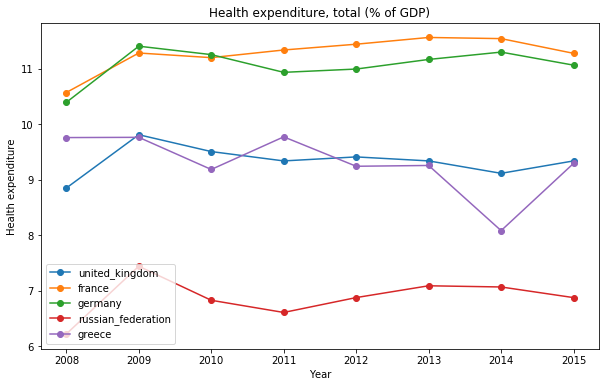

In [520]:
european_countries = [united_kingdom, france, germany, russian_federation, greece]
label = ['united_kingdom', 'france', 'germany', 'russian_federation', 'greece']
feature = 'Health expenditure, total (% of GDP)'
ylabel = 'Health expenditure'
european = plot_features(european_countries, feature, label, ylabel)

### Arab countries w.r.t Compulsory education

In [537]:
iraq = miscellaneous.loc[['Iraq'], ['Compulsory education, duration (years)']]; iraq['Year'] = year
saudi_arabia = miscellaneous.loc[['Saudi Arabia'], ['Compulsory education, duration (years)']]; saudi_arabia['Year'] = year
somalia = miscellaneous.loc[['Somalia'], ['Compulsory education, duration (years)']]; somalia['Year'] = year
sudan = miscellaneous.loc[['Sudan'], ['Compulsory education, duration (years)']]; sudan['Year'] = year
uae = miscellaneous.loc[['United Arab Emirates'], ['Compulsory education, duration (years)']]; uae['Year'] = year


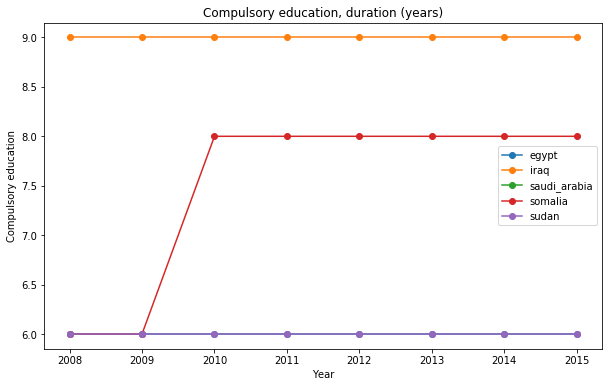

In [538]:
arab_countries = [iraq, saudi_arabia, somalia, sudan, uae]
label = ['egypt', 'iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Compulsory education, duration (years)'
ylabel = 'Compulsory education'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Sudan has increased their compulsory education

### Arab countries w.rt Unemployment

In [539]:
iraq = miscellaneous.loc[['Iraq'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; iraq['Year'] = year
saudi_arabia = miscellaneous.loc[['Saudi Arabia'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; saudi_arabia['Year'] = year
somalia = miscellaneous.loc[['Somalia'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; somalia['Year'] = year
sudan = miscellaneous.loc[['Sudan'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; sudan['Year'] = year
uae = miscellaneous.loc[['United Arab Emirates'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; uae['Year'] = year

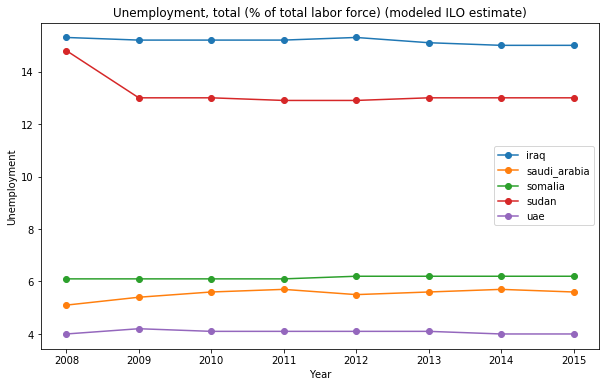

In [540]:
arab_countries = [iraq, saudi_arabia, somalia, sudan, uae]
label = ['iraq', 'saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
ylabel = 'Unemployment'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Iraq and Sudan have to do something to eradicate the unemployment

### Arab countries w.r.t Health expenditure

In [541]:
iraq = miscellaneous.loc[['Iraq'], ['Health expenditure, total (% of GDP)']]; iraq['Year'] = year
saudi_arabia = miscellaneous.loc[['Saudi Arabia'], ['Health expenditure, total (% of GDP)']]; saudi_arabia['Year'] = year
somalia = miscellaneous.loc[['Somalia'], ['Health expenditure, total (% of GDP)']]; somalia['Year'] = year
sudan = miscellaneous.loc[['Sudan'], ['Health expenditure, total (% of GDP)']]; sudan['Year'] = year
uae = miscellaneous.loc[['United Arab Emirates'], ['Health expenditure, total (% of GDP)']]; uae['Year'] = year


IndexError: list index out of range

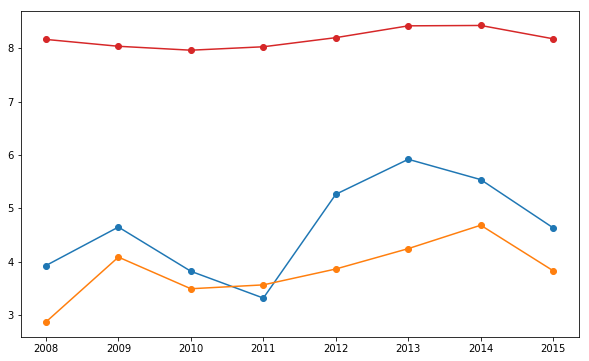

In [542]:
arab_countries = [iraq, saudi_arabia, somalia, sudan, uae]
label = ['saudi_arabia', 'somalia', 'sudan', 'uae']
feature = 'Health expenditure, total (% of GDP)'
ylabel = 'Health expenditure'
arab = plot_features(arab_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Sudan's Health expenditure is not bad

### South American countries w.r.t Compulsory education

In [543]:
brazil = miscellaneous.loc[['Brazil'], ['Compulsory education, duration (years)']]; brazil['Year'] = year
jamaica = miscellaneous.loc[['Jamaica'], ['Compulsory education, duration (years)']]; jamaica['Year'] = year
mexico = miscellaneous.loc[['Mexico'], ['Compulsory education, duration (years)']]; mexico['Year'] = year
venezuela = miscellaneous.loc[['Venezuela, RB'], ['Compulsory education, duration (years)']]; venezuela['Year'] = year
peru = miscellaneous.loc[['Peru'], ['Compulsory education, duration (years)']]; peru['Year'] = year
uruguay = miscellaneous.loc[['Uruguay'], ['Compulsory education, duration (years)']]; uruguay['Year'] = year

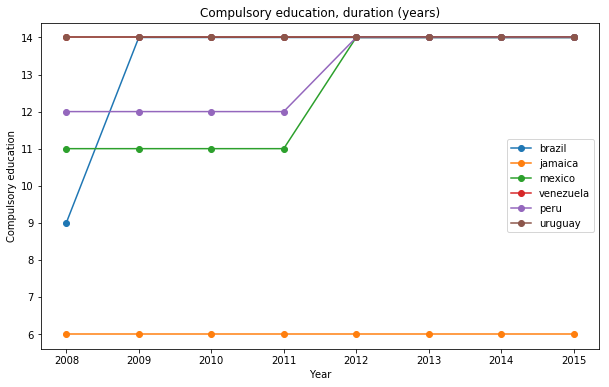

In [544]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Compulsory education, duration (years)'
ylabel = 'Compulsory education'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
### Peru, Brazil and Mexico has increased their compulsory education
### Jamaica must do some amendment in their compulsory education department

### South American countries w.r.t Unemployment

In [545]:
brazil = miscellaneous.loc[['Brazil'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; brazil['Year'] = year
jamaica = miscellaneous.loc[['Jamaica'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; jamaica['Year'] = year
mexico = miscellaneous.loc[['Mexico'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; mexico['Year'] = year
venezuela = miscellaneous.loc[['Venezuela, RB'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; venezuela['Year'] = year
peru = miscellaneous.loc[['Peru'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; peru['Year'] = year
uruguay = miscellaneous.loc[['Uruguay'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; uruguay['Year'] = year

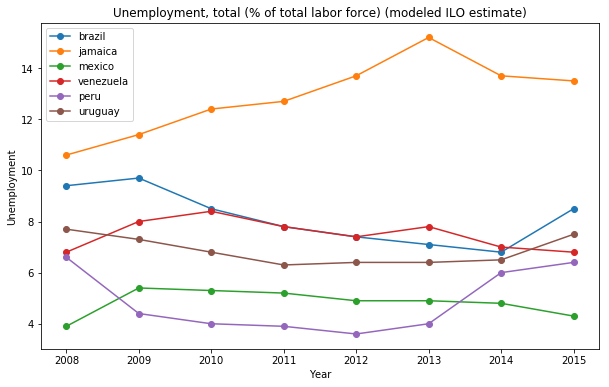

In [546]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
ylabel = 'Unemployment'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### Jamaica's uemployment has increased significantly

### Soth American countries w.r.t Health expenditure

In [547]:
brazil = miscellaneous.loc[['Brazil'], ['Health expenditure, total (% of GDP)']]; brazil['Year'] = year
jamaica = miscellaneous.loc[['Jamaica'], ['Health expenditure, total (% of GDP)']]; jamaica['Year'] = year
mexico = miscellaneous.loc[['Mexico'], ['Health expenditure, total (% of GDP)']]; mexico['Year'] = year
venezuela = miscellaneous.loc[['Venezuela, RB'], ['Health expenditure, total (% of GDP)']]; venezuela['Year'] = year
peru = miscellaneous.loc[['Peru'], ['Health expenditure, total (% of GDP)']]; peru['Year'] = year
uruguay = miscellaneous.loc[['Uruguay'], ['Health expenditure, total (% of GDP)']]; uruguay['Year'] = year

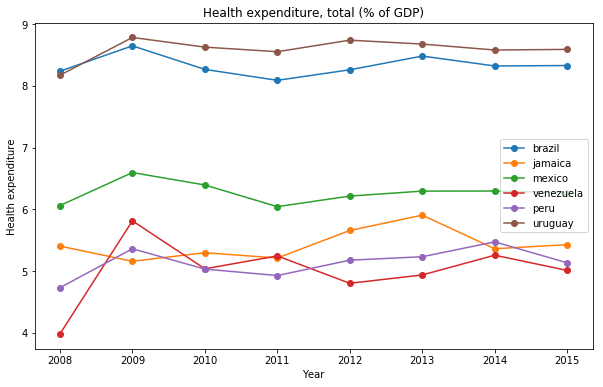

In [548]:
south_american_countries = [brazil, jamaica, mexico, venezuela, peru, uruguay]
label = ['brazil', 'jamaica', 'mexico', 'venezuela', 'peru', 'uruguay']
feature = 'Health expenditure, total (% of GDP)'
ylabel = 'Health expenditure'
south_american = plot_features(south_american_countries, feature, label, ylabel)

### Selected countries w.r.t Compulsory education

In [549]:
india = miscellaneous.loc[['India'], ['Compulsory education, duration (years)']]; india['Year'] = year
china = miscellaneous.loc[['China'], ['Compulsory education, duration (years)']]; china['Year'] = year
japan = miscellaneous.loc[['Japan'], ['Compulsory education, duration (years)']]; japan['Year'] = year
united_kingdom = miscellaneous.loc[['United Kingdom'], ['Compulsory education, duration (years)']]; united_kingdom['Year'] = year
russian_federation = miscellaneous.loc[['Russian Federation'], ['Compulsory education, duration (years)']]; russian_federation['Year'] = year
united_states = miscellaneous.loc[['United States'], ['Compulsory education, duration (years)']]; united_states['Year'] = year
germany = miscellaneous.loc[['Germany'], ['Compulsory education, duration (years)']]; germany['Year'] = year
france = miscellaneous.loc[['France'], ['Compulsory education, duration (years)']]; france['Year'] = year
israel = miscellaneous.loc[['Israel'], ['Compulsory education, duration (years)']]; israel['Year'] = year
saudi_arabia = miscellaneous.loc[['Saudi Arabia'], ['Compulsory education, duration (years)']]; saudi_arabia['Year'] = year
uae = miscellaneous.loc[['United Arab Emirates'], ['Compulsory education, duration (years)']]; uae['Year'] = year
canada = miscellaneous.loc[['Canada'], ['Compulsory education, duration (years)']]; canada['Year'] = year

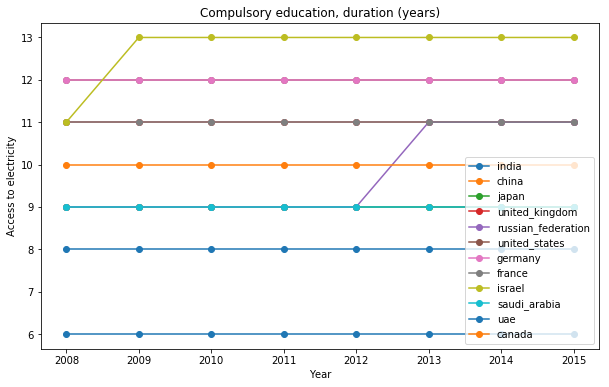

In [550]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Compulsory education, duration (years)'
ylabel = 'Access to electricity'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Selected countries w.r.t Unemployment

In [551]:
india = miscellaneous.loc[['India'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; india['Year'] = year
china = miscellaneous.loc[['China'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; china['Year'] = year
japan = miscellaneous.loc[['Japan'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; japan['Year'] = year
united_kingdom = miscellaneous.loc[['United Kingdom'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; united_kingdom['Year'] = year
russian_federation = miscellaneous.loc[['Russian Federation'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; russian_federation['Year'] = year
united_states = miscellaneous.loc[['United States'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; united_states['Year'] = year
germany = miscellaneous.loc[['Germany'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; germany['Year'] = year
france = miscellaneous.loc[['France'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; france['Year'] = year
israel = miscellaneous.loc[['Israel'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; israel['Year'] = year
saudi_arabia = miscellaneous.loc[['Saudi Arabia'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; saudi_arabia['Year'] = year
uae = miscellaneous.loc[['United Arab Emirates'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; uae['Year'] = year
canada = miscellaneous.loc[['Canada'], ['Unemployment, total (% of total labor force) (modeled ILO estimate)']]; canada['Year'] = year

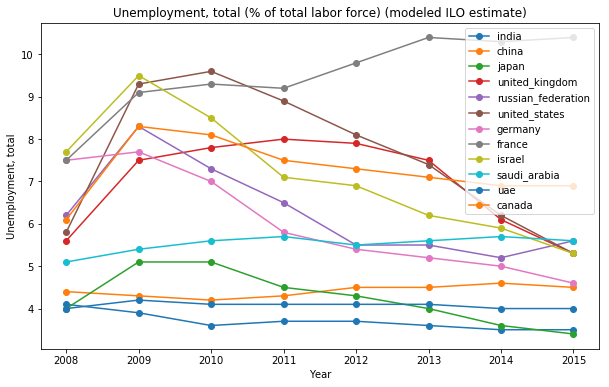

In [552]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Unemployment, total (% of total labor force) (modeled ILO estimate)'
ylabel = 'Unemployment, total'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Selected Countries w.r.t Health expenditure

In [553]:
india = miscellaneous.loc[['India'], ['Health expenditure, total (% of GDP)']]; india['Year'] = year
china = miscellaneous.loc[['China'], ['Health expenditure, total (% of GDP)']]; china['Year'] = year
japan = miscellaneous.loc[['Japan'], ['Health expenditure, total (% of GDP)']]; japan['Year'] = year
united_kingdom = miscellaneous.loc[['United Kingdom'], ['Health expenditure, total (% of GDP)']]; united_kingdom['Year'] = year
russian_federation = miscellaneous.loc[['Russian Federation'], ['Health expenditure, total (% of GDP)']]; russian_federation['Year'] = year
united_states = miscellaneous.loc[['United States'], ['Health expenditure, total (% of GDP)']]; united_states['Year'] = year
germany = miscellaneous.loc[['Germany'], ['Health expenditure, total (% of GDP)']]; germany['Year'] = year
france = miscellaneous.loc[['France'], ['Health expenditure, total (% of GDP)']]; france['Year'] = year
israel = miscellaneous.loc[['Israel'], ['Health expenditure, total (% of GDP)']]; israel['Year'] = year
saudi_arabia = miscellaneous.loc[['Saudi Arabia'], ['Health expenditure, total (% of GDP)']]; saudi_arabia['Year'] = year
uae = miscellaneous.loc[['United Arab Emirates'], ['Health expenditure, total (% of GDP)']]; uae['Year'] = year
canada = miscellaneous.loc[['Canada'], ['Health expenditure, total (% of GDP)']]; canada['Year'] = year

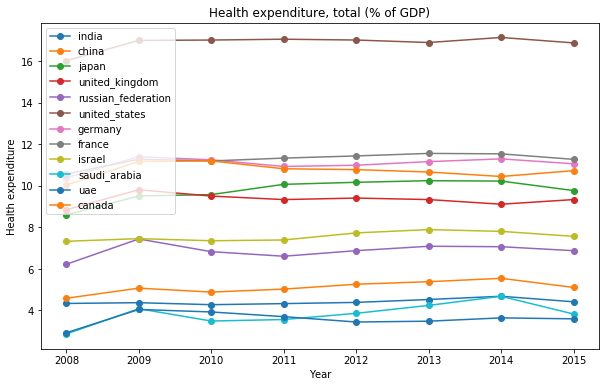

In [554]:
selected_countries = [india, china, japan, united_kingdom, russian_federation, united_states, germany, france, israel, saudi_arabia, uae, canada]
label = ['india', 'china', 'japan', 'united_kingdom', 'russian_federation', 'united_states', 'germany', 'france', 'israel', 'saudi_arabia', 'uae', 'canada']
feature = 'Health expenditure, total (% of GDP)'
ylabel = 'Health expenditure'
selected_countries = plot_features(selected_countries, feature, label, ylabel)

### Some interesting takeaways: 
#### America is way ahead in the health expenditure department

### Top 10 countries w.r.t GDP over the years

In [156]:
top_gdp = (cleaned_data_2008['GDP (current US$)'] + cleaned_data_2009['GDP (current US$)'] + cleaned_data_2010['GDP (current US$)'] + cleaned_data_2011['GDP (current US$)'] + cleaned_data_2012['GDP (current US$)'] + cleaned_data_2013['GDP (current US$)'] + cleaned_data_2014['GDP (current US$)'] + cleaned_data_2015['GDP (current US$)'])/8
top_gdp.nlargest(10)

Country Name
North America         1.767015e+13
United States         1.599753e+13
China                 7.887018e+12
Japan                 5.339699e+12
Germany               3.613485e+12
France                2.737451e+12
United Kingdom        2.705571e+12
Brazil                2.173195e+12
Italy                 2.145579e+12
Russian Federation    1.799622e+12
Name: GDP (current US$), dtype: float64

### Bottom 10 countries w.r.t GDP over the years

In [157]:
bottom_gdp = (cleaned_data_2008['GDP (current US$)'] + cleaned_data_2009['GDP (current US$)'] + cleaned_data_2010['GDP (current US$)'] + cleaned_data_2011['GDP (current US$)'] + cleaned_data_2012['GDP (current US$)'] + cleaned_data_2013['GDP (current US$)'] + cleaned_data_2014['GDP (current US$)'] + cleaned_data_2015['GDP (current US$)'])/8
bottom_gdp.nsmallest(10)

Country Name
Samoa            7.251845e+08
Guinea-Bissau    9.709117e+08
Liberia          1.571536e+09
Bhutan           1.694355e+09
Greenland        2.390117e+09
Lesotho          2.404452e+09
Maldives         2.983067e+09
Togo             3.721680e+09
Montenegro       4.321903e+09
Somalia          5.641333e+09
Name: GDP (current US$), dtype: float64

### Global Ineuality in GDP

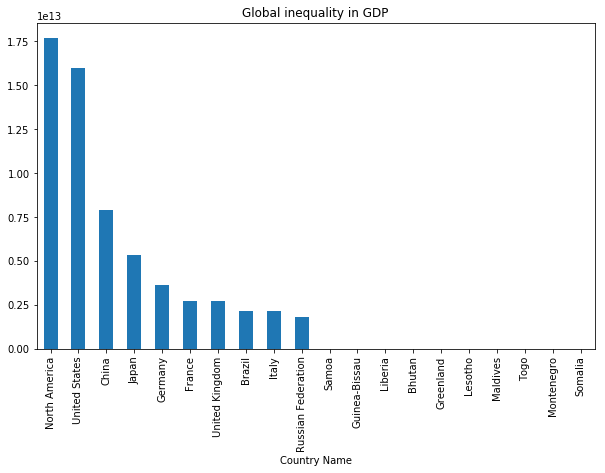

In [263]:
top_bottom_gdp = pd.concat([top_gdp.nlargest(10), bottom_gdp.nsmallest(10)], axis = 0)
top_bottom_gdp.plot.bar(figsize = (10,6), title = 'Global inequality in GDP')

### Top 10 countries w.r.t GDP growth

In [158]:
top_gdp_growth = (cleaned_data_2008['GDP growth (annual %)'] + cleaned_data_2009['GDP growth (annual %)'] + cleaned_data_2010['GDP growth (annual %)'] + cleaned_data_2011['GDP growth (annual %)'] + cleaned_data_2012['GDP growth (annual %)'] + cleaned_data_2013['GDP growth (annual %)'] + cleaned_data_2014['GDP growth (annual %)'] + cleaned_data_2015['GDP growth (annual %)'])/8
top_gdp_growth.nlargest(10)

Country Name
Ethiopia        10.399993
Turkmenistan    10.350000
Monaco          10.000000
Qatar            9.901882
China            8.629807
Myanmar          8.346708
Uzbekistan       8.236565
Mongolia         8.190188
Rwanda           7.819720
Ghana            7.556012
Name: GDP growth (annual %), dtype: float64

### Bottom 10 countries w.r.t GDP growth

In [159]:
bottom_gdp_growth = (cleaned_data_2008['GDP growth (annual %)'] + cleaned_data_2009['GDP growth (annual %)'] + cleaned_data_2010['GDP growth (annual %)'] + cleaned_data_2011['GDP growth (annual %)'] + cleaned_data_2012['GDP growth (annual %)'] + cleaned_data_2013['GDP growth (annual %)'] + cleaned_data_2014['GDP growth (annual %)'] + cleaned_data_2015['GDP growth (annual %)'])/8
bottom_gdp_growth.nsmallest(10)

Country Name
Libya         -13.794354
Greece         -3.667560
Ukraine        -2.368514
Yemen, Rep.    -2.320976
Croatia        -1.101132
Italy          -0.963142
Portugal       -0.643769
Finland        -0.601218
Cyprus         -0.585806
Jamaica        -0.429113
Name: GDP growth (annual %), dtype: float64

### Global Inequality in GDP growth

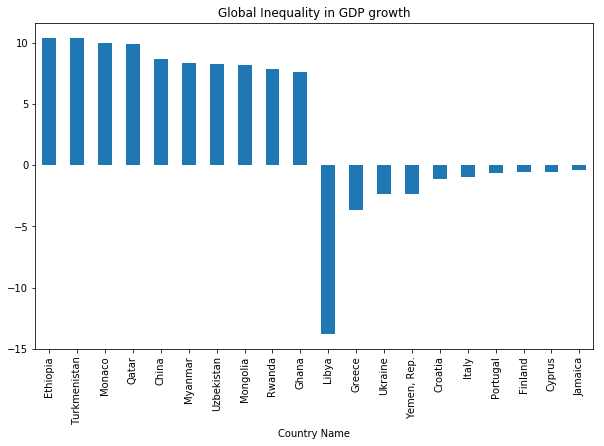

In [264]:
top_bottom_gdp_growth = pd.concat([top_gdp_growth.nlargest(10), bottom_gdp_growth.nsmallest(10)], axis = 0)
top_bottom_gdp_growth.plot.bar(figsize = (10,6), title = 'Global Inequality in GDP growth')

### Top 10 countries w.r.t Imports

In [160]:
top_imports = (cleaned_data_2008['Imports of goods and services (% of GDP)'] + cleaned_data_2009['Imports of goods and services (% of GDP)'] + cleaned_data_2010['Imports of goods and services (% of GDP)'] + cleaned_data_2011['Imports of goods and services (% of GDP)'] + cleaned_data_2012['Imports of goods and services (% of GDP)'] + cleaned_data_2013['Imports of goods and services (% of GDP)'] + cleaned_data_2014['Imports of goods and services (% of GDP)'] + cleaned_data_2015['Imports of goods and services (% of GDP)'])/8
top_imports.nlargest(10)

Country Name
Hong Kong SAR, China    200.508056
Singapore               174.453701
Luxembourg              156.376512
Malta                   149.341288
Liberia                 103.440489
Lesotho                  94.708256
Ireland                  86.235051
Kyrgyz Republic          85.631961
Slovak Republic          84.106540
United Arab Emirates     82.463418
Name: Imports of goods and services (% of GDP), dtype: float64

### Bottom 10 countries w.r.t Imports

In [161]:
bottom_imports = (cleaned_data_2008['Imports of goods and services (% of GDP)'] + cleaned_data_2009['Imports of goods and services (% of GDP)'] + cleaned_data_2010['Imports of goods and services (% of GDP)'] + cleaned_data_2011['Imports of goods and services (% of GDP)'] + cleaned_data_2012['Imports of goods and services (% of GDP)'] + cleaned_data_2013['Imports of goods and services (% of GDP)'] + cleaned_data_2014['Imports of goods and services (% of GDP)'] + cleaned_data_2015['Imports of goods and services (% of GDP)'])/8
bottom_imports.nsmallest(10)

Country Name
Myanmar           9.857410
Brazil           12.965873
Argentina        15.060868
Sudan            15.622744
United States    16.244888
Japan            16.285501
North America    17.676071
Nigeria          17.982310
Pakistan         19.673511
Colombia         20.141109
Name: Imports of goods and services (% of GDP), dtype: float64

### Global Inequalitiy in Imports

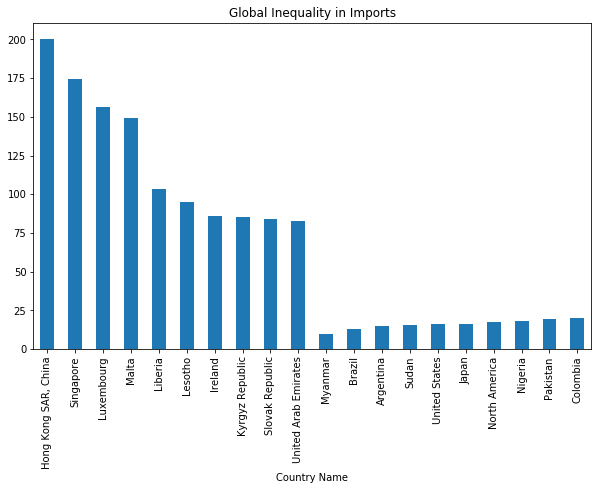

In [265]:
top_bottom_imports = pd.concat([top_imports.nlargest(10), bottom_imports.nsmallest(10)], axis = 0)
top_bottom_imports.plot.bar(figsize = (10,6), title  = 'Global Inequality in Imports')

### Top 10 countries w.r.t Exports

In [162]:
top_exports = (cleaned_data_2008['Exports of goods and services (% of GDP)'] + cleaned_data_2009['Exports of goods and services (% of GDP)'] + cleaned_data_2010['Exports of goods and services (% of GDP)'] + cleaned_data_2011['Exports of goods and services (% of GDP)'] + cleaned_data_2012['Exports of goods and services (% of GDP)'] + cleaned_data_2013['Exports of goods and services (% of GDP)'] + cleaned_data_2014['Exports of goods and services (% of GDP)'] + cleaned_data_2015['Exports of goods and services (% of GDP)'])/8
top_exports.nlargest(10)

Country Name
Hong Kong SAR, China    204.520008
Singapore               198.639254
Luxembourg              188.962576
Malta                   153.054114
Ireland                 104.267373
United Arab Emirates     90.783795
Bahrain                  88.177485
Macao SAR, China         85.237965
Slovak Republic          84.888372
Maldives                 84.159893
Name: Exports of goods and services (% of GDP), dtype: float64

### Bottom 10 countries w.r.t Exports

In [163]:
bottom_exports = (cleaned_data_2008['Exports of goods and services (% of GDP)'] + cleaned_data_2009['Exports of goods and services (% of GDP)'] + cleaned_data_2010['Exports of goods and services (% of GDP)'] + cleaned_data_2011['Exports of goods and services (% of GDP)'] + cleaned_data_2012['Exports of goods and services (% of GDP)'] + cleaned_data_2013['Exports of goods and services (% of GDP)'] + cleaned_data_2014['Exports of goods and services (% of GDP)'] + cleaned_data_2015['Exports of goods and services (% of GDP)'])/8
bottom_exports.nsmallest(10)

Country Name
Myanmar           9.056354
Afghanistan       9.278281
Nepal            10.946467
Brazil           11.728015
Pakistan         12.597727
Ethiopia         12.788632
United States    12.858772
Rwanda           13.254892
Sudan            13.970822
North America    14.490539
Name: Exports of goods and services (% of GDP), dtype: float64

### Global Inequality in Exports

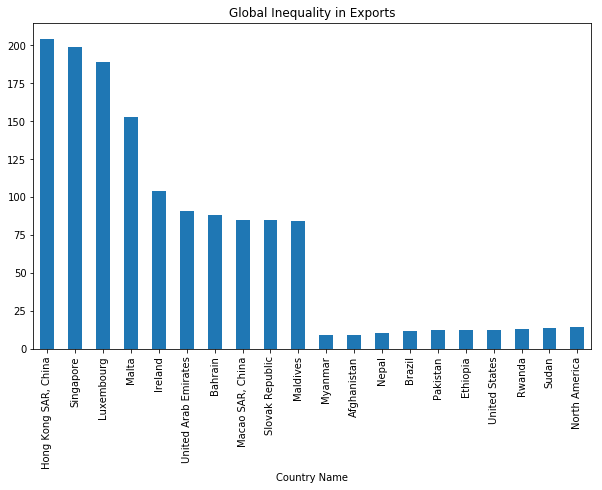

In [267]:
top_bottom_exports = pd.concat([top_exports.nlargest(10), bottom_exports.nsmallest(10)], axis = 0)
top_bottom_exports.plot.bar(figsize = (10,6), title = 'Global Inequality in Exports')

### Top 10 countries w.r.t Population

In [164]:
top_population = (cleaned_data_2008['Population, total'] + cleaned_data_2009['Population, total'] + cleaned_data_2010['Population, total'] + cleaned_data_2011['Population, total'] + cleaned_data_2012['Population, total'] + cleaned_data_2013['Population, total'] + cleaned_data_2014['Population, total'] + cleaned_data_2015['Population, total'])/8
top_population.nlargest(10)

Country Name
China                 1.347664e+09
India                 1.254272e+09
North America         3.473228e+08
United States         3.126926e+08
Indonesia             2.472425e+08
Brazil                1.995629e+08
Pakistan              1.762487e+08
Nigeria               1.653717e+08
Bangladesh            1.549033e+08
Russian Federation    1.432454e+08
Name: Population, total, dtype: float64

### Bottom 10 countries w.r.t Population

In [165]:
bottom_population = (cleaned_data_2008['Population, total'] + cleaned_data_2009['Population, total'] + cleaned_data_2010['Population, total'] + cleaned_data_2011['Population, total'] + cleaned_data_2012['Population, total'] + cleaned_data_2013['Population, total'] + cleaned_data_2014['Population, total'] + cleaned_data_2015['Population, total'])/8
bottom_population.nsmallest(10)

Country Name
Monaco               37396.375
Greenland            56518.500
Samoa               188527.750
New Caledonia       256750.000
Iceland             321956.125
Maldives            381770.375
Malta               419337.375
Luxembourg          526495.250
Macao SAR, China    556770.500
Montenegro          620068.375
Name: Population, total, dtype: float64

### Global Inequality in Population

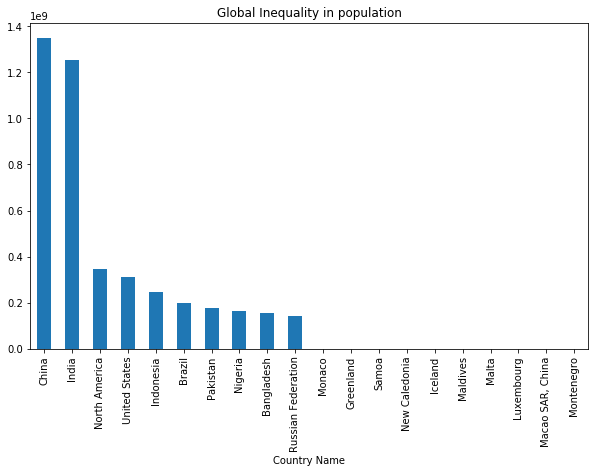

In [269]:
top_bottom_population = pd.concat([top_population.nlargest(10), bottom_population.nsmallest(10)], axis = 0)
top_bottom_population.plot.bar(figsize = (10,6), title = 'Global Inequality in population')

### Top 10 countries w.r.t population growth

In [166]:
top_population_growth = (cleaned_data_2008['Population growth (annual %)'] + cleaned_data_2009['Population growth (annual %)'] + cleaned_data_2010['Population growth (annual %)'] + cleaned_data_2011['Population growth (annual %)'] + cleaned_data_2012['Population growth (annual %)'] + cleaned_data_2013['Population growth (annual %)'] + cleaned_data_2014['Population growth (annual %)'] + cleaned_data_2015['Population growth (annual %)'])/8
top_population_growth.nlargest(10)

Country Name
Qatar                   9.190426
Oman                    5.695942
Kuwait                  5.655735
United Arab Emirates    5.189335
Jordan                  4.891494
Lebanon                 4.487674
Niger                   3.810949
Bahrain                 3.511274
Uganda                  3.397570
Congo, Dem. Rep.        3.321257
Name: Population growth (annual %), dtype: float64

### Bottom 10 countries w.r.t population growth

In [167]:
bottom_population_growth = (cleaned_data_2008['Population growth (annual %)'] + cleaned_data_2009['Population growth (annual %)'] + cleaned_data_2010['Population growth (annual %)'] + cleaned_data_2011['Population growth (annual %)'] + cleaned_data_2012['Population growth (annual %)'] + cleaned_data_2013['Population growth (annual %)'] + cleaned_data_2014['Population growth (annual %)'] + cleaned_data_2015['Population growth (annual %)'])/8
bottom_population_growth.nsmallest(10)

Country Name
Lithuania              -1.331003
Romania                -0.655888
Bulgaria               -0.623879
Syrian Arab Republic   -0.585115
Serbia                 -0.494291
Albania                -0.381666
Ukraine                -0.369673
Croatia                -0.318166
Hungary                -0.267303
Greece                 -0.260179
Name: Population growth (annual %), dtype: float64

### Global Inequality in population growth

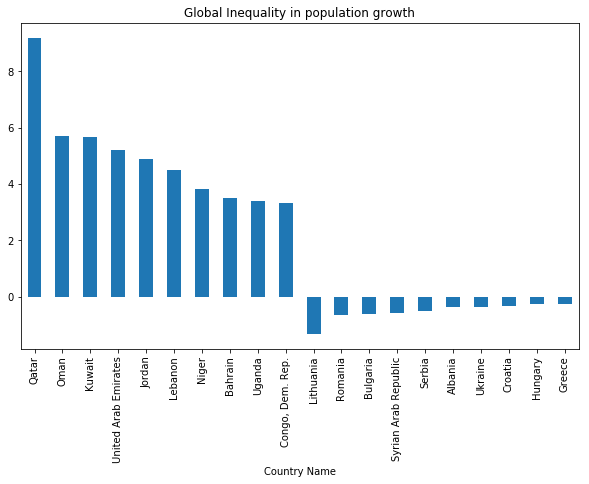

In [271]:
top_bottom_population_growth = pd.concat([top_population_growth.nlargest(10), bottom_population_growth.nsmallest(10)], axis = 0)
top_bottom_population_growth.plot.bar(figsize = (10,6), title = 'Global Inequality in population growth')

### Top 10 countries w.r.t health expenditure

In [168]:
top_health_expenditure = (cleaned_data_2008['Health expenditure, total (% of GDP)'] + cleaned_data_2009['Health expenditure, total (% of GDP)'] + cleaned_data_2010['Health expenditure, total (% of GDP)'] + cleaned_data_2011['Health expenditure, total (% of GDP)'] + cleaned_data_2012['Health expenditure, total (% of GDP)'] + cleaned_data_2013['Health expenditure, total (% of GDP)'] + cleaned_data_2014['Health expenditure, total (% of GDP)'] + cleaned_data_2015['Health expenditure, total (% of GDP)'])/8
top_health_expenditure.nlargest(10)

Country Name
United States    16.878783
North America    16.283813
France           11.274481
Moldova          11.263976
Liberia          11.255973
Switzerland      11.218291
New Zealand      11.153873
Germany          11.061963
Austria          11.058668
Denmark          10.948342
Name: Health expenditure, total (% of GDP), dtype: float64

### Bottom 10 countries w.r.t Health expenditure

In [169]:
bottom_health_expenditure = (cleaned_data_2008['Health expenditure, total (% of GDP)'] + cleaned_data_2009['Health expenditure, total (% of GDP)'] + cleaned_data_2010['Health expenditure, total (% of GDP)'] + cleaned_data_2011['Health expenditure, total (% of GDP)'] + cleaned_data_2012['Health expenditure, total (% of GDP)'] + cleaned_data_2013['Health expenditure, total (% of GDP)'] + cleaned_data_2014['Health expenditure, total (% of GDP)'] + cleaned_data_2015['Health expenditure, total (% of GDP)'])/8
bottom_health_expenditure.nsmallest(10)

Country Name
Turkmenistan            1.989305
Myanmar                 2.051627
Qatar                   2.145264
Oman                    2.702434
Kuwait                  2.764669
Indonesia               2.822270
Pakistan                2.899752
Bangladesh              2.965516
Syrian Arab Republic    3.316679
Sri Lanka               3.416829
Name: Health expenditure, total (% of GDP), dtype: float64

### Global Inequality in Health expenditure

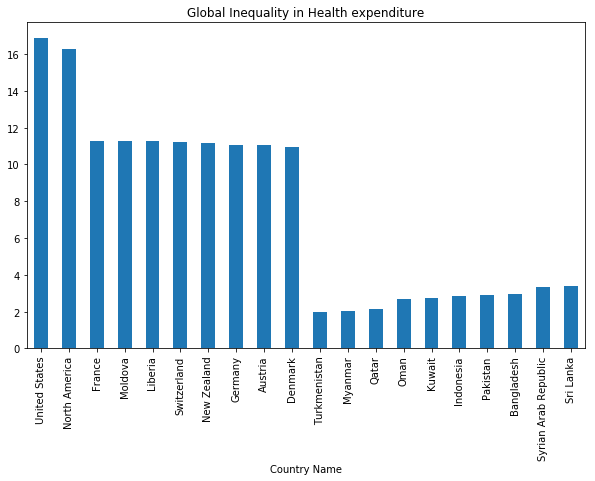

In [272]:
top_bottom_health_expenditure = pd.concat([top_health_expenditure.nlargest(10), bottom_health_expenditure.nsmallest(10)], axis = 0)
top_bottom_health_expenditure.plot.bar(figsize = (10,6), title = 'Global Inequality in Health expenditure')

### Top 10 countries w.r.t GNI

In [170]:
top_GNI = (cleaned_data_2008['GNI (current US$)'] + cleaned_data_2009['GNI (current US$)'] + cleaned_data_2010['GNI (current US$)'] + cleaned_data_2011['GNI (current US$)'] + cleaned_data_2012['GNI (current US$)'] + cleaned_data_2013['GNI (current US$)'] + cleaned_data_2014['GNI (current US$)'] + cleaned_data_2015['GNI (current US$)'])/8
top_GNI.nlargest(10)

Country Name
North America         1.793996e+13
United States         1.629409e+13
China                 7.861699e+12
Japan                 5.497453e+12
Germany               3.686255e+12
France                2.785629e+12
United Kingdom        2.686153e+12
Italy                 2.139353e+12
Brazil                2.115323e+12
Russian Federation    1.743936e+12
Name: GNI (current US$), dtype: float64

### Bottom 10 countries w.r.t GNI

In [171]:
bottom_GNI = (cleaned_data_2008['GNI (current US$)'] + cleaned_data_2009['GNI (current US$)'] + cleaned_data_2010['GNI (current US$)'] + cleaned_data_2011['GNI (current US$)'] + cleaned_data_2012['GNI (current US$)'] + cleaned_data_2013['GNI (current US$)'] + cleaned_data_2014['GNI (current US$)'] + cleaned_data_2015['GNI (current US$)'])/8
bottom_GNI.nsmallest(10)

Country Name
Samoa              6.959798e+08
Guinea-Bissau      9.750609e+08
Liberia            1.348422e+09
Bhutan             1.585798e+09
Lesotho            2.860601e+09
Maldives           3.080615e+09
Togo               3.252625e+09
Montenegro         4.372187e+09
Somalia            5.194000e+09
Kyrgyz Republic    5.799856e+09
Name: GNI (current US$), dtype: float64

### Global Inequality in GNI

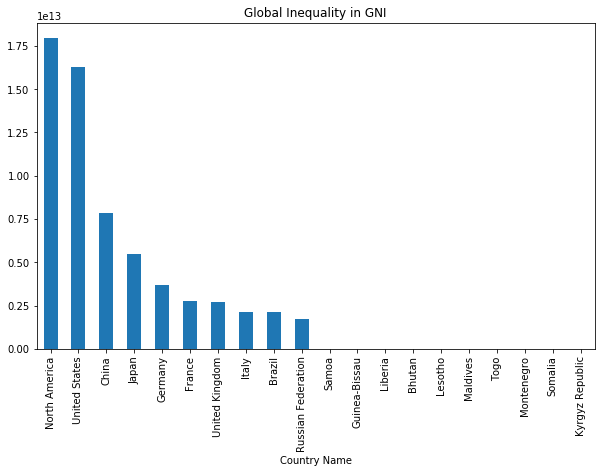

In [273]:
top_bottom_GNI = pd.concat([top_GNI.nlargest(10), bottom_GNI.nsmallest(10)], axis = 0)
top_bottom_GNI.plot.bar(figsize = (10,6), title = 'Global Inequality in GNI')

### Top 10 countries w.r.t GNI growth

In [172]:
top_GNI_growth = (cleaned_data_2008['GNI growth (annual %)'] + cleaned_data_2009['GNI growth (annual %)'] + cleaned_data_2010['GNI growth (annual %)'] + cleaned_data_2011['GNI growth (annual %)'] + cleaned_data_2012['GNI growth (annual %)'] + cleaned_data_2013['GNI growth (annual %)'] + cleaned_data_2014['GNI growth (annual %)'] + cleaned_data_2015['GNI growth (annual %)'])/8
top_GNI_growth.nlargest(10)

Country Name
Tajikistan    11.114118
Mongolia      10.327400
Qatar         10.265501
Ethiopia       9.908551
Azerbaijan     8.635815
Uzbekistan     7.992276
Rwanda         7.544517
Mozambique     7.514910
Ghana          7.217520
India          6.978813
Name: GNI growth (annual %), dtype: float64

### Bottom 10 countries w.r.t GNI growth

In [173]:
bottom_GNI_growth = (cleaned_data_2008['GNI growth (annual %)'] + cleaned_data_2009['GNI growth (annual %)'] + cleaned_data_2010['GNI growth (annual %)'] + cleaned_data_2011['GNI growth (annual %)'] + cleaned_data_2012['GNI growth (annual %)'] + cleaned_data_2013['GNI growth (annual %)'] + cleaned_data_2014['GNI growth (annual %)'] + cleaned_data_2015['GNI growth (annual %)'])/8
bottom_GNI_growth.nsmallest(10)

Country Name
Luxembourg   -4.692300
Greece       -3.313443
Ukraine      -2.318869
Italy        -1.045900
Croatia      -0.925383
Portugal     -0.597748
Finland      -0.556643
Cyprus       -0.247999
Slovenia     -0.196603
Jamaica      -0.134151
Name: GNI growth (annual %), dtype: float64

### Global Inequality in GNI growth

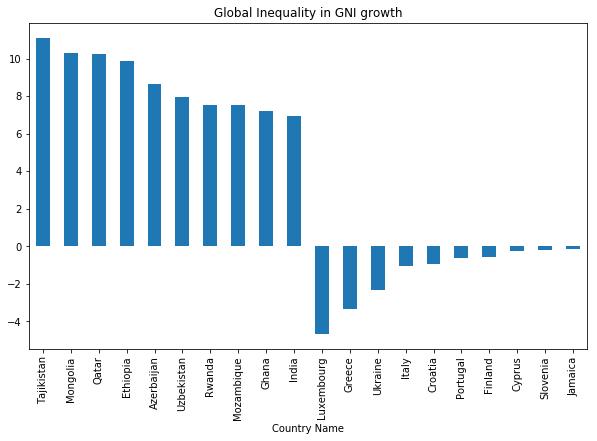

In [275]:
top_bottom_GNI_growth = pd.concat([top_GNI_growth.nlargest(10), bottom_GNI_growth.nsmallest(10)], axis = 0)
top_bottom_GNI_growth.plot.bar(figsize = (10,6), title = 'Global Inequality in GNI growth')

### Top 10 countries w.r.t Unemployment

In [174]:
top_unemployment = (cleaned_data_2008['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2009['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2010['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2011['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2012['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2013['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2014['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2015['Unemployment, total (% of total labor force) (modeled ILO estimate)'])/8
top_unemployment.nlargest(10)

Country Name
Lesotho         27.0125
South Africa    24.3250
Mozambique      23.8875
Spain           20.9875
Namibia         20.2125
Serbia          19.3125
Greece          18.9125
Montenegro      18.7375
Oman            17.8625
Armenia         17.7375
Name: Unemployment, total (% of total labor force) (modeled ILO estimate), dtype: float64

### Bottom 10 countries w.r.t unemployment

In [175]:
bottom_unemployment = (cleaned_data_2008['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2009['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2010['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2011['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2012['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2013['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2014['Unemployment, total (% of total labor force) (modeled ILO estimate)'] + cleaned_data_2015['Unemployment, total (% of total labor force) (modeled ILO estimate)'])/8
bottom_unemployment.nsmallest(10)

Country Name
Cambodia            0.2375
Qatar               0.3500
Myanmar             0.8000
Thailand            0.9500
Bahrain             1.2125
Vietnam             2.1625
Uganda              2.2875
Macao SAR, China    2.3250
Maldives            2.3875
Niger               2.4250
Name: Unemployment, total (% of total labor force) (modeled ILO estimate), dtype: float64

### Global Inequality in Unemployment

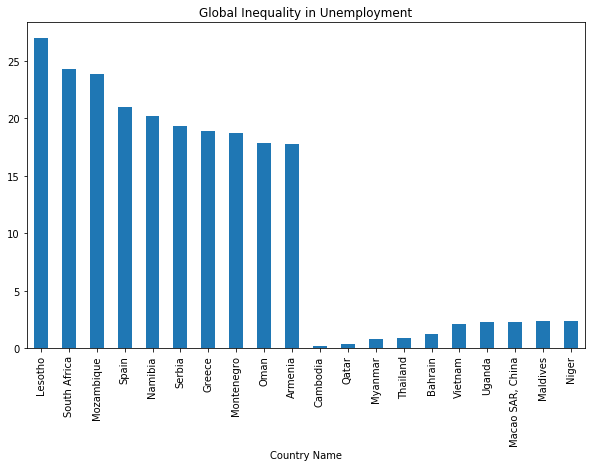

In [276]:
top_bottom_unemployment = pd.concat([top_unemployment.nlargest(10), bottom_unemployment.nsmallest(10)], axis = 0)
top_bottom_unemployment.plot.bar(figsize = (10,6), title = 'Global Inequality in Unemployment')